# SPAC with Weibull as only xylem resistance 

## SPAC soil and xylem 

In [2]:
#values for 51 
import math

# Function to calculate soil hydraulic conductance using van Genuchten model
def soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L):
    """
    Calculate soil hydraulic conductance using van Genuchten model.
    psi_soil: soil water potential (MPa, negative)
    k_s_max: saturated soil hydraulic conductance (kg MPa^-1 s^-1 m^-1)
    alpha: van Genuchten parameter (MPa^-1)
    n: van Genuchten parameter
    A_R_A_L: root-to-leaf area ratio
    Returns effective soil conductance in kg MPa^-1 s^-1
    """
    m = 1 - 1 / n
    Se = (1 + (alpha * abs(psi_soil)) ** n) ** (-m)  # Effective saturation
    k_soil = k_s_max * (Se ** 0.5) * (1 - (1 - Se ** (1 / m)) ** m) ** 2
    k_soil_effective = k_soil * A_R_A_L  # Adjust for root-to-leaf area ratio
    return k_soil_effective

# Function to calculate xylem conductance using Weibull function
def xylem_conductance(psi_leaf, k_xylem_max, d, c):
    """
    Calculate xylem conductance based on water potential.
    psi_leaf: leaf water potential (MPa, negative)
    k_xylem_max: maximum xylem conductance (kg MPa^-1 s^-1)
    d, c: Weibull parameters for cavitation
    Returns conductance in kg MPa^-1 s^-1
    """
    return k_xylem_max * math.exp(-(abs(psi_leaf) / d) ** c)

# Function to calculate whole-plant hydraulic limit and identify bottleneck
def calculate_hydraulic_limit(psi_soil, A_R_A_L, k_s_max, k_xylem_max, alpha, n, d, c, leaf_area):
    """
    Calculate E_max (m h^-1), Psi_min (MPa), and identify bottleneck.
    psi_soil: soil water potential (MPa, negative)
    A_R_A_L: root-to-leaf area ratio
    k_s_max: saturated soil conductance (kg MPa^-1 s^-1 m^-1)
    k_xylem_max: maximum xylem conductance (kg MPa^-1 s^-1)
    alpha, n: van Genuchten soil parameters
    d, c: Weibull xylem parameters
    leaf_area: leaf area (m^2) for transpiration normalization
    Returns E_max (m h^-1), Psi_min (MPa), and bottleneck (str)
    """
    psi_leaf = psi_soil - 0.1  # Initial guess for leaf water potential
    E_max = 0  # Maximum transpiration rate (kg s^-1)
    psi_min = psi_leaf
    bottleneck = "None"
    step = 0.01  # Step size for decreasing psi_leaf (MPa)

    while psi_leaf > -10:  # Stop at very low water potential
        # Calculate conductances
        k_soil = soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L)
        k_xylem = xylem_conductance(psi_leaf, k_xylem_max, d, c)

        # Calculate resistances (R = 1/k)
        R_soil = 1 / k_soil if k_soil > 0 else float('inf')  # MPa s kg^-1
        R_xylem = 1 / k_xylem if k_xylem > 0 else float('inf')  # MPa s kg^-1
        R_total = R_soil + R_xylem  # Total resistance

        # Calculate transpiration using Darcy's law: E = (psi_soil - psi_leaf) / R_total
        E = abs(psi_soil - psi_leaf) / R_total if R_total != float('inf') else 0  # kg s^-1

        # Convert E to m h^-1 (normalized by leaf area)
        # 1 kg s^-1 = 0.001 m^3 s^-1 (water density = 1000 kg m^-3)
        # 0.001 m^3 s^-1 = 0.001 * 3600 m^3 h^-1 = 3.6 m^3 h^-1
        # Normalize by leaf area (m^2) to get m h^-1
        E_m_h = (E * 3.6) / leaf_area if leaf_area > 0 else 0

        # Update E_max and bottleneck if higher
        if E_m_h > E_max:
            E_max = E_m_h
            psi_min = psi_leaf
            # Identify bottleneck: the component with lower conductance (higher resistance)
            bottleneck = "Soil" if k_soil < k_xylem else "Xylem"

        # Decrease leaf water potential
        psi_leaf -= step

        # Stop if conductance is near zero
        if k_soil < 1e-6 or k_xylem < 1e-6:
            break

    return E_max, psi_min, bottleneck, k_xylem, R_xylem

# Example parameters (adjusted for sensitivity to A_R:A_L)
psi_soil = -1.62  # Soil water potential (MPa)
A_R_A_L = 0.05 # Root-to-leaf area ratio (try 1, 5, 10 to see changes)
k_s_max = 0.1998  # Saturated soil conductance (kg MPa^-1 s^-1 m^-1, value from Sperry et al 1998)
k_xylem_max = 0.002114317#0.00005  # Maximum xylem conductance (kg MPa^-1 s^-1, calculated from tracheid data )
alpha = 0.0085   # van Genuchten parameter (MPa^-1)
n = 2.085        # van Genuchten parameter
d = 1.2 #1.99          # Weibull parameter for xylem cavitation
c = 4#.19          # Weibull parameter for xylem cavitation
leaf_area = 4.83  # Leaf area (m^2)

# Run the model
E_max, psi_min, bottleneck,k_xylem, R_xylem = calculate_hydraulic_limit(psi_soil, A_R_A_L, k_s_max, k_xylem_max, alpha, n, d, c, leaf_area)

# Print results
print(f"Maximum Transpiration Rate (E_max): {E_max:.9f} m h^-1")
print(f"Minimum Leaf Water Potential (Psi_min): {psi_min:.2f} MPa")
print(f"Hydraulic Conductance (k_xylem): {k_xylem:.6f} kg MPa^-1 s^-1")
print(f"Resistance (R_xylem): {R_xylem:.2f} MPa s kg^-1")
print(f"Hydraulic Bottleneck: {bottleneck}")

Maximum Transpiration Rate (E_max): 0.000002307 m h^-1
Minimum Leaf Water Potential (Psi_min): -1.72 MPa
Hydraulic Conductance (k_xylem): 0.000001 kg MPa^-1 s^-1
Resistance (R_xylem): 1061371.86 MPa s kg^-1
Hydraulic Bottleneck: Xylem


In [3]:
### values for DF49
import math

# Function to calculate soil hydraulic conductance using van Genuchten model
def soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L):
    """
    Calculate soil hydraulic conductance using van Genuchten model.
    psi_soil: soil water potential (MPa, negative)
    k_s_max: saturated soil hydraulic conductance (kg MPa^-1 s^-1 m^-1)
    alpha: van Genuchten parameter (MPa^-1)
    n: van Genuchten parameter
    A_R_A_L: root-to-leaf area ratio
    Returns effective soil conductance in kg MPa^-1 s^-1
    """
    m = 1 - 1 / n
    Se = (1 + (alpha * abs(psi_soil)) ** n) ** (-m)  # Effective saturation
    k_soil = k_s_max * (Se ** 0.5) * (1 - (1 - Se ** (1 / m)) ** m) ** 2
    k_soil_effective = k_soil * A_R_A_L  # Adjust for root-to-leaf area ratio
    return k_soil_effective

# Function to calculate xylem conductance using Weibull function
def xylem_conductance(psi_leaf, k_xylem_max, d, c):
    """
    Calculate xylem conductance based on water potential.
    psi_leaf: leaf water potential (MPa, negative)
    k_xylem_max: maximum xylem conductance (kg MPa^-1 s^-1)
    d, c: Weibull parameters for cavitation
    Returns conductance in kg MPa^-1 s^-1
    """
    return k_xylem_max * math.exp(-(abs(psi_leaf) / d) ** c)

# Function to calculate whole-plant hydraulic limit and identify bottleneck
def calculate_hydraulic_limit(psi_soil, A_R_A_L, k_s_max, k_xylem_max, alpha, n, d, c, leaf_area):
    """
    Calculate E_max (m h^-1), Psi_min (MPa), and identify bottleneck.
    psi_soil: soil water potential (MPa, negative)
    A_R_A_L: root-to-leaf area ratio
    k_s_max: saturated soil conductance (kg MPa^-1 s^-1 m^-1)
    k_xylem_max: maximum xylem conductance (kg MPa^-1 s^-1)
    alpha, n: van Genuchten soil parameters
    d, c: Weibull xylem parameters
    leaf_area: leaf area (m^2) for transpiration normalization
    Returns E_max (m h^-1), Psi_min (MPa), and bottleneck (str)
    """
    psi_leaf = psi_soil - 0.1  # Initial guess for leaf water potential
    E_max = 0  # Maximum transpiration rate (kg s^-1)
    psi_min = psi_leaf
    bottleneck = "None"
    step = 0.01  # Step size for decreasing psi_leaf (MPa)

    while psi_leaf > -10:  # Stop at very low water potential
        # Calculate conductances
        k_soil = soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L)
        k_xylem = xylem_conductance(psi_leaf, k_xylem_max, d, c)

        # Calculate resistances (R = 1/k)
        R_soil = 1 / k_soil if k_soil > 0 else float('inf')  # MPa s kg^-1
        R_xylem = 1 / k_xylem if k_xylem > 0 else float('inf')  # MPa s kg^-1
        R_total = R_soil + R_xylem  # Total resistance

        # Calculate transpiration using Darcy's law: E = (psi_soil - psi_leaf) / R_total
        E = abs(psi_soil - psi_leaf) / R_total if R_total != float('inf') else 0  # kg s^-1

        # Convert E to m h^-1 (normalized by leaf area)
        # 1 kg s^-1 = 0.001 m^3 s^-1 (water density = 1000 kg m^-3)
        # 0.001 m^3 s^-1 = 0.001 * 3600 m^3 h^-1 = 3.6 m^3 h^-1
        # Normalize by leaf area (m^2) to get m h^-1
        E_m_h = (E * 3.6) / leaf_area if leaf_area > 0 else 0

        # Update E_max and bottleneck if higher
        if E_m_h > E_max:
            E_max = E_m_h
            psi_min = psi_leaf
            # Identify bottleneck: the component with lower conductance (higher resistance)
            bottleneck = "Soil" if k_soil < k_xylem else "Xylem"

        # Decrease leaf water potential
        psi_leaf -= step

        # Stop if conductance is near zero
        if k_soil < 1e-10 or k_xylem < 1e-10:
            break

    return E_max, psi_min, bottleneck, k_xylem, R_xylem 

# Example parameters (adjusted for sensitivity to A_R:A_L)
psi_soil = -1.67  # Soil water potential (MPa)
A_R_A_L = 5 # Root-to-leaf area ratio (try 1, 5, 10 to see changes)
k_s_max = 0.21  # Saturated soil conductance (kg MPa^-1 s^-1 m^-1, tuned for balance)
k_xylem_max = 0.0626 #0.00005  # Maximum xylem conductance (kg MPa^-1 s^-1, tuned for balance)
alpha = 0.0085   # van Genuchten parameter (MPa^-1)
n = 2.085        # van Genuchten parameter
d = 4         # Weibull parameter for xylem cavitation
c = 1.9         # Weibull parameter for xylem cavitation
leaf_area = 143  # Leaf area (m^2)

# Run the model
E_max, psi_min, bottleneck, k_xylem, R_xylem = calculate_hydraulic_limit(psi_soil, A_R_A_L, k_s_max, k_xylem_max, alpha, n, d, c, leaf_area)

# Print results
print(f"Maximum Transpiration Rate (E_max): {E_max:.6f} m h^-1")
print(f"Minimum Leaf Water Potential (Psi_min): {psi_min:.2f} MPa")
print(f"Hydraulic Conductance (k_xylem): {k_xylem:.6f} kg MPa^-1 s^-1")
print(f"Resistance (R_xylem): {R_xylem:.6f} MPa s kg^-1")
print(f"Hydraulic Bottleneck: {bottleneck}")

Maximum Transpiration Rate (E_max): 0.001324 m h^-1
Minimum Leaf Water Potential (Psi_min): -3.88 MPa
Hydraulic Conductance (k_xylem): 0.000209 kg MPa^-1 s^-1
Resistance (R_xylem): 4787.492679 MPa s kg^-1
Hydraulic Bottleneck: Xylem


## SPAC soil, xylem and stomatal conductance

In [4]:
### values for DF49
import math

# Function to calculate soil hydraulic conductance using van Genuchten model
def soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L):
    """
    Calculate soil hydraulic conductance using van Genuchten model.
    psi_soil: soil water potential (MPa, negative)
    k_s_max: saturated soil hydraulic conductance (kg MPa^-1 s^-1 m^-1)
    alpha: van Genuchten parameter (MPa^-1)
    n: van Genuchten parameter
    A_R_A_L: root-to-leaf area ratio
    Returns effective soil conductance in kg MPa^-1 s^-1
    """
    m = 1 - 1 / n
    Se = (1 + (alpha * abs(psi_soil)) ** n) ** (-m)  # Effective saturation
    k_soil = k_s_max * (Se ** 0.5) * (1 - (1 - Se ** (1 / m)) ** m) ** 2
    k_soil_effective = k_soil * A_R_A_L
    return k_soil_effective

# Function to calculate xylem conductance using Weibull function
def xylem_conductance(psi_leaf, k_xylem_max, d, c):
    """
    Calculate xylem conductance based on water potential.
    psi_leaf: leaf water potential (MPa, negative)
    k_xylem_max: maximum xylem conductance (kg MPa^-1 s^-1)
    d, c: Weibull parameters for cavitation
    Returns conductance in kg MPa^-1 s^-1
    """
    return k_xylem_max * math.exp(-(abs(psi_leaf) / d) ** c)

# Function to calculate stomatal conductance and limit transpiration
def stomatal_limit(VPD, g_s, leaf_area):
    """
    Calculate stomatal-limited transpiration and resistance.
    VPD: vapor pressure deficit (MPa)
    g_s: stomatal conductance (kg MPa^-1 s^-1 m^-2)
    leaf_area: leaf area (m^2)
    Returns E_stomatal (kg s^-1), R_stomatal (MPa s kg^-1)
    """
    E_stomatal = g_s * VPD * leaf_area  # kg s^-1
    R_stomatal = 1 / (g_s*leaf_area ) if g_s*leaf_area  > 0 else float('inf')  # MPa s kg^-1 * leaf_area
    return E_stomatal, R_stomatal

# Function to calculate hydraulic limit with stomatal regulation
def calculate_hydraulic_limit(psi_soil, A_R_A_L, k_s_max, k_xylem_max, alpha, n, d, c, leaf_area, VPD, g_s):
    """
    Calculate E_max (m h^-1), Psi_min (MPa), bottleneck, and resistance contributions.
    psi_soil: soil water potential (MPa, negative)
    A_R_A_L: root-to-leaf area ratio
    k_s_max: saturated soil conductance (kg MPa^-1 s^-1 m^-1)
    k_xylem_max: maximum xylem conductance (kg MPa^-1 s^-1)
    alpha, n: van Genuchten soil parameters
    d, c: Weibull xylem parameters
    leaf_area: leaf area (m^2)
    VPD: vapor pressure deficit (MPa)
    g_s: stomatal conductance (kg MPa^-1 s^-1 m^-2)
    Returns E_max (m h^-1), Psi_min (MPa), bottleneck (str), k_xylem, R_xylem, resistance contributions
    """
    psi_leaf = psi_soil - 0.1 # adjust depending to see behavior at max e.g -1.5 shoud be value we measured 
    E_max = 0
    psi_min = psi_leaf
    bottleneck = "None"
    k_soil_at_max = 0
    k_xylem_at_max = 0
    R_soil_at_max = 0
    R_xylem_at_max = 0
    R_stomatal_at_max = 0
    step = 0.01

    while psi_leaf > -10:
        # Calculate conductances and resistances
        k_soil = soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L)
        k_xylem = xylem_conductance(psi_leaf, k_xylem_max, d, c)
        R_soil = 1 / k_soil if k_soil > 0 else float('inf')
        R_xylem = 1 / k_xylem if k_xylem > 0 else float('inf')
        E_stomatal, R_stomatal = stomatal_limit(VPD, g_s, leaf_area)
        R_total = R_soil + R_xylem + R_stomatal

        # Calculate transpiration using Darcy's law
        E_hydraulic = abs(psi_soil - psi_leaf) / R_total if R_total != float('inf') else 0
        E = min(E_hydraulic, E_stomatal)  # Limit by stomatal conductance
        E_m_h = (E * 3.6) / leaf_area if leaf_area > 0 else 0  # Convert to m h^-1

        # Update E_max and resistances if higher
        if E_m_h > E_max:
            E_max = E_m_h
            psi_min = psi_leaf
            k_soil_at_max = k_soil
            k_xylem_at_max = k_xylem
            R_soil_at_max = R_soil
            R_xylem_at_max = R_xylem
            R_stomatal_at_max = R_stomatal
            # Identify bottleneck (lowest conductance, highest resistance)
            conductances = {"Soil": k_soil, "Xylem": k_xylem, "Stomatal": g_s * leaf_area}
            bottleneck = min(conductances, key=conductances.get)

        psi_leaf -= step
        if k_soil < 1e-3 or k_xylem < 1e-3 or (g_s * leaf_area) < 1e-3:
            print(f"Hydraulic failure detected at ψ_leaf = {psi_leaf:.2f} MPa")
            break

    # Calculate resistance contributions
    R_total_at_max = R_soil_at_max + R_xylem_at_max + R_stomatal_at_max
    if R_total_at_max != float('inf'):
        soil_percent = (R_soil_at_max / R_total_at_max) * 100
        xylem_percent = (R_xylem_at_max / R_total_at_max) * 100
        stomatal_percent = (R_stomatal_at_max / R_total_at_max) * 100
    else:
        soil_percent = xylem_percent = stomatal_percent = 0

    return (E_max, psi_min, bottleneck, k_xylem_at_max, R_xylem_at_max,
            soil_percent, xylem_percent, stomatal_percent,R_stomatal_at_max)

# Parameters
psi_soil = -0.3 #-1.62  # Soil water potential (MPa)
A_R_A_L = 5    # Root-to-leaf area ratio
k_s_max = 0.9576  # Saturated soil conductance (kg MPa^-1 s^-1 m^-1)Sandy loam 53.2 mol s-1 m-1 MPa-1= 0.9576 kg MPa-1 s-1 m-1
k_xylem_max = 0.042  # Maximum xylem conductance (kg MPa^-1 s^-1) max calculated/2 
alpha = 0.0085    # van Genuchten parameter (MPa^-1)
n = 2.085         # van Genuchten parameter
d = 6           # Weibull parameter for xylem cavitation
c = 4           # Weibull parameter for xylem cavitation
leaf_area = 96  # Leaf area (m^2)
VPD = 0.006     # VPD (2 kPa = 0.002 MPa, adjust with your data) highest measured for 2021 5.87 kPa and for 2022 4.49 kPa


# Convert stomatal conductance from mol m^-2 s^-1 to kg s^-1 m^-2
g_s_values_mol = [0.002,0.009, 0.02, 0.05, 0.15, 0.3]  # mol m^-2 s^-1 47 to 125 mmol m−2 s−1, Schumann et al 2024 <0.08 mmol m−2 s−1 for pine and juniper McDowell et al 2019 
g_s_values = [g * 0.018 for g in g_s_values_mol]  # kg MPa-1 s^-1 m^-2

# Sensitivity analysis for g_s
for g_s, g_s_mol in zip(g_s_values, g_s_values_mol):
    print(f"\nStomatal Conductance (g_s): {g_s_mol:.4f} mol m^-2 s^-1")
    E_max, psi_min, bottleneck, k_xylem, R_xylem, soil_percent, xylem_percent, stomatal_percent,R_stomatal = calculate_hydraulic_limit(
        psi_soil, A_R_A_L, k_s_max, k_xylem_max, alpha, n, d, c, leaf_area, VPD, g_s
    )
    print(f"Maximum Transpiration Rate (E_max): {E_max:.9f} m h^-1")
    print(f"Minimum Leaf Water Potential (Psi_min): {psi_min:.2f} MPa")
    print(f"Hydraulic Conductance (k_xylem): {k_xylem:.6f} kg MPa^-1 s^-1")
    print(f"Resistance (R_xylem): {R_xylem:.2f} MPa s kg^-1")
    print(f"Hydraulic Bottleneck: {bottleneck}")
    print(f"Soil Resistance Contribution: {soil_percent:.2f}%")
    print(f"Xylem Resistance Contribution: {xylem_percent:.2f}%")
    print(f"Stomatal Resistance Contribution: {stomatal_percent:.2f}%")
    print(f"Stomatal Resistance: {R_stomatal:.2f} MPa s kg^-1")


Stomatal Conductance (g_s): 0.0020 mol m^-2 s^-1
Hydraulic failure detected at ψ_leaf = -8.36 MPa
Maximum Transpiration Rate (E_max): 0.000000778 m h^-1
Minimum Leaf Water Potential (Psi_min): -0.40 MPa
Hydraulic Conductance (k_xylem): 0.041999 kg MPa^-1 s^-1
Resistance (R_xylem): 23.81 MPa s kg^-1
Hydraulic Bottleneck: Stomatal
Soil Resistance Contribution: 0.07%
Xylem Resistance Contribution: 7.60%
Stomatal Resistance Contribution: 92.34%
Stomatal Resistance: 289.35 MPa s kg^-1

Stomatal Conductance (g_s): 0.0090 mol m^-2 s^-1
Hydraulic failure detected at ψ_leaf = -8.36 MPa
Maximum Transpiration Rate (E_max): 0.000003499 m h^-1
Minimum Leaf Water Potential (Psi_min): -0.40 MPa
Hydraulic Conductance (k_xylem): 0.041999 kg MPa^-1 s^-1
Resistance (R_xylem): 23.81 MPa s kg^-1
Hydraulic Bottleneck: Stomatal
Soil Resistance Contribution: 0.24%
Xylem Resistance Contribution: 26.96%
Stomatal Resistance Contribution: 72.80%
Stomatal Resistance: 64.30 MPa s kg^-1

Stomatal Conductance (g_s):

In [5]:
1/(0.042 * math.exp(-(abs(-1.8) / 2.8) ** 6))

25.550745745826845

In [6]:
# #values for 51 
import math

# Function to calculate soil hydraulic conductance using van Genuchten model
def soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L):
    """
    Calculate soil hydraulic conductance using van Genuchten model.
    psi_soil: soil water potential (MPa, negative)
    k_s_max: saturated soil hydraulic conductance (kg MPa^-1 s^-1 m^-1)
    alpha: van Genuchten parameter (MPa^-1)
    n: van Genuchten parameter
    A_R_A_L: root-to-leaf area ratio
    Returns effective soil conductance in kg MPa^-1 s^-1
    """
    m = 1 - 1 / n
    Se = (1 + (alpha * abs(psi_soil)) ** n) ** (-m)  # Effective saturation
    k_soil = k_s_max * (Se ** 0.5) * (1 - (1 - Se ** (1 / m)) ** m) ** 2
    k_soil_effective = k_soil * A_R_A_L
    return k_soil_effective

# Function to calculate xylem conductance using Weibull function
def xylem_conductance(psi_leaf, k_xylem_max, d, c):
    """
    Calculate xylem conductance based on water potential.
    psi_leaf: leaf water potential (MPa, negative)
    k_xylem_max: maximum xylem conductance (kg MPa^-1 s^-1)
    d, c: Weibull parameters for cavitation
    Returns conductance in kg MPa^-1 s^-1
    """
    return k_xylem_max * math.exp(-(abs(psi_leaf) / d) ** c)

# Function to calculate stomatal conductance and limit transpiration
def stomatal_limit(VPD, g_s, leaf_area):
    """
    Calculate stomatal-limited transpiration and resistance.
    VPD: vapor pressure deficit (MPa)
    g_s: stomatal conductance (kg MPa^-1 s^-1 m^-2)
    leaf_area: leaf area (m^2)
    Returns E_stomatal (kg s^-1), R_stomatal (MPa s kg^-1)
    """
    E_stomatal = g_s * VPD * leaf_area  # kg s^-1
    R_stomatal = 1 / (g_s * leaf_area) if g_s * leaf_area > 0 else float('inf')  # MPa s kg^-1
    return E_stomatal, R_stomatal

# Function to calculate hydraulic limit with stomatal regulation
def calculate_hydraulic_limit(psi_soil, A_R_A_L, k_s_max, k_xylem_max, alpha, n, d, c, leaf_area, VPD, g_s):
    """
    Calculate E_max (m h^-1), Psi_min (MPa), bottleneck, and resistance contributions.
    psi_soil: soil water potential (MPa, negative)
    A_R_A_L: root-to-leaf area ratio
    k_s_max: saturated soil conductance (kg MPa^-1 s^-1 m^-1)
    k_xylem_max: maximum xylem conductance (kg MPa^-1 s^-1)
    alpha, n: van Genuchten soil parameters
    d, c: Weibull xylem parameters
    leaf_area: leaf area (m^2)
    VPD: vapor pressure deficit (MPa)
    g_s: stomatal conductance (kg MPa^-1 s^-1 m^-2)
    Returns E_max (m h^-1), Psi_min (MPa), bottleneck (str), k_xylem, R_xylem, resistance contributions
    """
    psi_leaf = psi_soil - 0.1
    E_max = 0
    psi_min = psi_leaf
    bottleneck = "None"
    k_soil_at_max = 0
    k_xylem_at_max = 0
    R_soil_at_max = 0
    R_xylem_at_max = 0
    R_stomatal_at_max = 0
    step = 0.01

    while psi_leaf > -20:
        # Calculate conductances and resistances
        k_soil = soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L)
        k_xylem = xylem_conductance(psi_leaf, k_xylem_max, d, c)
        R_soil = 1 / k_soil if k_soil > 0 else float('inf')
        R_xylem = 1 / k_xylem if k_xylem > 0 else float('inf')
        E_stomatal, R_stomatal = stomatal_limit(VPD, g_s, leaf_area)
        R_total = R_soil + R_xylem + R_stomatal

        # Calculate transpiration using Darcy's law
        E_hydraulic = abs(psi_soil - psi_leaf) / R_total if R_total != float('inf') else 0
        E = min(E_hydraulic, E_stomatal)  # Limit by stomatal conductance
        E_m_h = (E * 3.6) / leaf_area if leaf_area > 0 else 0  # Convert to m h^-1

        # Update E_max and resistances if higher
        if E_m_h > E_max:
            E_max = E_m_h
            psi_min = psi_leaf
            k_soil_at_max = k_soil
            k_xylem_at_max = k_xylem
            R_soil_at_max = R_soil
            R_xylem_at_max = R_xylem
            R_stomatal_at_max = R_stomatal
            # Identify bottleneck (lowest conductance, highest resistance)
            conductances = {"Soil": k_soil, "Xylem": k_xylem, "Stomatal": g_s * leaf_area}
            bottleneck = min(conductances, key=conductances.get)

        psi_leaf -= step
        if k_soil < 1e-3 or k_xylem < 1e-3 or (g_s * leaf_area) < 1e-3:
            print(f"Hydraulic failure detected at ψ_leaf = {psi_leaf:.2f} MPa")
            break

    # Calculate resistance contributions
    R_total_at_max = R_soil_at_max + R_xylem_at_max + R_stomatal_at_max
    if R_total_at_max != float('inf'):
        soil_percent = (R_soil_at_max / R_total_at_max) * 100
        xylem_percent = (R_xylem_at_max / R_total_at_max) * 100
        stomatal_percent = (R_stomatal_at_max / R_total_at_max) * 100
    else:
        soil_percent = xylem_percent = stomatal_percent = 0

    return (E_max, psi_min, bottleneck, k_xylem_at_max, R_xylem_at_max,
            soil_percent, xylem_percent, stomatal_percent,R_stomatal)

# Parameters
psi_soil = -1.62  # Soil water potential (MPa)
A_R_A_L = 5    # Root-to-leaf area ratio
k_s_max = 0.9576  # Saturated soil conductance (kg MPa^-1 s^-1 m^-1)Sandy loam 53.2 mol s-1 m-1 MPa-1= 0.9576 kg MPa-1 s-1 m-1
k_xylem_max = 0.002114317  # Maximum xylem conductance (kg MPa^-1 s^-1)
alpha = 0.0085    # van Genuchten parameter (MPa^-1)
n = 2.085         # van Genuchten parameter
d = 1           # Weibull parameter for xylem cavitation
c = 4.0           # Weibull parameter for xylem cavitation
leaf_area = 4.83  # Leaf area (m^2)
VPD = 0.006       # VPD (2 kPa = 0.002 MPa, adjust with your data)

# Convert stomatal conductance from mol m^-2 s^-1 to kg MPa^-1 s^-1 m^-2
g_s_values_mol = [0.001,0.008, 0.02, 0.05, 0.15, 0.3]  # mol m^-2 s^-1 47 to 125 mmol m−2 s−1, Schumann et al 2024 <0.08 mmol m−2 s−1 for pine and juniper McDowell et al 2019
g_s_values = [g * 0.018 for g in g_s_values_mol]  # kg s^-1 m^-2

# Sensitivity analysis for g_s
for g_s, g_s_mol in zip(g_s_values, g_s_values_mol):
    print(f"\nStomatal Conductance (g_s): {g_s_mol:.3f} mol m^-2 s^-1")
    E_max, psi_min, bottleneck, k_xylem, R_xylem, soil_percent, xylem_percent, stomatal_percent,R_stomatal = calculate_hydraulic_limit(
        psi_soil, A_R_A_L, k_s_max, k_xylem_max, alpha, n, d, c, leaf_area, VPD, g_s
    )
    print(f"Maximum Transpiration Rate (E_max): {E_max:.9f} m h^-1")
    print(f"Minimum Leaf Water Potential (Psi_min): {psi_min:.2f} MPa")
    print(f"Hydraulic Conductance (k_xylem): {k_xylem:.9f} kg MPa^-1 s^-1")
    print(f"Resistance (R_xylem): {R_xylem:.2f} MPa s kg^-1")
    print(f"Hydraulic Bottleneck: {bottleneck}")
    print(f"Soil Resistance Contribution: {soil_percent:.2f}%")
    print(f"Xylem Resistance Contribution: {xylem_percent:.2f}%")
    print(f"Stomatal Resistance Contribution: {stomatal_percent:.2f}%")
    print(f"Stomatal Resistance: {R_stomatal:.2f} MPa s kg^-1")


Stomatal Conductance (g_s): 0.001 mol m^-2 s^-1
Hydraulic failure detected at ψ_leaf = -1.73 MPa
Maximum Transpiration Rate (E_max): 0.000000025 m h^-1
Minimum Leaf Water Potential (Psi_min): -1.72 MPa
Hydraulic Conductance (k_xylem): 0.000000334 kg MPa^-1 s^-1
Resistance (R_xylem): 2991106.70 MPa s kg^-1
Hydraulic Bottleneck: Xylem
Soil Resistance Contribution: 0.00%
Xylem Resistance Contribution: 99.62%
Stomatal Resistance Contribution: 0.38%
Stomatal Resistance: 11502.19 MPa s kg^-1

Stomatal Conductance (g_s): 0.008 mol m^-2 s^-1
Hydraulic failure detected at ψ_leaf = -1.73 MPa
Maximum Transpiration Rate (E_max): 0.000000025 m h^-1
Minimum Leaf Water Potential (Psi_min): -1.72 MPa
Hydraulic Conductance (k_xylem): 0.000000334 kg MPa^-1 s^-1
Resistance (R_xylem): 2991106.70 MPa s kg^-1
Hydraulic Bottleneck: Xylem
Soil Resistance Contribution: 0.00%
Xylem Resistance Contribution: 99.95%
Stomatal Resistance Contribution: 0.05%
Stomatal Resistance: 1437.77 MPa s kg^-1

Stomatal Conduct

## SPAC with Rmax in Weibull function

In [7]:
#DF49

# Function to calculate soil hydraulic conductance using van Genuchten model
def soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L):
    """
    Calculate soil hydraulic conductance using van Genuchten model.
    psi_soil: soil water potential (MPa, negative)
    k_s_max: saturated soil hydraulic conductance (kg MPa^-1 s^-1 m^-1)
    alpha: van Genuchten parameter (MPa^-1)
    n: van Genuchten parameter
    A_R_A_L: root-to-leaf area ratio
    Returns effective soil conductance in kg MPa^-1 s^-1
    """
    m = 1 - 1 / n
    Se = (1 + (alpha * abs(psi_soil)) ** n) ** (-m)  # Effective saturation
    k_soil = k_s_max * (Se ** 0.5) * (1 - (1 - Se ** (1 / m)) ** m) ** 2
    k_soil_effective = k_soil * A_R_A_L
    return k_soil_effective

# Function to calculate xylem resistance using bounded Weibull function
def xylem_resistance(psi_leaf, R_min, R_max, d, b):
    """
    Calculate xylem resistance based on water potential with bounded Weibull.
    psi_leaf: leaf water potential (MPa, negative)
    R_min: minimum xylem resistance (MPa s kg^-1)
    R_max: maximum xylem resistance (MPa s kg^-1)
    d, b: Weibull parameters for cavitation
    Returns resistance in MPa s kg^-1
    """
    if R_max <= R_min:
        return R_min  # Avoid division by zero or invalid range
    return R_min + (R_max - R_min) * (1 - math.exp(-((abs(psi_leaf) / d) ** b)))

# Function to calculate xylem conductance from resistance
def xylem_conductance(psi_leaf, R_min, R_max, d, b):
    """
    Calculate xylem conductance from resistance.
    psi_leaf: leaf water potential (MPa, negative)
    R_min: minimum xylem resistance (MPa s kg^-1)
    R_max: maximum xylem resistance (MPa s kg^-1)
    d, b: Weibull parameters for cavitation
    Returns conductance in kg MPa^-1 s^-1
    """
    R_xylem = xylem_resistance(psi_leaf, R_min, R_max, d, b)
    return 1 / R_xylem if R_xylem > 0 else 0

# Function to calculate stomatal conductance and limit transpiration
def stomatal_limit(VPD, g_s, leaf_area):
    """
    Calculate stomatal-limited transpiration and resistance.
    VPD: vapor pressure deficit (MPa)
    g_s: stomatal conductance (kg MPa^-1 s^-1 m^-2)
    leaf_area: leaf area (m^2)
    Returns E_stomatal (kg s^-1), R_stomatal (MPa s kg^-1)
    """
    E_stomatal = g_s * VPD * leaf_area  # kg s^-1
    R_stomatal = 1 / (g_s * leaf_area) if g_s * leaf_area > 0 else float('inf')  # MPa s kg^-1
    return E_stomatal, R_stomatal

# Function to calculate hydraulic limit with stomatal regulation
def calculate_hydraulic_limit(psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, VPD, g_s):
    """
    Calculate E_max (m h^-1), Psi_min (MPa), bottleneck, and resistance contributions.
    psi_soil: soil water potential (MPa, negative)
    A_R_A_L: root-to-leaf area ratio
    k_s_max: saturated soil conductance (kg MPa^-1 s^-1 m^-1)
    R_min: minimum xylem resistance (MPa s kg^-1)
    R_max: maximum xylem resistance (MPa s kg^-1)
    d, b: Weibull xylem parameters
    alpha, n: van Genuchten soil parameters
    leaf_area: leaf area (m^2)
    VPD: vapor pressure deficit (MPa)
    g_s: stomatal conductance (kg MPa^-1 s^-1 m^-2)
    Returns E_max (m h^-1), Psi_min (MPa), bottleneck (str), k_xylem, R_xylem, resistance contributions
    """
    psi_leaf = psi_soil - 0.1
    E_max = 0
    psi_min = psi_leaf
    bottleneck = "None"
    k_soil_at_max = 0
    k_xylem_at_max = 0
    R_soil_at_max = 0
    R_xylem_at_max = 0
    R_stomatal_at_max = 0
    step = 0.01

    while psi_leaf > -10:
        # Calculate conductances and resistances
        k_soil = soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L)
        k_xylem = xylem_conductance(psi_leaf, R_min, R_max, d, b)
        R_soil = 1 / k_soil if k_soil > 0 else float('inf')
        R_xylem = xylem_resistance(psi_leaf, R_min, R_max, d, b)
        E_stomatal, R_stomatal = stomatal_limit(VPD, g_s, leaf_area)
        R_total = R_soil + R_xylem + R_stomatal

        # Calculate transpiration using Darcy's law
        E_hydraulic = abs(psi_soil - psi_leaf) / R_total if R_total != float('inf') else 0
        E = min(E_hydraulic, E_stomatal)  # Limit by stomatal conductance
        E_m_h = (E * 3.6)*10 / leaf_area if leaf_area > 0 else 0  # Convert to m h^-1

        # Update E_max and resistances if higher
        if E_m_h > E_max:
            E_max = E_m_h
            psi_min = psi_leaf
            k_soil_at_max = k_soil
            k_xylem_at_max = k_xylem
            R_soil_at_max = R_soil
            R_xylem_at_max = R_xylem
            R_stomatal_at_max = R_stomatal
            # Identify bottleneck (lowest conductance, highest resistance)
            conductances = {"Soil": k_soil, "Xylem": k_xylem, "Stomatal": g_s * leaf_area}
            bottleneck = min(conductances, key=conductances.get)

        psi_leaf -= step
        if k_soil < 1e-3 or k_xylem < 1e-4 or (g_s * leaf_area) < 1e-3:
            print(f"Hydraulic failure detected at ψ_leaf = {psi_leaf:.2f} MPa")
            break

    # Calculate resistance contributions
    R_total_at_max = R_soil_at_max + R_xylem_at_max + R_stomatal_at_max
    if R_total_at_max != float('inf'):
        soil_percent = (R_soil_at_max / R_total_at_max) * 100
        xylem_percent = (R_xylem_at_max / R_total_at_max) * 100
        stomatal_percent = (R_stomatal_at_max / R_total_at_max) * 100
    else:
        soil_percent = xylem_percent = stomatal_percent = 0

    return (E_max, psi_min, bottleneck, k_xylem_at_max, R_xylem_at_max,
            soil_percent, xylem_percent, stomatal_percent, R_stomatal_at_max)

# Parameters for DF49 (soil tree)
psi_soil = -1.62  # Soil water potential (MPa)
A_R_A_L = 0.05    # Root-to-leaf area ratio
k_s_max = 0.9576  # Saturated soil conductance (kg MPa^-1 s^-1 m^-1)
R_min = 14.34     # Minimum xylem resistance (MPa s kg^-1) from your data
R_max = 3000      # Maximum xylem resistance (MPa s kg^-1) estimated from trend
d = 4             # Weibull parameter for xylem cavitation (adjust based on fit)
b = 1.9           # Weibull parameter for xylem cavitation (adjust based on fit)
alpha = 0.0085    # van Genuchten parameter (MPa^-1)
n = 2.085         # van Genuchten parameter
leaf_area = 143   # Leaf area (m^2)
VPD = 0.006       # VPD (highest measured: 5.87 kPa = 0.00587 MPa for 2021)

# Convert stomatal conductance from mol m^-2 s^-1 to kg s^-1 m^-2
g_s_values_mol = [0.001, 0.008, 0.02, 0.05, 0.15, 0.3]  # mol m^-2 s^-1
g_s_values = [g * 0.018 for g in g_s_values_mol]  # kg s^-1 m^-2

# Sensitivity analysis for g_s
for g_s, g_s_mol in zip(g_s_values, g_s_values_mol):
    print(f"\nStomatal Conductance (g_s): {g_s_mol:.4f} mol m^-2 s^-1")
    E_max, psi_min, bottleneck, k_xylem, R_xylem, soil_percent, xylem_percent, stomatal_percent, R_stomatal = calculate_hydraulic_limit(
        psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, VPD, g_s
    )
    print(f"Maximum Transpiration Rate (E_max): {E_max:.9f} m h^-1")
    print(f"Minimum Leaf Water Potential (Psi_min): {psi_min:.2f} MPa")
    print(f"Hydraulic Conductance (k_xylem): {k_xylem:.6f} kg MPa^-1 s^-1")
    print(f"Resistance (R_xylem): {R_xylem:.2f} MPa s kg^-1")
    print(f"Hydraulic Bottleneck: {bottleneck}")
    print(f"Soil Resistance Contribution: {soil_percent:.2f}%")
    print(f"Xylem Resistance Contribution: {xylem_percent:.2f}%")
    print(f"Stomatal Resistance Contribution: {stomatal_percent:.2f}%")
    print(f"Stomatal Resistance: {R_stomatal:.2f} MPa s kg^-1")


Stomatal Conductance (g_s): 0.0010 mol m^-2 s^-1
Maximum Transpiration Rate (E_max): 0.000003888 m h^-1
Minimum Leaf Water Potential (Psi_min): -1.72 MPa
Hydraulic Conductance (k_xylem): 0.001791 kg MPa^-1 s^-1
Resistance (R_xylem): 558.44 MPa s kg^-1
Hydraulic Bottleneck: Xylem
Soil Resistance Contribution: 2.20%
Xylem Resistance Contribution: 57.68%
Stomatal Resistance Contribution: 40.12%
Stomatal Resistance: 388.50 MPa s kg^-1

Stomatal Conductance (g_s): 0.0080 mol m^-2 s^-1
Maximum Transpiration Rate (E_max): 0.000031104 m h^-1
Minimum Leaf Water Potential (Psi_min): -1.72 MPa
Hydraulic Conductance (k_xylem): 0.001791 kg MPa^-1 s^-1
Resistance (R_xylem): 558.44 MPa s kg^-1
Hydraulic Bottleneck: Xylem
Soil Resistance Contribution: 3.39%
Xylem Resistance Contribution: 88.88%
Stomatal Resistance Contribution: 7.73%
Stomatal Resistance: 48.56 MPa s kg^-1

Stomatal Conductance (g_s): 0.0200 mol m^-2 s^-1
Maximum Transpiration Rate (E_max): 0.000077760 m h^-1
Minimum Leaf Water Potent

In [8]:
#ES51

# Function to calculate soil hydraulic conductance using van Genuchten model
def soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L):
    """
    Calculate soil hydraulic conductance using van Genuchten model.
    psi_soil: soil water potential (MPa, negative)
    k_s_max: saturated soil hydraulic conductance (kg MPa^-1 s^-1 m^-1)
    alpha: van Genuchten parameter (MPa^-1)
    n: van Genuchten parameter
    A_R_A_L: root-to-leaf area ratio
    Returns effective soil conductance in kg MPa^-1 s^-1
    """
    m = 1 - 1 / n
    Se = (1 + (alpha * abs(psi_soil)) ** n) ** (-m)  # Effective saturation
    k_soil = k_s_max * (Se ** 0.5) * (1 - (1 - Se ** (1 / m)) ** m) ** 2
    k_soil_effective = k_soil * A_R_A_L
    return k_soil_effective

# Function to calculate xylem resistance using bounded Weibull function
def xylem_resistance(psi_leaf, R_min, R_max, d, b):
    """
    Calculate xylem resistance based on water potential with bounded Weibull.
    psi_leaf: leaf water potential (MPa, negative)
    R_min: minimum xylem resistance (MPa s kg^-1)
    R_max: maximum xylem resistance (MPa s kg^-1)
    d, b: Weibull parameters for cavitation
    Returns resistance in MPa s kg^-1
    """
    if R_max <= R_min:
        return R_min  # Avoid division by zero or invalid range
    return R_min + (R_max - R_min) * (1 - math.exp(-((abs(psi_leaf) / d) ** b)))

# Function to calculate xylem conductance from resistance
def xylem_conductance(psi_leaf, R_min, R_max, d, b):
    """
    Calculate xylem conductance from resistance.
    psi_leaf: leaf water potential (MPa, negative)
    R_min: minimum xylem resistance (MPa s kg^-1)
    R_max: maximum xylem resistance (MPa s kg^-1)
    d, b: Weibull parameters for cavitation
    Returns conductance in kg MPa^-1 s^-1
    """
    R_xylem = xylem_resistance(psi_leaf, R_min, R_max, d, b)
    return 1 / R_xylem if R_xylem > 0 else 0

# Function to calculate stomatal conductance and limit transpiration
def stomatal_limit(VPD, g_s, leaf_area):
    """
    Calculate stomatal-limited transpiration and resistance.
    VPD: vapor pressure deficit (MPa)
    g_s: stomatal conductance (kg MPa^-1 s^-1 m^-2)
    leaf_area: leaf area (m^2)
    Returns E_stomatal (kg s^-1), R_stomatal (MPa s kg^-1)
    """
    E_stomatal = g_s * VPD * leaf_area  # kg s^-1
    R_stomatal = 1 / (g_s * leaf_area) if g_s * leaf_area > 0 else float('inf')  # MPa s kg^-1
    return E_stomatal, R_stomatal

# Function to calculate hydraulic limit with stomatal regulation
def calculate_hydraulic_limit(psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, VPD, g_s):
    """
    Calculate E_max (m h^-1), Psi_min (MPa), bottleneck, and resistance contributions.
    psi_soil: soil water potential (MPa, negative)
    A_R_A_L: root-to-leaf area ratio
    k_s_max: saturated soil conductance (kg MPa^-1 s^-1 m^-1)
    R_min: minimum xylem resistance (MPa s kg^-1)
    R_max: maximum xylem resistance (MPa s kg^-1)
    d, b: Weibull xylem parameters
    alpha, n: van Genuchten soil parameters
    leaf_area: leaf area (m^2)
    VPD: vapor pressure deficit (MPa)
    g_s: stomatal conductance (kg MPa^-1 s^-1 m^-2)
    Returns E_max (m h^-1), Psi_min (MPa), bottleneck (str), k_xylem, R_xylem, resistance contributions
    """
    psi_leaf = psi_soil - 0.1
    E_max = 0
    psi_min = psi_leaf
    bottleneck = "None"
    k_soil_at_max = 0
    k_xylem_at_max = 0
    R_soil_at_max = 0
    R_xylem_at_max = 0
    R_stomatal_at_max = 0
    step = 0.01

    while psi_leaf > -10:
        # Calculate conductances and resistances
        k_soil = soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L)
        k_xylem = xylem_conductance(psi_leaf, R_min, R_max, d, b)
        R_soil = 1 / k_soil if k_soil > 0 else float('inf')
        R_xylem = xylem_resistance(psi_leaf, R_min, R_max, d, b)
        E_stomatal, R_stomatal = stomatal_limit(VPD, g_s, leaf_area)
        R_total = R_soil + R_xylem + R_stomatal

        # Calculate transpiration using Darcy's law
        E_hydraulic = abs(psi_soil - psi_leaf) / R_total if R_total != float('inf') else 0
        E = min(E_hydraulic, E_stomatal)  # Limit by stomatal conductance
        E_m_h = (E * 3.6)*10 / leaf_area if leaf_area > 0 else 0  # Convert to m h^-1

        # Update E_max and resistances if higher
        if E_m_h > E_max:
            E_max = E_m_h
            psi_min = psi_leaf
            k_soil_at_max = k_soil
            k_xylem_at_max = k_xylem
            R_soil_at_max = R_soil
            R_xylem_at_max = R_xylem
            R_stomatal_at_max = R_stomatal
            # Identify bottleneck (lowest conductance, highest resistance)
            conductances = {"Soil": k_soil, "Xylem": k_xylem, "Stomatal": g_s * leaf_area}
            bottleneck = min(conductances, key=conductances.get)

        psi_leaf -= step
        if k_soil < 1e-4 or k_xylem < 1e-5 or (g_s * leaf_area) < 1e-4:
            print(f"Hydraulic failure detected at ψ_leaf = {psi_leaf:.2f} MPa")
            break

    # Calculate resistance contributions
    R_total_at_max = R_soil_at_max + R_xylem_at_max + R_stomatal_at_max
    if R_total_at_max != float('inf'):
        soil_percent = (R_soil_at_max / R_total_at_max) * 100
        xylem_percent = (R_xylem_at_max / R_total_at_max) * 100
        stomatal_percent = (R_stomatal_at_max / R_total_at_max) * 100
    else:
        soil_percent = xylem_percent = stomatal_percent = 0

    return (E_max, psi_min, bottleneck, k_xylem_at_max, R_xylem_at_max,
            soil_percent, xylem_percent, stomatal_percent, R_stomatal_at_max)

# Parameters for DF49 (soil tree)
psi_soil = -1.4#-1.62  # Soil water potential (MPa) psileaf at that value measured at -1.4 soil is -2.5 
A_R_A_L = 5    # Root-to-leaf area ratio
k_s_max = 0.9576  # Saturated soil conductance (kg MPa^-1 s^-1 m^-1)Sandy loam 53.2 mol s-1 m-1 MPa-1= 0.9576 kg MPa-1 s-1 m-1
R_min = 472.9     # Minimum xylem resistance (MPa s kg^-1) from your data
R_max = 300000      # Maximum xylem resistance (MPa s kg^-1) estimated from trend
d = 1            # Weibull parameter for xylem cavitation (adjust based on fit)
b = 4           # Weibull parameter for xylem cavitation (adjust based on fit)
alpha = 0.0085    # van Genuchten parameter (MPa^-1)
n = 2.085         # van Genuchten parameter
leaf_area = 4.83   # Leaf area (m^2)
VPD = 0.006       # VPD (highest measured: 5.87 kPa = 0.00587 MPa for 2021)


# Convert stomatal conductance from mol m^-2 s^-1 to kg s^-1 m^-2
g_s_values_mol = [0.001, 0.008, 0.02, 0.05, 0.15, 0.3]  # mol m^-2 s^-1
g_s_values = [g * 0.018 for g in g_s_values_mol]  # kg s^-1 m^-2

# Sensitivity analysis for g_s
for g_s, g_s_mol in zip(g_s_values, g_s_values_mol):
    print(f"\nStomatal Conductance (g_s): {g_s_mol:.4f} mol m^-2 s^-1")
    E_max, psi_min, bottleneck, k_xylem, R_xylem, soil_percent, xylem_percent, stomatal_percent, R_stomatal = calculate_hydraulic_limit(
        psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, VPD, g_s
    )
    print(f"Maximum Transpiration Rate (E_max): {E_max:.9f} m h^-1")
    print(f"Minimum Leaf Water Potential (Psi_min): {psi_min:.2f} MPa")
    print(f"Hydraulic Conductance (k_xylem): {k_xylem:.6f} kg MPa^-1 s^-1")
    print(f"Resistance (R_xylem): {R_xylem:.2f} MPa s kg^-1")
    print(f"Hydraulic Bottleneck: {bottleneck}")
    print(f"Soil Resistance Contribution: {soil_percent:.2f}%")
    print(f"Xylem Resistance Contribution: {xylem_percent:.2f}%")
    print(f"Stomatal Resistance Contribution: {stomatal_percent:.2f}%")
    print(f"Stomatal Resistance: {R_stomatal:.2f} MPa s kg^-1")


Stomatal Conductance (g_s): 0.0010 mol m^-2 s^-1
Hydraulic failure detected at ψ_leaf = -1.51 MPa
Maximum Transpiration Rate (E_max): 0.000002407 m h^-1
Minimum Leaf Water Potential (Psi_min): -1.50 MPa
Hydraulic Conductance (k_xylem): 0.000003 kg MPa^-1 s^-1
Resistance (R_xylem): 298104.08 MPa s kg^-1
Hydraulic Bottleneck: Xylem
Soil Resistance Contribution: 0.00%
Xylem Resistance Contribution: 96.28%
Stomatal Resistance Contribution: 3.72%
Stomatal Resistance: 11502.19 MPa s kg^-1

Stomatal Conductance (g_s): 0.0080 mol m^-2 s^-1
Hydraulic failure detected at ψ_leaf = -1.51 MPa
Maximum Transpiration Rate (E_max): 0.000002488 m h^-1
Minimum Leaf Water Potential (Psi_min): -1.50 MPa
Hydraulic Conductance (k_xylem): 0.000003 kg MPa^-1 s^-1
Resistance (R_xylem): 298104.08 MPa s kg^-1
Hydraulic Bottleneck: Xylem
Soil Resistance Contribution: 0.00%
Xylem Resistance Contribution: 99.52%
Stomatal Resistance Contribution: 0.48%
Stomatal Resistance: 1437.77 MPa s kg^-1

Stomatal Conductance (

## SPAC plots 

In [9]:
import math
import plotly.graph_objects as go

# Function to calculate soil hydraulic conductance using van Genuchten model
def soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L):
    m = 1 - 1 / n
    Se = (1 + (alpha * abs(psi_soil)) ** n) ** (-m)
    k_soil = k_s_max * (Se ** 0.5) * (1 - (1 - Se ** (1 / m)) ** m) ** 2
    k_soil_effective = k_soil * A_R_A_L
    return k_soil_effective

# Function to calculate xylem resistance using bounded Weibull function
def xylem_resistance(psi_leaf, R_min, R_max, d, b):
    if R_max <= R_min:
        return R_min
    return R_min + (R_max - R_min) * (1 - math.exp(-((abs(psi_leaf) / d) ** b)))

# Function to calculate xylem conductance from resistance
def xylem_conductance(psi_leaf, R_min, R_max, d, b):
    R_xylem = xylem_resistance(psi_leaf, R_min, R_max, d, b)
    return 1 / R_xylem if R_xylem > 0 else 0

# Function to calculate stomatal conductance and limit transpiration
def stomatal_limit(VPD, g_s, leaf_area):
    E_stomatal = g_s * VPD * leaf_area
    R_stomatal = 1 / (g_s * leaf_area) if g_s * leaf_area > 0 else float('inf')
    return E_stomatal, R_stomatal

# Function to calculate hydraulic limit with stomatal regulation
def calculate_hydraulic_limit(psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, VPD, g_s):
    psi_leaf = psi_soil - 0.1
    E_max = 0
    psi_min = psi_leaf
    bottleneck = "None"
    k_soil_at_max = 0
    k_xylem_at_max = 0
    R_soil_at_max = 0
    R_xylem_at_max = 0
    R_stomatal_at_max = 0
    step = 0.01

    while psi_leaf > -10:
        k_soil = soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L)
        k_xylem = xylem_conductance(psi_leaf, R_min, R_max, d, b)
        R_soil = 1 / k_soil if k_soil > 0 else float('inf')
        R_xylem = xylem_resistance(psi_leaf, R_min, R_max, d, b)
        E_stomatal, R_stomatal = stomatal_limit(VPD, g_s, leaf_area)
        R_total = R_soil + R_xylem + R_stomatal

        E_hydraulic = abs(psi_soil - psi_leaf) / R_total if R_total != float('inf') else 0
        E = min(E_hydraulic, E_stomatal)
        E_m_h = (E * 3.6 * 10) / leaf_area if leaf_area > 0 else 0

        if E_m_h > E_max:
            E_max = E_m_h
            psi_min = psi_leaf
            k_soil_at_max = k_soil
            k_xylem_at_max = k_xylem
            R_soil_at_max = R_soil
            R_xylem_at_max = R_xylem
            R_stomatal_at_max = R_stomatal
            conductances = {"Soil": k_soil, "Xylem": k_xylem, "Stomatal": g_s * leaf_area}
            bottleneck = min(conductances, key=conductances.get)

        psi_leaf -= step
        if k_soil < 1e-2 or k_xylem < 1e-2 or (g_s * leaf_area) < 1e-2:
            break

    R_total_at_max = R_soil_at_max + R_xylem_at_max + R_stomatal_at_max
    if R_total_at_max != float('inf'):
        soil_percent = (R_soil_at_max / R_total_at_max) * 100
        xylem_percent = (R_xylem_at_max / R_total_at_max) * 100
        stomatal_percent = (R_stomatal_at_max / R_total_at_max) * 100
    else:
        soil_percent = xylem_percent = stomatal_percent = 0

    return (E_max, psi_min, bottleneck, k_xylem_at_max, R_xylem_at_max,
            soil_percent, xylem_percent, stomatal_percent, R_stomatal_at_max)

# Parameters for ES51
psi_soil = -1.4  # Soil water potential (MPa)
A_R_A_L = 5      # Root-to-leaf area ratio
k_s_max = 0.9576 # Saturated soil conductance (kg MPa^-1 s^-1 m^-1)
R_min = 472.9    # Minimum xylem resistance (MPa s kg^-1)
R_max = 300000   # Maximum xylem resistance (MPa s kg^-1)
d = 1            # Weibull parameter d
b = 4            # Weibull parameter b
alpha = 0.0085   # van Genuchten alpha (MPa^-1)
n = 2.085        # van Genuchten n
leaf_area = 4.83 # Leaf area (m^2)
VPD = 0.006      # VPD (MPa)

# Convert stomatal conductance from mol m^-2 s^-1 to kg MPa^-1 s^-1 m^-2
g_s_values_mol = [0.001, 0.008, 0.02]#, 0.05, 0.1]#0.15, 0.3]  # mol m^-2 s^-1
g_s_values = [g * 0.018 for g in g_s_values_mol]  # kg MPa^-1 s^-1 m^-2

# Collect data for plotting
g_s_mol_list = []
soil_percents = []
xylem_percents = []
stomatal_percents = []

for g_s, g_s_mol in zip(g_s_values, g_s_values_mol):
    print(f"\nStomatal Conductance (g_s): {g_s_mol:.4f} mol m^-2 s^-1")
    E_max, psi_min, bottleneck, k_xylem, R_xylem, soil_percent, xylem_percent, stomatal_percent, R_stomatal = calculate_hydraulic_limit(
        psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, VPD, g_s
    )
    print(f"Maximum Transpiration Rate (E_max): {E_max:.9f} m h^-1")
    print(f"Minimum Leaf Water Potential (Psi_min): {psi_min:.2f} MPa")
    print(f"Hydraulic Conductance (k_xylem): {k_xylem:.6f} kg MPa^-1 s^-1")
    print(f"Resistance (R_xylem): {R_xylem:.2f} MPa s kg^-1")
    print(f"Hydraulic Bottleneck: {bottleneck}")
    print(f"Soil Resistance Contribution: {soil_percent:.2f}%")
    print(f"Xylem Resistance Contribution: {xylem_percent:.2f}%")
    print(f"Stomatal Resistance Contribution: {stomatal_percent:.2f}%")
    print(f"Stomatal Resistance: {R_stomatal:.2f} MPa s kg^-1")

    # Store data for plotting
    g_s_mol_list.append(g_s_mol)
    soil_percents.append(soil_percent)
    xylem_percents.append(xylem_percent)
    stomatal_percents.append(stomatal_percent)

# Create interactive bar plot with Plotly
fig = go.Figure()

fig.add_trace(go.Bar(
    x=g_s_mol_list,
    y=soil_percents,
    name='Soil',
    marker_color='blue'
))

fig.add_trace(go.Bar(
    x=g_s_mol_list,
    y=xylem_percents,
    name='Xylem',
    marker_color='green'
))

fig.add_trace(go.Bar(
    x=g_s_mol_list,
    y=stomatal_percents,
    name='Stomatal',
    marker_color='red'
))

# Update layout
fig.update_layout(
    #title='Resistance Contributions vs. Stomatal Conductance',
    xaxis_title='Stomatal Conductance (mol m^-2 s^-1)',
    yaxis_title='Resistance Contribution (%)',
    barmode='group',
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
    bargap=0.2
)

# Add caption with parameters
# caption = (f"Parameters: ψ_soil = {psi_soil} MPa, A_R_A_L = {A_R_A_L}, k_s_max = {k_s_max} kg MPa^-1 s^-1 m^-1, "
#            f"R_min = {R_min} MPa s kg^-1, R_max = {R_max} MPa s kg^-1, d = {d}, b = {b}, "
#            f"α = {alpha} MPa^-1, n = {n}, leaf_area = {leaf_area} m^2, VPD = {VPD} MPa")
# fig.add_annotation(
#     #text=caption,
#     xref="paper", yref="paper",
#     x=0.5, y=-0.2,
#     showarrow=False,
#     font=dict(size=10),
#     align="center"
# )
print(f"Parameters: ψ_soil = {psi_soil} MPa, A_R_A_L = {A_R_A_L}, k_s_max = {k_s_max} kg MPa^-1 s^-1 m^-1, "
           f"R_min = {R_min} MPa s kg^-1, R_max = {R_max} MPa s kg^-1, d = {d}, b = {b}, "
           f"α = {alpha} MPa^-1, n = {n}, leaf_area = {leaf_area} m^2, VPD = {VPD} MPa")
# Show the plot
fig.show()


Stomatal Conductance (g_s): 0.0010 mol m^-2 s^-1
Maximum Transpiration Rate (E_max): 0.000002407 m h^-1
Minimum Leaf Water Potential (Psi_min): -1.50 MPa
Hydraulic Conductance (k_xylem): 0.000003 kg MPa^-1 s^-1
Resistance (R_xylem): 298104.08 MPa s kg^-1
Hydraulic Bottleneck: Xylem
Soil Resistance Contribution: 0.00%
Xylem Resistance Contribution: 96.28%
Stomatal Resistance Contribution: 3.72%
Stomatal Resistance: 11502.19 MPa s kg^-1

Stomatal Conductance (g_s): 0.0080 mol m^-2 s^-1
Maximum Transpiration Rate (E_max): 0.000002488 m h^-1
Minimum Leaf Water Potential (Psi_min): -1.50 MPa
Hydraulic Conductance (k_xylem): 0.000003 kg MPa^-1 s^-1
Resistance (R_xylem): 298104.08 MPa s kg^-1
Hydraulic Bottleneck: Xylem
Soil Resistance Contribution: 0.00%
Xylem Resistance Contribution: 99.52%
Stomatal Resistance Contribution: 0.48%
Stomatal Resistance: 1437.77 MPa s kg^-1

Stomatal Conductance (g_s): 0.0200 mol m^-2 s^-1
Maximum Transpiration Rate (E_max): 0.000002495 m h^-1
Minimum Leaf Wat

In [10]:
import math
import plotly.graph_objects as go

# Function to calculate soil hydraulic conductance using van Genuchten model
def soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L):
    m = 1 - 1 / n
    Se = (1 + (alpha * abs(psi_soil)) ** n) ** (-m)
    k_soil = k_s_max * (Se ** 0.5) * (1 - (1 - Se ** (1 / m)) ** m) ** 2
    k_soil_effective = k_soil * A_R_A_L
    return k_soil_effective

# Function to calculate xylem resistance using bounded Weibull function
def xylem_resistance(psi_leaf, R_min, R_max, d, b):
    if R_max <= R_min:
        return R_min
    return R_min + (R_max - R_min) * (1 - math.exp(-((abs(psi_leaf) / d) ** b)))

# Function to calculate xylem conductance from resistance
def xylem_conductance(psi_leaf, R_min, R_max, d, b):
    R_xylem = xylem_resistance(psi_leaf, R_min, R_max, d, b)
    return 1 / R_xylem if R_xylem > 0 else 0

# Function to calculate stomatal conductance and limit transpiration
def stomatal_limit(VPD, g_s, leaf_area):
    E_stomatal = g_s * VPD * leaf_area
    R_stomatal = 1 / (g_s * leaf_area) if g_s * leaf_area > 0 else float('inf')
    return E_stomatal, R_stomatal

# Function to calculate hydraulic limit with stomatal regulation
def calculate_hydraulic_limit(psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, VPD, g_s):
    psi_leaf = psi_soil - 0.1
    E_max = 0
    psi_min = psi_leaf
    bottleneck = "None"
    k_soil_at_max = 0
    k_xylem_at_max = 0
    R_soil_at_max = 0
    R_xylem_at_max = 0
    R_stomatal_at_max = 0
    step = 0.01

    while psi_leaf > -10:
        k_soil = soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L)
        k_xylem = xylem_conductance(psi_leaf, R_min, R_max, d, b)
        R_soil = 1 / k_soil if k_soil > 0 else float('inf')
        R_xylem = xylem_resistance(psi_leaf, R_min, R_max, d, b)
        E_stomatal, R_stomatal = stomatal_limit(VPD, g_s, leaf_area)
        R_total = R_soil + R_xylem + R_stomatal

        E_hydraulic = abs(psi_soil - psi_leaf) / R_total if R_total != float('inf') else 0
        E = min(E_hydraulic, E_stomatal)
        E_m_h = (E * 3.6 * 10) / leaf_area if leaf_area > 0 else 0

        if E_m_h > E_max:
            E_max = E_m_h
            psi_min = psi_leaf
            k_soil_at_max = k_soil
            k_xylem_at_max = k_xylem
            R_soil_at_max = R_soil
            R_xylem_at_max = R_xylem
            R_stomatal_at_max = R_stomatal
            conductances = {"Soil": k_soil, "Xylem": k_xylem, "Stomatal": g_s * leaf_area}
            bottleneck = min(conductances, key=conductances.get)

        psi_leaf -= step
        if k_soil < 1e-2 or k_xylem < 1e-2 or (g_s * leaf_area) < 1e-2:
            break

    R_total_at_max = R_soil_at_max + R_xylem_at_max + R_stomatal_at_max
    if R_total_at_max != float('inf'):
        soil_percent = (R_soil_at_max / R_total_at_max) * 100
        xylem_percent = (R_xylem_at_max / R_total_at_max) * 100
        stomatal_percent = (R_stomatal_at_max / R_total_at_max) * 100
    else:
        soil_percent = xylem_percent = stomatal_percent = 0

    return (E_max, psi_min, bottleneck, k_xylem_at_max, R_xylem_at_max,
            soil_percent, xylem_percent, stomatal_percent, R_stomatal_at_max)

# Parameters for DF49 (soil tree)
psi_soil = -1.62  # Soil water potential (MPa)
A_R_A_L = 0.05    # Root-to-leaf area ratio
k_s_max = 0.9576  # Saturated soil conductance (kg MPa^-1 s^-1 m^-1)
R_min = 14.34     # Minimum xylem resistance (MPa s kg^-1) from your data
R_max = 3000      # Maximum xylem resistance (MPa s kg^-1) estimated from trend
d = 4             # Weibull parameter for xylem cavitation (adjust based on fit)
b = 1.9           # Weibull parameter for xylem cavitation (adjust based on fit)
alpha = 0.0085    # van Genuchten parameter (MPa^-1)
n = 2.085         # van Genuchten parameter
leaf_area = 143   # Leaf area (m^2)
VPD = 0.006       # VPD (highest measured: 5.87 kPa = 0.00587 MPa for 2021)

# Convert stomatal conductance from mol m^-2 s^-1 to kg MPa^-1 s^-1 m^-2
g_s_values_mol = [0.001, 0.008, 0.02]#, 0.05, 0.1]#0.15, 0.3]  # mol m^-2 s^-1
g_s_values = [g * 0.018 for g in g_s_values_mol]  # kg MPa^-1 s^-1 m^-2

# Collect data for plotting
g_s_mol_list = []
soil_percents = []
xylem_percents = []
stomatal_percents = []

for g_s, g_s_mol in zip(g_s_values, g_s_values_mol):
    print(f"\nStomatal Conductance (g_s): {g_s_mol:.4f} mol m^-2 s^-1")
    E_max, psi_min, bottleneck, k_xylem, R_xylem, soil_percent, xylem_percent, stomatal_percent, R_stomatal = calculate_hydraulic_limit(
        psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, VPD, g_s
    )
    print(f"Maximum Transpiration Rate (E_max): {E_max:.9f} m h^-1")
    print(f"Minimum Leaf Water Potential (Psi_min): {psi_min:.2f} MPa")
    print(f"Hydraulic Conductance (k_xylem): {k_xylem:.6f} kg MPa^-1 s^-1")
    print(f"Resistance (R_xylem): {R_xylem:.2f} MPa s kg^-1")
    print(f"Hydraulic Bottleneck: {bottleneck}")
    print(f"Soil Resistance Contribution: {soil_percent:.2f}%")
    print(f"Xylem Resistance Contribution: {xylem_percent:.2f}%")
    print(f"Stomatal Resistance Contribution: {stomatal_percent:.2f}%")
    print(f"Stomatal Resistance: {R_stomatal:.2f} MPa s kg^-1")

    # Store data for plotting
    g_s_mol_list.append(g_s_mol)
    soil_percents.append(soil_percent)
    xylem_percents.append(xylem_percent)
    stomatal_percents.append(stomatal_percent)

# Create interactive bar plot with Plotly
fig = go.Figure()

fig.add_trace(go.Bar(
    x=g_s_mol_list,
    y=soil_percents,
    name='Soil',
    marker_color='blue'
))

fig.add_trace(go.Bar(
    x=g_s_mol_list,
    y=xylem_percents,
    name='Xylem',
    marker_color='green'
))

fig.add_trace(go.Bar(
    x=g_s_mol_list,
    y=stomatal_percents,
    name='Stomatal',
    marker_color='red'
))

# Update layout
fig.update_layout(
    xaxis_title='Stomatal Conductance (mol m^-2 s^-1)',
    yaxis_title='Resistance Contribution (%)',
    barmode='group',
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
    bargap=0.2
)

print(f"Parameters: ψ_soil = {psi_soil} MPa, A_R_A_L = {A_R_A_L}, k_s_max = {k_s_max} kg MPa^-1 s^-1 m^-1, "
           f"R_min = {R_min} MPa s kg^-1, R_max = {R_max} MPa s kg^-1, d = {d}, b = {b}, "
           f"α = {alpha} MPa^-1, n = {n}, leaf_area = {leaf_area} m^2, VPD = {VPD} MPa")
# Show the plot
fig.show()


Stomatal Conductance (g_s): 0.0010 mol m^-2 s^-1
Maximum Transpiration Rate (E_max): 0.000003888 m h^-1
Minimum Leaf Water Potential (Psi_min): -1.72 MPa
Hydraulic Conductance (k_xylem): 0.001791 kg MPa^-1 s^-1
Resistance (R_xylem): 558.44 MPa s kg^-1
Hydraulic Bottleneck: Xylem
Soil Resistance Contribution: 2.20%
Xylem Resistance Contribution: 57.68%
Stomatal Resistance Contribution: 40.12%
Stomatal Resistance: 388.50 MPa s kg^-1

Stomatal Conductance (g_s): 0.0080 mol m^-2 s^-1
Maximum Transpiration Rate (E_max): 0.000031104 m h^-1
Minimum Leaf Water Potential (Psi_min): -1.72 MPa
Hydraulic Conductance (k_xylem): 0.001791 kg MPa^-1 s^-1
Resistance (R_xylem): 558.44 MPa s kg^-1
Hydraulic Bottleneck: Xylem
Soil Resistance Contribution: 3.39%
Xylem Resistance Contribution: 88.88%
Stomatal Resistance Contribution: 7.73%
Stomatal Resistance: 48.56 MPa s kg^-1

Stomatal Conductance (g_s): 0.0200 mol m^-2 s^-1
Maximum Transpiration Rate (E_max): 0.000042017 m h^-1
Minimum Leaf Water Potent

## SPAC stomatal regulation f(g_s) and varying G_s_max


In [11]:
#DF 49

import plotly.graph_objects as go
from scipy.optimize import root_scalar

# Function to calculate soil hydraulic conductance using van Genuchten model
def soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L):
    m = 1 - 1 / n
    Se = (1 + (alpha * abs(psi_soil)) ** n) ** (-m)
    k_soil = k_s_max * (Se ** 0.5) * (1 - (1 - Se ** (1 / m)) ** m) ** 2
    k_soil_effective = k_soil * A_R_A_L
    return k_soil_effective

# Function to calculate xylem resistance using bounded Weibull function
def xylem_resistance(psi_leaf, R_min, R_max, d, b):
    if R_max <= R_min:
        return R_min
    return R_min + (R_max - R_min) * (1 - math.exp(-((abs(psi_leaf) / d) ** b)))

# Function to calculate xylem conductance from resistance
def xylem_conductance(psi_leaf, R_min, R_max, d, b):
    R_xylem = xylem_resistance(psi_leaf, R_min, R_max, d, b)
    return 1 / R_xylem if R_xylem > 0 else 0

# Function to calculate stomatal conductance and limit transpiration
def stomatal_limit(VPD, g_s, leaf_area):
    E_stomatal = g_s * VPD * leaf_area
    R_stomatal = 1 / (g_s * leaf_area) if g_s * leaf_area > 0 else float('inf')
    return E_stomatal, R_stomatal

# Function to calculate dynamic stomatal conductance based on ψ_leaf
def g_s_func(psi_leaf, g_s_max, psi_50, s):
    return g_s_max / (1 + math.exp((psi_50 - psi_leaf) / s))

# Function to compute the difference between supply and demand for root finding
def supply_demand_diff(psi_leaf, psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, VPD, g_s_max, psi_50, s):
    g_s = g_s_func(psi_leaf, g_s_max, psi_50, s)
    E_demand = g_s * VPD * leaf_area
    k_soil = soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L)
    R_soil = 1 / k_soil if k_soil > 0 else float('inf')
    R_xylem = xylem_resistance(psi_leaf, R_min, R_max, d, b)
    R_total_supply = R_soil + R_xylem
    E_supply = (psi_soil - psi_leaf) / R_total_supply if R_total_supply != float('inf') else 0
    return E_supply - E_demand

# Function to calculate hydraulic limit using equilibrium approach
def calculate_hydraulic_limit(psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, VPD, g_s_max, psi_50, s):
    try:
        # Find ψ_leaf_eq where supply equals demand
        sol = root_scalar(supply_demand_diff, bracket=[-10, psi_soil], 
                          args=(psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, VPD, g_s_max, psi_50, s), 
                          method='brentq')
        if sol.converged:
            psi_leaf_eq = sol.root
            # Compute equilibrium g_s
            g_s_eq = g_s_func(psi_leaf_eq, g_s_max, psi_50, s)
            # Compute equilibrium transpiration E_eq (kg s^-1)
            E_eq = g_s_eq * VPD * leaf_area
            # Convert E_eq to m h^-1 per m^2 leaf area
            E_max = (E_eq * 3.6 * 10 ) / leaf_area if leaf_area > 0 else 0  # Matches your original conversion
            # Compute resistances at equilibrium
            k_soil_eq = soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L)
            R_soil_eq = 1 / k_soil_eq if k_soil_eq > 0 else float('inf')
            R_xylem_eq = xylem_resistance(psi_leaf_eq, R_min, R_max, d, b)
            _, R_stomatal_eq = stomatal_limit(VPD, g_s_eq, leaf_area)
            R_total_eq = R_soil_eq + R_xylem_eq + R_stomatal_eq
            soil_percent = (R_soil_eq / R_total_eq) * 100 if R_total_eq != float('inf') else 0
            xylem_percent = (R_xylem_eq / R_total_eq) * 100 if R_total_eq != float('inf') else 0
            stomatal_percent = (R_stomatal_eq / R_total_eq) * 100 if R_total_eq != float('inf') else 0
            # Determine bottleneck
            k_xylem_eq = xylem_conductance(psi_leaf_eq, R_min, R_max, d, b)
            conductances = {
                "Soil": k_soil_eq,
                "Xylem": k_xylem_eq,
                "Stomatal": g_s_eq * leaf_area
            }
            bottleneck = min(conductances, key=conductances.get)
            psi_min = psi_leaf_eq
            return (E_max, psi_min, bottleneck, k_xylem_eq, R_xylem_eq, soil_percent, xylem_percent, stomatal_percent, R_stomatal_eq)
        else:
            print("Root finding did not converge")
            return None
    except ValueError as e:
        print(f"Error in root finding: {e}")
        return None

# Parameters for DF49 (soil tree)
psi_soil = -1.5  # Soil water potential (MPa)
A_R_A_L = 0.05    # Root-to-leaf area ratio
k_s_max = 0.9576  # Saturated soil conductance (kg MPa^-1 s^-1 m^-1)
R_min = 14.34     # Minimum xylem resistance (MPa s kg^-1)
R_max = 3000      # Maximum xylem resistance (MPa s kg^-1)
d = 4             # Weibull parameter d
b = 1.9           # Weibull parameter b
alpha = 0.0085    # van Genuchten alpha (MPa^-1)
n = 2.085         # van Genuchten n
leaf_area = 143   # Leaf area (m^2)
VPD = 0.006       # VPD (MPa)
psi_50 = -0.15     # ψ_leaf at 50% g_s_max (MPa)
s = 0.15        # Slope factor for stomatal response

# Convert stomatal conductance from mol m^-2 s^-1 to kg MPa^-1 s^-1 m^-2 for g_s_max
g_s_max_values_mol = [0.1,0.2,0.3,0.4]#[0.009, 0.02, 0.05, 0.1]  # mol m^-2 s^-1
g_s_max_values = [g * 0.018 for g in g_s_max_values_mol]  # kg MPa^-1 s^-1 m^-2

# Collect data for plotting
g_s_mol_list = []
soil_percents = []
xylem_percents = []
stomatal_percents = []

for g_s_max, g_s_mol in zip(g_s_max_values, g_s_max_values_mol):
    print(f"\nMaximum Stomatal Conductance (g_s_max): {g_s_mol:.4f} mol m^-2 s^-1")
    result = calculate_hydraulic_limit(
        psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, VPD, g_s_max, psi_50, s
    )
    if result:
        E_max, psi_min, bottleneck, k_xylem, R_xylem, soil_percent, xylem_percent, stomatal_percent, R_stomatal = result
        print(f"Equilibrium Transpiration Rate (E_max): {E_max:.9f} m h^-1")
        print(f"Equilibrium Leaf Water Potential (Psi_min): {psi_min:.2f} MPa")
        print(f"Hydraulic Conductance (k_xylem): {k_xylem:.6f} kg MPa^-1 s^-1")
        print(f"Resistance (R_xylem): {R_xylem:.2f} MPa s kg^-1")
        print(f"Hydraulic Bottleneck: {bottleneck}")
        print(f"Soil Resistance Contribution: {soil_percent:.2f}%")
        print(f"Xylem Resistance Contribution: {xylem_percent:.2f}%")
        print(f"Stomatal Resistance Contribution: {stomatal_percent:.2f}%")
        print(f"Stomatal Resistance: {R_stomatal:.2f} MPa s kg^-1")

        # Store data for plotting
        g_s_mol_list.append(g_s_mol)
        soil_percents.append(soil_percent)
        xylem_percents.append(xylem_percent)
        stomatal_percents.append(stomatal_percent)

# Create interactive bar plot with Plotly
fig = go.Figure()

fig.add_trace(go.Bar(
    x=g_s_mol_list,
    y=soil_percents,
    name='Soil',
    marker_color='blue'
))

fig.add_trace(go.Bar(
    x=g_s_mol_list,
    y=xylem_percents,
    name='Xylem',
    marker_color='green'
))

fig.add_trace(go.Bar(
    x=g_s_mol_list,
    y=stomatal_percents,
    name='Stomatal',
    marker_color='red'
))

# Update layout
fig.update_layout(
    xaxis_title='Maximum Stomatal Conductance (mol m^-2 s^-1)',
    yaxis_title='Resistance Contribution (%)',
    barmode='group',
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
    bargap=0.2
)

print(f"\nParameters: ψ_soil = {psi_soil} MPa, A_R_A_L = {A_R_A_L}, k_s_max = {k_s_max} kg MPa^-1 s^-1 m^-1, "
      f"R_min = {R_min} MPa s kg^-1, R_max = {R_max} MPa s kg^-1, d = {d}, b = {b}, "
      f"α = {alpha} MPa^-1, n = {n}, leaf_area = {leaf_area} m^2, VPD = {VPD} MPa, "
      f"ψ_50 = {psi_50} MPa, s = {s}")

# Show the plot
fig.show()


Maximum Stomatal Conductance (g_s_max): 0.1000 mol m^-2 s^-1
Equilibrium Transpiration Rate (E_max): 0.000000048 m h^-1
Equilibrium Leaf Water Potential (Psi_min): -1.50 MPa
Hydraulic Conductance (k_xylem): 0.002255 kg MPa^-1 s^-1
Resistance (R_xylem): 443.38 MPa s kg^-1
Hydraulic Bottleneck: Stomatal
Soil Resistance Contribution: 0.07%
Xylem Resistance Contribution: 1.39%
Stomatal Resistance Contribution: 98.55%
Stomatal Resistance: 31502.98 MPa s kg^-1

Maximum Stomatal Conductance (g_s_max): 0.2000 mol m^-2 s^-1
Equilibrium Transpiration Rate (E_max): 0.000000096 m h^-1
Equilibrium Leaf Water Potential (Psi_min): -1.50 MPa
Hydraulic Conductance (k_xylem): 0.002255 kg MPa^-1 s^-1
Resistance (R_xylem): 443.42 MPa s kg^-1
Hydraulic Bottleneck: Stomatal
Soil Resistance Contribution: 0.13%
Xylem Resistance Contribution: 2.73%
Stomatal Resistance Contribution: 97.14%
Stomatal Resistance: 15760.77 MPa s kg^-1

Maximum Stomatal Conductance (g_s_max): 0.3000 mol m^-2 s^-1
Equilibrium Transp

In [12]:
#ES51

import plotly.graph_objects as go
from scipy.optimize import root_scalar

# Function to calculate soil hydraulic conductance using van Genuchten model
def soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L):
    m = 1 - 1 / n
    Se = (1 + (alpha * abs(psi_soil)) ** n) ** (-m)
    k_soil = k_s_max * (Se ** 0.5) * (1 - (1 - Se ** (1 / m)) ** m) ** 2
    k_soil_effective = k_soil * A_R_A_L
    return k_soil_effective

# Function to calculate xylem resistance using bounded Weibull function
def xylem_resistance(psi_leaf, R_min, R_max, d, b):
    if R_max <= R_min:
        return R_min
    return R_min + (R_max - R_min) * (1 - math.exp(-((abs(psi_leaf) / d) ** b)))

# Function to calculate xylem conductance from resistance
def xylem_conductance(psi_leaf, R_min, R_max, d, b):
    R_xylem = xylem_resistance(psi_leaf, R_min, R_max, d, b)
    return 1 / R_xylem if R_xylem > 0 else 0

# Function to calculate stomatal conductance and limit transpiration
def stomatal_limit(VPD, g_s, leaf_area):
    E_stomatal = g_s * VPD * leaf_area
    R_stomatal = 1 / (g_s * leaf_area) if g_s * leaf_area > 0 else float('inf')
    return E_stomatal, R_stomatal

# Function to calculate dynamic stomatal conductance based on ψ_leaf
def g_s_func(psi_leaf, g_s_max, psi_50, s):
    return g_s_max / (1 + math.exp((psi_50 - psi_leaf) / s))

# Function to compute the difference between supply and demand for root finding
def supply_demand_diff(psi_leaf, psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, VPD, g_s_max, psi_50, s):
    g_s = g_s_func(psi_leaf, g_s_max, psi_50, s)
    E_demand = g_s * VPD * leaf_area
    k_soil = soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L)
    R_soil = 1 / k_soil if k_soil > 0 else float('inf')
    R_xylem = xylem_resistance(psi_leaf, R_min, R_max, d, b)
    R_total_supply = R_soil + R_xylem
    E_supply = (psi_soil - psi_leaf) / R_total_supply if R_total_supply != float('inf') else 0
    return E_supply - E_demand

# Function to calculate hydraulic limit using equilibrium approach
def calculate_hydraulic_limit(psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, VPD, g_s_max, psi_50, s):
    try:
        # Find ψ_leaf_eq where supply equals demand
        sol = root_scalar(supply_demand_diff, bracket=[-10, psi_soil], 
                          args=(psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, VPD, g_s_max, psi_50, s), 
                          method='brentq')
        if sol.converged:
            psi_leaf_eq = sol.root
            # Compute equilibrium g_s
            g_s_eq = g_s_func(psi_leaf_eq, g_s_max, psi_50, s)
            # Compute equilibrium transpiration E_eq (kg s^-1)
            E_eq = g_s_eq * VPD * leaf_area
            # Convert E_eq to m h^-1 per m^2 leaf area
            E_max = (E_eq * 3.6 * 10 ) / leaf_area if leaf_area > 0 else 0  # Matches your original conversion
            # Compute resistances at equilibrium
            k_soil_eq = soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L)
            R_soil_eq = 1 / k_soil_eq if k_soil_eq > 0 else float('inf')
            R_xylem_eq = xylem_resistance(psi_leaf_eq, R_min, R_max, d, b)
            _, R_stomatal_eq = stomatal_limit(VPD, g_s_eq, leaf_area)
            R_total_eq = R_soil_eq + R_xylem_eq + R_stomatal_eq
            soil_percent = (R_soil_eq / R_total_eq) * 100 if R_total_eq != float('inf') else 0
            xylem_percent = (R_xylem_eq / R_total_eq) * 100 if R_total_eq != float('inf') else 0
            stomatal_percent = (R_stomatal_eq / R_total_eq) * 100 if R_total_eq != float('inf') else 0
            # Determine bottleneck
            k_xylem_eq = xylem_conductance(psi_leaf_eq, R_min, R_max, d, b)
            conductances = {
                "Soil": k_soil_eq,
                "Xylem": k_xylem_eq,
                "Stomatal": g_s_eq * leaf_area
            }
            bottleneck = min(conductances, key=conductances.get)
            psi_min = psi_leaf_eq
            return (E_max, psi_min, bottleneck, k_xylem_eq, R_xylem_eq, soil_percent, xylem_percent, stomatal_percent, R_stomatal_eq)
        else:
            print("Root finding did not converge")
            return None
    except ValueError as e:
        print(f"Error in root finding: {e}")
        return None

# Parameters for ES51 (soil tree)
psi_soil = -1.5  # Soil water potential (MPa)
A_R_A_L = 0.0005    # Root-to-leaf area ratio
k_s_max = 0.9576  # Saturated soil conductance (kg MPa^-1 s^-1 m^-1)
R_min = 472.9     # Minimum xylem resistance (MPa s kg^-1)
R_max = 150000      # Maximum xylem resistance (MPa s kg^-1)
d = 1.99           # Weibull parameter d
b = 4.19         # Weibull parameter b
alpha = 0.0085    # van Genuchten alpha (MPa^-1)
n = 2.085         # van Genuchten n
leaf_area = 4.83  # Leaf area (m^2)
VPD = 0.006       # VPD (MPa)
psi_50 = -0.5    # ψ_leaf at 50% g_s_max (MPa)
s = 0.3          # Slope factor for stomatal response

# Convert stomatal conductance from mol m^-2 s^-1 to kg MPa^-1 s^-1 m^-2 for g_s_max
g_s_max_values_mol = [0.1,0.2,0.3,0.4]#[0.009, 0.02, 0.05, 0.1]  # mol m^-2 s^-1
g_s_max_values = [g * 0.018 for g in g_s_max_values_mol]  # kg MPa^-1 s^-1 m^-2

# Collect data for plotting
g_s_mol_list = []
soil_percents = []
xylem_percents = []
stomatal_percents = []

for g_s_max, g_s_mol in zip(g_s_max_values, g_s_max_values_mol):
    print(f"\nMaximum Stomatal Conductance (g_s_max): {g_s_mol:.4f} mol m^-2 s^-1")
    result = calculate_hydraulic_limit(
        psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, VPD, g_s_max, psi_50, s
    )
    if result:
        E_max, psi_min, bottleneck, k_xylem, R_xylem, soil_percent, xylem_percent, stomatal_percent, R_stomatal = result
        print(f"Equilibrium Transpiration Rate (E_max): {E_max:.9f} m h^-1")
        print(f"Equilibrium Leaf Water Potential (Psi_min): {psi_min:.2f} MPa")
        print(f"Hydraulic Conductance (k_xylem): {k_xylem:.6f} kg MPa^-1 s^-1")
        print(f"Resistance (R_xylem): {R_xylem:.2f} MPa s kg^-1")
        print(f"Hydraulic Bottleneck: {bottleneck}")
        print(f"Soil Resistance Contribution: {soil_percent:.2f}%")
        print(f"Xylem Resistance Contribution: {xylem_percent:.2f}%")
        print(f"Stomatal Resistance Contribution: {stomatal_percent:.2f}%")
        print(f"Stomatal Resistance: {R_stomatal:.2f} MPa s kg^-1")

        # Store data for plotting
        g_s_mol_list.append(g_s_mol)
        soil_percents.append(soil_percent)
        xylem_percents.append(xylem_percent)
        stomatal_percents.append(stomatal_percent)

# Create interactive bar plot with Plotly
fig = go.Figure()

fig.add_trace(go.Bar(
    x=g_s_mol_list,
    y=soil_percents,
    name='Soil',
    marker_color='blue'
))

fig.add_trace(go.Bar(
    x=g_s_mol_list,
    y=xylem_percents,
    name='Xylem',
    marker_color='green'
))

fig.add_trace(go.Bar(
    x=g_s_mol_list,
    y=stomatal_percents,
    name='Stomatal',
    marker_color='red'
))

# Update layout
fig.update_layout(
    xaxis_title='Maximum Stomatal Conductance (mol m^-2 s^-1)',
    yaxis_title='Resistance Contribution (%)',
    barmode='group',
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
    bargap=0.2
)

print(f"\nParameters: ψ_soil = {psi_soil} MPa, A_R_A_L = {A_R_A_L}, k_s_max = {k_s_max} kg MPa^-1 s^-1 m^-1, "
      f"R_min = {R_min} MPa s kg^-1, R_max = {R_max} MPa s kg^-1, d = {d}, b = {b}, "
      f"α = {alpha} MPa^-1, n = {n}, leaf_area = {leaf_area} m^2, VPD = {VPD} MPa, "
      f"ψ_50 = {psi_50} MPa, s = {s}")

# Show the plot
fig.show()


Maximum Stomatal Conductance (g_s_max): 0.1000 mol m^-2 s^-1
Equilibrium Transpiration Rate (E_max): 0.000010680 m h^-1
Equilibrium Leaf Water Potential (Psi_min): -1.57 MPa
Hydraulic Conductance (k_xylem): 0.000021 kg MPa^-1 s^-1
Resistance (R_xylem): 46758.62 MPa s kg^-1
Hydraulic Bottleneck: Xylem
Soil Resistance Contribution: 4.01%
Xylem Resistance Contribution: 88.10%
Stomatal Resistance Contribution: 7.89%
Stomatal Resistance: 4187.26 MPa s kg^-1

Maximum Stomatal Conductance (g_s_max): 0.2000 mol m^-2 s^-1
Equilibrium Transpiration Rate (E_max): 0.000017571 m h^-1
Equilibrium Leaf Water Potential (Psi_min): -1.63 MPa
Hydraulic Conductance (k_xylem): 0.000019 kg MPa^-1 s^-1
Resistance (R_xylem): 53073.87 MPa s kg^-1
Hydraulic Bottleneck: Xylem
Soil Resistance Contribution: 3.68%
Xylem Resistance Contribution: 91.91%
Stomatal Resistance Contribution: 4.41%
Stomatal Resistance: 2545.12 MPa s kg^-1

Maximum Stomatal Conductance (g_s_max): 0.3000 mol m^-2 s^-1
Equilibrium Transpirat

In [13]:
#ES50

import plotly.graph_objects as go
from scipy.optimize import root_scalar

# Function to calculate soil hydraulic conductance using van Genuchten model
def soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L):
    m = 1 - 1 / n
    Se = (1 + (alpha * abs(psi_soil)) ** n) ** (-m)
    k_soil = k_s_max * (Se ** 0.5) * (1 - (1 - Se ** (1 / m)) ** m) ** 2
    k_soil_effective = k_soil * A_R_A_L
    return k_soil_effective

# Function to calculate xylem resistance using bounded Weibull function
def xylem_resistance(psi_leaf, R_min, R_max, d, b):
    if R_max <= R_min:
        return R_min
    return R_min + (R_max - R_min) * (1 - math.exp(-((abs(psi_leaf) / d) ** b)))

# Function to calculate xylem conductance from resistance
def xylem_conductance(psi_leaf, R_min, R_max, d, b):
    R_xylem = xylem_resistance(psi_leaf, R_min, R_max, d, b)
    return 1 / R_xylem if R_xylem > 0 else 0

# Function to calculate stomatal conductance and limit transpiration
def stomatal_limit(VPD, g_s, leaf_area):
    E_stomatal = g_s * VPD * leaf_area
    R_stomatal = 1 / (g_s * leaf_area) if g_s * leaf_area > 0 else float('inf')
    return E_stomatal, R_stomatal

# Function to calculate dynamic stomatal conductance based on ψ_leaf
def g_s_func(psi_leaf, g_s_max, psi_50, s):
    return g_s_max / (1 + math.exp((psi_50 - psi_leaf) / s))

# Function to compute the difference between supply and demand for root finding
def supply_demand_diff(psi_leaf, psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, VPD, g_s_max, psi_50, s):
    g_s = g_s_func(psi_leaf, g_s_max, psi_50, s)
    E_demand = g_s * VPD * leaf_area
    k_soil = soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L)
    R_soil = 1 / k_soil if k_soil > 0 else float('inf')
    R_xylem = xylem_resistance(psi_leaf, R_min, R_max, d, b)
    R_total_supply = R_soil + R_xylem
    E_supply = (psi_soil - psi_leaf) / R_total_supply if R_total_supply != float('inf') else 0
    return E_supply - E_demand

# Function to calculate hydraulic limit using equilibrium approach
def calculate_hydraulic_limit(psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, VPD, g_s_max, psi_50, s):
    try:
        # Find ψ_leaf_eq where supply equals demand
        sol = root_scalar(supply_demand_diff, bracket=[-10, psi_soil], 
                          args=(psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, VPD, g_s_max, psi_50, s), 
                          method='brentq')
        if sol.converged:
            psi_leaf_eq = sol.root
            # Compute equilibrium g_s
            g_s_eq = g_s_func(psi_leaf_eq, g_s_max, psi_50, s)
            # Compute equilibrium transpiration E_eq (kg s^-1)
            E_eq = g_s_eq * VPD * leaf_area
            # Convert E_eq to m h^-1 per m^2 leaf area
            E_max = (E_eq * 3.6 * 10 ) / leaf_area if leaf_area > 0 else 0  # Matches your original conversion
            # Compute resistances at equilibrium
            k_soil_eq = soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L)
            R_soil_eq = 1 / k_soil_eq if k_soil_eq > 0 else float('inf')
            R_xylem_eq = xylem_resistance(psi_leaf_eq, R_min, R_max, d, b)
            _, R_stomatal_eq = stomatal_limit(VPD, g_s_eq, leaf_area)
            R_total_eq = R_soil_eq + R_xylem_eq + R_stomatal_eq
            soil_percent = (R_soil_eq / R_total_eq) * 100 if R_total_eq != float('inf') else 0
            xylem_percent = (R_xylem_eq / R_total_eq) * 100 if R_total_eq != float('inf') else 0
            stomatal_percent = (R_stomatal_eq / R_total_eq) * 100 if R_total_eq != float('inf') else 0
            # Determine bottleneck
            k_xylem_eq = xylem_conductance(psi_leaf_eq, R_min, R_max, d, b)
            conductances = {
                "Soil": k_soil_eq,
                "Xylem": k_xylem_eq,
                "Stomatal": g_s_eq * leaf_area
            }
            bottleneck = min(conductances, key=conductances.get)
            psi_min = psi_leaf_eq
            return (E_max, psi_min, bottleneck, k_xylem_eq, R_xylem_eq, soil_percent, xylem_percent, stomatal_percent, R_stomatal_eq)
        else:
            print("Root finding did not converge")
            return None
    except ValueError as e:
        print(f"Error in root finding: {e}")
        return None

# Parameters for ES50 (soil tree)
psi_soil = -1.5  # Soil water potential (MPa)
A_R_A_L = 5    # Root-to-leaf area ratio
k_s_max = 0.9576  # Saturated soil conductance (kg MPa^-1 s^-1 m^-1)
R_min = 8.56     # Minimum xylem resistance (MPa s kg^-1)
R_max = 60000      # Maximum xylem resistance (MPa s kg^-1)
d = 3.47           # Weibull parameter d
b = 2.75         # Weibull parameter b
alpha = 0.0085    # van Genuchten alpha (MPa^-1)
n = 2.085         # van Genuchten n
leaf_area = 14.54  # Leaf area (m^2)
VPD = 0.006       # VPD (MPa)
psi_50 = -0.5    # ψ_leaf at 50% g_s_max (MPa)
s = 0.3          # Slope factor for stomatal response

# Convert stomatal conductance from mol m^-2 s^-1 to kg MPa^-1 s^-1 m^-2 for g_s_max
g_s_max_values_mol = [0.1,0.2,0.3,0.4]#[0.009, 0.02, 0.05, 0.1]  # mol m^-2 s^-1
g_s_max_values = [g * 0.018 for g in g_s_max_values_mol]  # kg MPa^-1 s^-1 m^-2

# Collect data for plotting
g_s_mol_list = []
soil_percents = []
xylem_percents = []
stomatal_percents = []

for g_s_max, g_s_mol in zip(g_s_max_values, g_s_max_values_mol):
    print(f"\nMaximum Stomatal Conductance (g_s_max): {g_s_mol:.4f} mol m^-2 s^-1")
    result = calculate_hydraulic_limit(
        psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, VPD, g_s_max, psi_50, s
    )
    if result:
        E_max, psi_min, bottleneck, k_xylem, R_xylem, soil_percent, xylem_percent, stomatal_percent, R_stomatal = result
        print(f"Equilibrium Transpiration Rate (E_max): {E_max:.9f} m h^-1")
        print(f"Equilibrium Leaf Water Potential (Psi_min): {psi_min:.2f} MPa")
        print(f"Hydraulic Conductance (k_xylem): {k_xylem:.6f} kg MPa^-1 s^-1")
        print(f"Resistance (R_xylem): {R_xylem:.2f} MPa s kg^-1")
        print(f"Hydraulic Bottleneck: {bottleneck}")
        print(f"Soil Resistance Contribution: {soil_percent:.2f}%")
        print(f"Xylem Resistance Contribution: {xylem_percent:.2f}%")
        print(f"Stomatal Resistance Contribution: {stomatal_percent:.2f}%")
        print(f"Stomatal Resistance: {R_stomatal:.2f} MPa s kg^-1")

        # Store data for plotting
        g_s_mol_list.append(g_s_mol)
        soil_percents.append(soil_percent)
        xylem_percents.append(xylem_percent)
        stomatal_percents.append(stomatal_percent)

# Create interactive bar plot with Plotly
fig = go.Figure()

fig.add_trace(go.Bar(
    x=g_s_mol_list,
    y=soil_percents,
    name='Soil',
    marker_color='blue'
))

fig.add_trace(go.Bar(
    x=g_s_mol_list,
    y=xylem_percents,
    name='Xylem',
    marker_color='green'
))

fig.add_trace(go.Bar(
    x=g_s_mol_list,
    y=stomatal_percents,
    name='Stomatal',
    marker_color='red'
))

# Update layout
fig.update_layout(
    xaxis_title='Maximum Stomatal Conductance (mol m^-2 s^-1)',
    yaxis_title='Resistance Contribution (%)',
    barmode='group',
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
    bargap=0.2
)

print(f"\nParameters: ψ_soil = {psi_soil} MPa, A_R_A_L = {A_R_A_L}, k_s_max = {k_s_max} kg MPa^-1 s^-1 m^-1, "
      f"R_min = {R_min} MPa s kg^-1, R_max = {R_max} MPa s kg^-1, d = {d}, b = {b}, "
      f"α = {alpha} MPa^-1, n = {n}, leaf_area = {leaf_area} m^2, VPD = {VPD} MPa, "
      f"ψ_50 = {psi_50} MPa, s = {s}")

# Show the plot
fig.show()


Maximum Stomatal Conductance (g_s_max): 0.1000 mol m^-2 s^-1
Equilibrium Transpiration Rate (E_max): 0.000012178 m h^-1
Equilibrium Leaf Water Potential (Psi_min): -1.53 MPa
Hydraulic Conductance (k_xylem): 0.000167 kg MPa^-1 s^-1
Resistance (R_xylem): 5993.47 MPa s kg^-1
Hydraulic Bottleneck: Xylem
Soil Resistance Contribution: 0.00%
Xylem Resistance Contribution: 83.09%
Stomatal Resistance Contribution: 16.91%
Stomatal Resistance: 1219.86 MPa s kg^-1

Maximum Stomatal Conductance (g_s_max): 0.2000 mol m^-2 s^-1
Equilibrium Transpiration Rate (E_max): 0.000022316 m h^-1
Equilibrium Leaf Water Potential (Psi_min): -1.56 MPa
Hydraulic Conductance (k_xylem): 0.000159 kg MPa^-1 s^-1
Resistance (R_xylem): 6273.21 MPa s kg^-1
Hydraulic Bottleneck: Xylem
Soil Resistance Contribution: 0.00%
Xylem Resistance Contribution: 90.40%
Stomatal Resistance Contribution: 9.59%
Stomatal Resistance: 665.70 MPa s kg^-1

Maximum Stomatal Conductance (g_s_max): 0.3000 mol m^-2 s^-1
Equilibrium Transpiratio

## SPAC changing VPD 

In [14]:
# Parameters for DF49 (soil tree)
psi_soil = -1.5  # Soil water potential (MPa)
A_R_A_L = 0.05    # Root-to-leaf area ratio
k_s_max = 0.9576  # Saturated soil conductance (kg MPa^-1 s^-1 m^-1)
R_min = 14.34     # Minimum xylem resistance (MPa s kg^-1)
R_max = 3000      # Maximum xylem resistance (MPa s kg^-1)
d = 4             # Weibull parameter d
b = 1.9           # Weibull parameter b
alpha = 0.0085    # van Genuchten alpha (MPa^-1)
n = 2.085         # van Genuchten n
leaf_area = 143   # Leaf area (m^2)
VPD = 0.006       # VPD (MPa)
psi_50 = -0.15     # ψ_leaf at 50% g_s_max (MPa)
s = 0.15        # Slope factor for stomatal response


# Parameters for ES51 (soil tree)
psi_soil = -1.5  # Soil water potential (MPa)
A_R_A_L = 0.0005    # Root-to-leaf area ratio
k_s_max = 0.9576  # Saturated soil conductance (kg MPa^-1 s^-1 m^-1)
R_min = 472.9     # Minimum xylem resistance (MPa s kg^-1)
R_max = 150000      # Maximum xylem resistance (MPa s kg^-1)
d = 1.99           # Weibull parameter d
b = 4.19         # Weibull parameter b
alpha = 0.0085    # van Genuchten alpha (MPa^-1)
n = 2.085         # van Genuchten n
leaf_area = 4.83  # Leaf area (m^2)
VPD = 0.006       # VPD (MPa)
psi_50 = -0.5    # ψ_leaf at 50% g_s_max (MPa)
s = 0.3          # Slope factor for stomatal response


# Parameters for ES50 (soil tree)
psi_soil = -1.5  # Soil water potential (MPa)
A_R_A_L = 5    # Root-to-leaf area ratio
k_s_max = 0.9576  # Saturated soil conductance (kg MPa^-1 s^-1 m^-1)
R_min = 8.56     # Minimum xylem resistance (MPa s kg^-1)
R_max = 60000      # Maximum xylem resistance (MPa s kg^-1)
d = 3.47           # Weibull parameter d
b = 2.75         # Weibull parameter b
alpha = 0.0085    # van Genuchten alpha (MPa^-1)
n = 2.085         # van Genuchten n
leaf_area = 14.54  # Leaf area (m^2)
VPD = 0.006       # VPD (MPa)
psi_50 = -0.5    # ψ_leaf at 50% g_s_max (MPa)
s = 0.3          # Slope factor for stomatal response


In [15]:
import plotly.graph_objects as go
from scipy.optimize import root_scalar

# Function to calculate soil hydraulic conductance using van Genuchten model
def soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L):
    m = 1 - 1 / n
    Se = (1 + (alpha * abs(psi_soil)) ** n) ** (-m)
    k_soil = k_s_max * (Se ** 0.5) * (1 - (1 - Se ** (1 / m)) ** m) ** 2
    k_soil_effective = k_soil * A_R_A_L
    return k_soil_effective

# Function to calculate xylem resistance using bounded Weibull function
def xylem_resistance(psi_leaf, R_min, R_max, d, b):
    if R_max <= R_min:
        return R_min
    return R_min + (R_max - R_min) * (1 - math.exp(-((abs(psi_leaf) / d) ** b)))

# Function to calculate xylem conductance from resistance
def xylem_conductance(psi_leaf, R_min, R_max, d, b):
    R_xylem = xylem_resistance(psi_leaf, R_min, R_max, d, b)
    return 1 / R_xylem if R_xylem > 0 else 0

# Function to calculate stomatal conductance and limit transpiration
def stomatal_limit(VPD, g_s, leaf_area):
    E_stomatal = g_s * VPD * leaf_area
    R_stomatal = 1 / (g_s * leaf_area) if g_s * leaf_area > 0 else float('inf')
    return E_stomatal, R_stomatal

# Function to calculate dynamic stomatal conductance based on ψ_leaf
def g_s_func(psi_leaf, g_s_max, psi_50, s):
    return g_s_max / (1 + math.exp((psi_50 - psi_leaf) / s))

# Function to compute the difference between supply and demand for root finding
def supply_demand_diff(psi_leaf, psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, VPD, g_s_max, psi_50, s):
    g_s = g_s_func(psi_leaf, g_s_max, psi_50, s)
    E_demand = g_s * VPD * leaf_area
    k_soil = soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L)
    R_soil = 1 / k_soil if k_soil > 0 else float('inf')
    R_xylem = xylem_resistance(psi_leaf, R_min, R_max, d, b)
    R_total_supply = R_soil + R_xylem
    E_supply = (psi_soil - psi_leaf) / R_total_supply if R_total_supply != float('inf') else 0
    return E_supply - E_demand

# Function to calculate hydraulic limit using equilibrium approach
def calculate_hydraulic_limit(psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, VPD, g_s_max, psi_50, s):
    try:
        # Find ψ_leaf_eq where supply equals demand
        sol = root_scalar(supply_demand_diff, bracket=[-10, psi_soil], 
                          args=(psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, VPD, g_s_max, psi_50, s), 
                          method='brentq')
        if sol.converged:
            psi_leaf_eq = sol.root
            # Compute equilibrium g_s
            g_s_eq = g_s_func(psi_leaf_eq, g_s_max, psi_50, s)
            # Compute equilibrium transpiration E_eq (kg s^-1)
            E_eq = g_s_eq * VPD * leaf_area
            # Convert E_eq to m h^-1 per m^2 leaf area
            E_max = (E_eq * 3.6 * 10) / leaf_area if leaf_area > 0 else 0
            # Compute resistances at equilibrium
            k_soil_eq = soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L)
            R_soil_eq = 1 / k_soil_eq if k_soil_eq > 0 else float('inf')
            R_xylem_eq = xylem_resistance(psi_leaf_eq, R_min, R_max, d, b)
            _, R_stomatal_eq = stomatal_limit(VPD, g_s_eq, leaf_area)
            R_total_eq = R_soil_eq + R_xylem_eq + R_stomatal_eq
            soil_percent = (R_soil_eq / R_total_eq) * 100 if R_total_eq != float('inf') else 0
            xylem_percent = (R_xylem_eq / R_total_eq) * 100 if R_total_eq != float('inf') else 0
            stomatal_percent = (R_stomatal_eq / R_total_eq) * 100 if R_total_eq != float('inf') else 0
            # Determine bottleneck
            k_xylem_eq = xylem_conductance(psi_leaf_eq, R_min, R_max, d, b)
            conductances = {
                "Soil": k_soil_eq,
                "Xylem": k_xylem_eq,
                "Stomatal": g_s_eq * leaf_area
            }
            bottleneck = min(conductances, key=conductances.get)
            psi_min = psi_leaf_eq
            return (E_max, psi_min, bottleneck, k_xylem_eq, R_xylem_eq, soil_percent, xylem_percent, stomatal_percent, R_stomatal_eq)
        else:
            print("Root finding did not converge")
            return None
    except ValueError as e:
        print(f"Error in root finding: {e}")
        return None

# Parameters for ES50 (cliff tree)
psi_soil = -1.5  # Soil water potential (MPa)
A_R_A_L = 1      # Root-to-leaf area ratio
k_s_max = 0.9576 # Saturated soil conductance (kg MPa^-1 s^-1 m^-1)
R_min = 8.56     # Minimum xylem resistance (MPa s kg^-1)
R_max = 60000    # Maximum xylem resistance (MPa s kg^-1)
d = 3.47         # Weibull parameter d
b = 2.75         # Weibull parameter b
alpha = 0.0085   # van Genuchten alpha (MPa^-1)
n = 2.085        # van Genuchten n
leaf_area = 14.54 # Leaf area (m^2)
g_s_max_mol = 0.1 # Fixed maximum stomatal conductance (mol m^-2 s^-1)
g_s_max = g_s_max_mol * 0.018  # Convert to kg MPa^-1 s^-1 m^-2
psi_50 = -1    # Fixed ψ_leaf at 50% g_s_max (MPa)
s = 0.1          # Fixed slope factor for stomatal response
vpd_values = [0.005, 0.004, 0.003, 0.002,0.001]  # Different VPD values to explore (MPa)

# Collect data for plotting
vpd_list = []
soil_percents = []
xylem_percents = []
stomatal_percents = []

for vpd in vpd_values:
    print(f"\nVapor Pressure Deficit (VPD): {vpd:.3f} MPa")
    result = calculate_hydraulic_limit(
        psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, vpd, g_s_max, psi_50, s
    )
    if result:
        E_max, psi_min, bottleneck, k_xylem, R_xylem, soil_percent, xylem_percent, stomatal_percent, R_stomatal = result
        print(f"Equilibrium Transpiration Rate (E_max): {E_max:.9f} m h^-1")
        print(f"Equilibrium Leaf Water Potential (Psi_min): {psi_min:.2f} MPa")
        print(f"Hydraulic Conductance (k_xylem): {k_xylem:.6f} kg MPa^-1 s^-1")
        print(f"Resistance (R_xylem): {R_xylem:.2f} MPa s kg^-1")
        print(f"Hydraulic Bottleneck: {bottleneck}")
        print(f"Soil Resistance Contribution: {soil_percent:.2f}%")
        print(f"Xylem Resistance Contribution: {xylem_percent:.2f}%")
        print(f"Stomatal Resistance Contribution: {stomatal_percent:.2f}%")
        print(f"Stomatal Resistance: {R_stomatal:.2f} MPa s kg^-1")

        # Store data for plotting
        vpd_list.append(vpd)
        soil_percents.append(soil_percent)
        xylem_percents.append(xylem_percent)
        stomatal_percents.append(stomatal_percent)

# Create interactive bar plot with Plotly
fig = go.Figure()

fig.add_trace(go.Bar(
    x=vpd_list,
    y=soil_percents,
    name='Soil',
    marker_color='blue'
))

fig.add_trace(go.Bar(
    x=vpd_list,
    y=xylem_percents,
    name='Xylem',
    marker_color='green'
))

fig.add_trace(go.Bar(
    x=vpd_list,
    y=stomatal_percents,
    name='Stomatal',
    marker_color='red'
))

# Update layout
fig.update_layout(
    xaxis_title='Vapor Pressure Deficit (VPD, MPa)',
    yaxis_title='Resistance Contribution (%)',
    barmode='group',
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
    bargap=0.2
)

print(f"\nParameters: ψ_soil = {psi_soil} MPa, A_R_A_L = {A_R_A_L}, k_s_max = {k_s_max} kg MPa^-1 s^-1 m^-1, "
      f"R_min = {R_min} MPa s kg^-1, R_max = {R_max} MPa s kg^-1, d = {d}, b = {b}, "
      f"α = {alpha} MPa^-1, n = {n}, leaf_area = {leaf_area} m^2, "
      f"g_s_max = {g_s_max_mol} mol m^-2 s^-1, ψ_50 = {psi_50} MPa, s = {s}")

# Show the plot
fig.show()


Vapor Pressure Deficit (VPD): 0.005 MPa
Equilibrium Transpiration Rate (E_max): 0.000002068 m h^-1
Equilibrium Leaf Water Potential (Psi_min): -1.50 MPa
Hydraulic Conductance (k_xylem): 0.000174 kg MPa^-1 s^-1
Resistance (R_xylem): 5744.55 MPa s kg^-1
Hydraulic Bottleneck: Stomatal
Soil Resistance Contribution: 0.01%
Xylem Resistance Contribution: 48.96%
Stomatal Resistance Contribution: 51.03%
Stomatal Resistance: 5987.60 MPa s kg^-1

Vapor Pressure Deficit (VPD): 0.004 MPa
Equilibrium Transpiration Rate (E_max): 0.000001669 m h^-1
Equilibrium Leaf Water Potential (Psi_min): -1.50 MPa
Hydraulic Conductance (k_xylem): 0.000174 kg MPa^-1 s^-1
Resistance (R_xylem): 5735.28 MPa s kg^-1
Hydraulic Bottleneck: Stomatal
Soil Resistance Contribution: 0.01%
Xylem Resistance Contribution: 49.15%
Stomatal Resistance Contribution: 50.84%
Stomatal Resistance: 5932.52 MPa s kg^-1

Vapor Pressure Deficit (VPD): 0.003 MPa
Equilibrium Transpiration Rate (E_max): 0.000001264 m h^-1
Equilibrium Leaf Wat

In [16]:
import plotly.graph_objects as go
from scipy.optimize import root_scalar

# Function to calculate soil hydraulic conductance using van Genuchten model
def soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L):
    m = 1 - 1 / n
    Se = (1 + (alpha * abs(psi_soil)) ** n) ** (-m)
    k_soil = k_s_max * (Se ** 0.5) * (1 - (1 - Se ** (1 / m)) ** m) ** 2
    k_soil_effective = k_soil * A_R_A_L
    return k_soil_effective

# Function to calculate xylem resistance using bounded Weibull function
def xylem_resistance(psi_leaf, R_min, R_max, d, b):
    if R_max <= R_min:
        return R_min
    return R_min + (R_max - R_min) * (1 - math.exp(-((abs(psi_leaf) / d) ** b)))

# Function to calculate xylem conductance from resistance
def xylem_conductance(psi_leaf, R_min, R_max, d, b):
    R_xylem = xylem_resistance(psi_leaf, R_min, R_max, d, b)
    return 1 / R_xylem if R_xylem > 0 else 0

# Function to calculate stomatal conductance and limit transpiration
def stomatal_limit(VPD, g_s, leaf_area):
    E_stomatal = g_s * VPD * leaf_area
    R_stomatal = 1 / (g_s * leaf_area) if g_s * leaf_area > 0 else float('inf')
    return E_stomatal, R_stomatal

# Function to calculate dynamic stomatal conductance based on ψ_leaf
def g_s_func(psi_leaf, g_s_max, psi_50, s):
    return g_s_max / (1 + math.exp((psi_50 - psi_leaf) / s))

# Function to compute the difference between supply and demand for root finding
def supply_demand_diff(psi_leaf, psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, VPD, g_s_max, psi_50, s):
    g_s = g_s_func(psi_leaf, g_s_max, psi_50, s)
    E_demand = g_s * VPD * leaf_area
    k_soil = soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L)
    R_soil = 1 / k_soil if k_soil > 0 else float('inf')
    R_xylem = xylem_resistance(psi_leaf, R_min, R_max, d, b)
    R_total_supply = R_soil + R_xylem
    E_supply = (psi_soil - psi_leaf) / R_total_supply if R_total_supply != float('inf') else 0
    return E_supply - E_demand

# Function to calculate hydraulic limit using equilibrium approach
def calculate_hydraulic_limit(psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, VPD, g_s_max, psi_50, s):
    try:
        # Find ψ_leaf_eq where supply equals demand
        sol = root_scalar(supply_demand_diff, bracket=[-10, psi_soil], 
                          args=(psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, VPD, g_s_max, psi_50, s), 
                          method='brentq')
        if sol.converged:
            psi_leaf_eq = sol.root
            # Compute equilibrium g_s
            g_s_eq = g_s_func(psi_leaf_eq, g_s_max, psi_50, s)
            # Compute equilibrium transpiration E_eq (kg s^-1)
            E_eq = g_s_eq * VPD * leaf_area
            # Convert E_eq to m h^-1 per m^2 leaf area
            E_max = (E_eq * 3.6) / leaf_area if leaf_area > 0 else 0
            # Compute resistances at equilibrium
            k_soil_eq = soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L)
            R_soil_eq = 1 / k_soil_eq if k_soil_eq > 0 else float('inf')
            R_xylem_eq = xylem_resistance(psi_leaf_eq, R_min, R_max, d, b)
            _, R_stomatal_eq = stomatal_limit(VPD, g_s_eq, leaf_area)
            R_total_eq = R_soil_eq + R_xylem_eq + R_stomatal_eq
            soil_percent = (R_soil_eq / R_total_eq) * 100 if R_total_eq != float('inf') else 0
            xylem_percent = (R_xylem_eq / R_total_eq) * 100 if R_total_eq != float('inf') else 0
            stomatal_percent = (R_stomatal_eq / R_total_eq) * 100 if R_total_eq != float('inf') else 0
            # Determine bottleneck
            k_xylem_eq = xylem_conductance(psi_leaf_eq, R_min, R_max, d, b)
            conductances = {
                "Soil": k_soil_eq,
                "Xylem": k_xylem_eq,
                "Stomatal": g_s_eq * leaf_area
            }
            bottleneck = min(conductances, key=conductances.get)
            psi_min = psi_leaf_eq
            return (E_max, psi_min, bottleneck, k_xylem_eq, R_xylem_eq, soil_percent, xylem_percent, stomatal_percent, R_stomatal_eq)
        else:
            print("Root finding did not converge")
            return None
    except ValueError as e:
        print(f"Error in root finding: {e}")
        return None

# Parameters for ES51 (soil tree)
psi_soil = -2#1.5  # Soil water potential (MPa)
A_R_A_L = 1#0.05    # Root-to-leaf area ratio
k_s_max = 0.9576  # Saturated soil conductance (kg MPa^-1 s^-1 m^-1)
R_min = 472.9     # Minimum xylem resistance (MPa s kg^-1)
R_max = 300000      # Maximum xylem resistance (MPa s kg^-1)
d = 1.99           # Weibull parameter d
b = 4.19         # Weibull parameter b
alpha = 0.0085    # van Genuchten alpha (MPa^-1)
n = 2.085         # van Genuchten n
leaf_area = 4.83  # Leaf area (m^2)
g_s_max_mol = 0.1 # Fixed maximum stomatal conductance (mol m^-2 s^-1)
g_s_max = g_s_max_mol * 0.018  # Convert to kg MPa^-1 s^-1 m^-2
psi_50 = -1.8    # Fixed ψ_leaf at 50% g_s_max (MPa)
s = 0.1          # Fixed slope factor for stomatal response
vpd_values = [0.005, 0.004, 0.003, 0.002,0.001]  # Different VPD values to explore (MPa)

# Collect data for plotting
vpd_list = []
soil_percents = []
xylem_percents = []
stomatal_percents = []

for vpd in vpd_values:
    print(f"\nVapor Pressure Deficit (VPD): {vpd:.3f} MPa")
    result = calculate_hydraulic_limit(
        psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, vpd, g_s_max, psi_50, s
    )
    if result:
        E_max, psi_min, bottleneck, k_xylem, R_xylem, soil_percent, xylem_percent, stomatal_percent, R_stomatal = result
        print(f"Equilibrium Transpiration Rate (E_max): {E_max:.9f} m h^-1")
        print(f"Equilibrium Leaf Water Potential (Psi_min): {psi_min:.2f} MPa")
        print(f"Hydraulic Conductance (k_xylem): {k_xylem:.6f} kg MPa^-1 s^-1")
        print(f"Resistance (R_xylem): {R_xylem:.2f} MPa s kg^-1")
        print(f"Hydraulic Bottleneck: {bottleneck}")
        print(f"Soil Resistance Contribution: {soil_percent:.2f}%")
        print(f"Xylem Resistance Contribution: {xylem_percent:.2f}%")
        print(f"Stomatal Resistance Contribution: {stomatal_percent:.2f}%")
        print(f"Stomatal Resistance: {R_stomatal:.2f} MPa s kg^-1")

        # Store data for plotting
        vpd_list.append(vpd)
        soil_percents.append(soil_percent)
        xylem_percents.append(xylem_percent)
        stomatal_percents.append(stomatal_percent)

# Create interactive bar plot with Plotly
fig = go.Figure()

fig.add_trace(go.Bar(
    x=vpd_list,
    y=soil_percents,
    name='Soil',
    marker_color='blue'
))

fig.add_trace(go.Bar(
    x=vpd_list,
    y=xylem_percents,
    name='Xylem',
    marker_color='green'
))

fig.add_trace(go.Bar(
    x=vpd_list,
    y=stomatal_percents,
    name='Stomatal',
    marker_color='red'
))

# Update layout
fig.update_layout(
    xaxis_title='Vapor Pressure Deficit (VPD, MPa)',
    yaxis_title='Resistance Contribution (%)',
    barmode='group',
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
    bargap=0.2
)

print(f"\nParameters: ψ_soil = {psi_soil} MPa, A_R_A_L = {A_R_A_L}, k_s_max = {k_s_max} kg MPa^-1 s^-1 m^-1, "
      f"R_min = {R_min} MPa s kg^-1, R_max = {R_max} MPa s kg^-1, d = {d}, b = {b}, "
      f"α = {alpha} MPa^-1, n = {n}, leaf_area = {leaf_area} m^2, "
      f"g_s_max = {g_s_max_mol} mol m^-2 s^-1, ψ_50 = {psi_50} MPa, s = {s}")

# Show the plot
fig.show()


Vapor Pressure Deficit (VPD): 0.005 MPa
Equilibrium Transpiration Rate (E_max): 0.000000619 m h^-1
Equilibrium Leaf Water Potential (Psi_min): -2.19 MPa
Hydraulic Conductance (k_xylem): 0.000004 kg MPa^-1 s^-1
Resistance (R_xylem): 233486.96 MPa s kg^-1
Hydraulic Bottleneck: Xylem
Soil Resistance Contribution: 0.00%
Xylem Resistance Contribution: 97.49%
Stomatal Resistance Contribution: 2.51%
Stomatal Resistance: 6021.71 MPa s kg^-1

Vapor Pressure Deficit (VPD): 0.004 MPa
Equilibrium Transpiration Rate (E_max): 0.000000577 m h^-1
Equilibrium Leaf Water Potential (Psi_min): -2.18 MPa
Hydraulic Conductance (k_xylem): 0.000004 kg MPa^-1 s^-1
Resistance (R_xylem): 230479.34 MPa s kg^-1
Hydraulic Bottleneck: Xylem
Soil Resistance Contribution: 0.00%
Xylem Resistance Contribution: 97.81%
Stomatal Resistance Contribution: 2.19%
Stomatal Resistance: 5170.38 MPa s kg^-1

Vapor Pressure Deficit (VPD): 0.003 MPa
Equilibrium Transpiration Rate (E_max): 0.000000523 m h^-1
Equilibrium Leaf Water P

In [17]:
import plotly.graph_objects as go
from scipy.optimize import root_scalar

# Function to calculate soil hydraulic conductance using van Genuchten model
def soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L):
    m = 1 - 1 / n
    Se = (1 + (alpha * abs(psi_soil)) ** n) ** (-m)
    k_soil = k_s_max * (Se ** 0.5) * (1 - (1 - Se ** (1 / m)) ** m) ** 2
    k_soil_effective = k_soil * A_R_A_L
    return k_soil_effective

# Function to calculate xylem resistance using bounded Weibull function
def xylem_resistance(psi_leaf, R_min, R_max, d, b):
    if R_max <= R_min:
        return R_min
    return R_min + (R_max - R_min) * (1 - math.exp(-((abs(psi_leaf) / d) ** b)))

# Function to calculate xylem conductance from resistance
def xylem_conductance(psi_leaf, R_min, R_max, d, b):
    R_xylem = xylem_resistance(psi_leaf, R_min, R_max, d, b)
    return 1 / R_xylem if R_xylem > 0 else 0

# Function to calculate stomatal conductance and limit transpiration
def stomatal_limit(VPD, g_s, leaf_area):
    E_stomatal = g_s * VPD * leaf_area
    R_stomatal = 1 / (g_s * leaf_area) if g_s * leaf_area > 0 else float('inf')
    return E_stomatal, R_stomatal

# Function to calculate dynamic stomatal conductance based on ψ_leaf
def g_s_func(psi_leaf, g_s_max, psi_50, s):
    return g_s_max / (1 + math.exp((psi_50 - psi_leaf) / s))

# Function to compute the difference between supply and demand for root finding
def supply_demand_diff(psi_leaf, psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, VPD, g_s_max, psi_50, s):
    g_s = g_s_func(psi_leaf, g_s_max, psi_50, s)
    E_demand = g_s * VPD * leaf_area
    k_soil = soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L)
    R_soil = 1 / k_soil if k_soil > 0 else float('inf')
    R_xylem = xylem_resistance(psi_leaf, R_min, R_max, d, b)
    R_total_supply = R_soil + R_xylem
    E_supply = (psi_soil - psi_leaf) / R_total_supply if R_total_supply != float('inf') else 0
    return E_supply - E_demand

# Function to calculate hydraulic limit using equilibrium approach
def calculate_hydraulic_limit(psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, VPD, g_s_max, psi_50, s):
    try:
        # Find ψ_leaf_eq where supply equals demand
        sol = root_scalar(supply_demand_diff, bracket=[-10, psi_soil], 
                          args=(psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, VPD, g_s_max, psi_50, s), 
                          method='brentq')
        if sol.converged:
            psi_leaf_eq = sol.root
            # Compute equilibrium g_s
            g_s_eq = g_s_func(psi_leaf_eq, g_s_max, psi_50, s)
            # Compute equilibrium transpiration E_eq (kg s^-1)
            E_eq = g_s_eq * VPD * leaf_area
            # Convert E_eq to m h^-1 per m^2 leaf area
            E_max = (E_eq * 3.6 * 10) / leaf_area if leaf_area > 0 else 0
            # Compute resistances at equilibrium
            k_soil_eq = soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L)
            R_soil_eq = 1 / k_soil_eq if k_soil_eq > 0 else float('inf')
            R_xylem_eq = xylem_resistance(psi_leaf_eq, R_min, R_max, d, b)
            _, R_stomatal_eq = stomatal_limit(VPD, g_s_eq, leaf_area)
            R_total_eq = R_soil_eq + R_xylem_eq + R_stomatal_eq
            soil_percent = (R_soil_eq / R_total_eq) * 100 if R_total_eq != float('inf') else 0
            xylem_percent = (R_xylem_eq / R_total_eq) * 100 if R_total_eq != float('inf') else 0
            stomatal_percent = (R_stomatal_eq / R_total_eq) * 100 if R_total_eq != float('inf') else 0
            # Determine bottleneck
            k_xylem_eq = xylem_conductance(psi_leaf_eq, R_min, R_max, d, b)
            conductances = {
                "Soil": k_soil_eq,
                "Xylem": k_xylem_eq,
                "Stomatal": g_s_eq * leaf_area
            }
            bottleneck = min(conductances, key=conductances.get)
            psi_min = psi_leaf_eq
            return (E_max, psi_min, bottleneck, k_xylem_eq, R_xylem_eq, soil_percent, xylem_percent, stomatal_percent, R_stomatal_eq)
        else:
            print("Root finding did not converge")
            return None
    except ValueError as e:
        print(f"Error in root finding: {e}")
        return None

# Parameters for ES48 (soil tree)
psi_soil = -0.4  # Soil water potential (MPa)
A_R_A_L = 1#0.05   # Root-to-leaf area ratio
k_s_max = 0.9576  # Saturated soil conductance (kg MPa^-1 s^-1 m^-1)
R_min = 3.14    # Minimum xylem resistance (MPa s kg^-1)
R_max = 750      # Maximum xylem resistance (MPa s kg^-1)
d = 1            # Weibull parameter d
b = 1           # Weibull parameter b
alpha = 0.0085    # van Genuchten alpha (MPa^-1)
n = 2.085         # van Genuchten n
leaf_area = 148   # Leaf area (m^2)
g_s_max_mol = 0.1 # Fixed maximum stomatal conductance (mol m^-2 s^-1)
g_s_max = g_s_max_mol * 0.018  # Convert to kg MPa^-1 s^-1 m^-2
psi_50 = -1    # Fixed ψ_leaf at 50% g_s_max (MPa)
s = 0.1          # Fixed slope factor for stomatal response
vpd_values = [0.005, 0.004, 0.003, 0.002,0.001]  # Different VPD values to explore (MPa)

# Collect data for plotting
vpd_list = []
soil_percents = []
xylem_percents = []
stomatal_percents = []

for vpd in vpd_values:
    print(f"\nVapor Pressure Deficit (VPD): {vpd:.3f} MPa")
    result = calculate_hydraulic_limit(
        psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, vpd, g_s_max, psi_50, s
    )
    if result:
        E_max, psi_min, bottleneck, k_xylem, R_xylem, soil_percent, xylem_percent, stomatal_percent, R_stomatal = result
        print(f"Equilibrium Transpiration Rate (E_max): {E_max:.9f} m h^-1")
        print(f"Equilibrium Leaf Water Potential (Psi_min): {psi_min:.2f} MPa")
        print(f"Hydraulic Conductance (k_xylem): {k_xylem:.6f} kg MPa^-1 s^-1")
        print(f"Resistance (R_xylem): {R_xylem:.2f} MPa s kg^-1")
        print(f"Hydraulic Bottleneck: {bottleneck}")
        print(f"Soil Resistance Contribution: {soil_percent:.2f}%")
        print(f"Xylem Resistance Contribution: {xylem_percent:.2f}%")
        print(f"Stomatal Resistance Contribution: {stomatal_percent:.2f}%")
        print(f"Stomatal Resistance: {R_stomatal:.2f} MPa s kg^-1")

        # Store data for plotting
        vpd_list.append(vpd)
        soil_percents.append(soil_percent)
        xylem_percents.append(xylem_percent)
        stomatal_percents.append(stomatal_percent)

# Create interactive bar plot with Plotly
fig = go.Figure()

fig.add_trace(go.Bar(
    x=vpd_list,
    y=soil_percents,
    name='Soil',
    marker_color='blue'
))

fig.add_trace(go.Bar(
    x=vpd_list,
    y=xylem_percents,
    name='Xylem',
    marker_color='green'
))

fig.add_trace(go.Bar(
    x=vpd_list,
    y=stomatal_percents,
    name='Stomatal',
    marker_color='red'
))

# Update layout
fig.update_layout(
    xaxis_title='Vapor Pressure Deficit (VPD, MPa)',
    yaxis_title='Resistance Contribution (%)',
    barmode='group',
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
    bargap=0.2
)

print(f"\nParameters: ψ_soil = {psi_soil} MPa, A_R_A_L = {A_R_A_L}, k_s_max = {k_s_max} kg MPa^-1 s^-1 m^-1, "
      f"R_min = {R_min} MPa s kg^-1, R_max = {R_max} MPa s kg^-1, d = {d}, b = {b}, "
      f"α = {alpha} MPa^-1, n = {n}, leaf_area = {leaf_area} m^2, "
      f"g_s_max = {g_s_max_mol} mol m^-2 s^-1, ψ_50 = {psi_50} MPa, s = {s}")

# Show the plot
fig.show()


Vapor Pressure Deficit (VPD): 0.005 MPa
Equilibrium Transpiration Rate (E_max): 0.000258341 m h^-1
Equilibrium Leaf Water Potential (Psi_min): -0.86 MPa
Hydraulic Conductance (k_xylem): 0.002299 kg MPa^-1 s^-1
Resistance (R_xylem): 434.91 MPa s kg^-1
Hydraulic Bottleneck: Xylem
Soil Resistance Contribution: 0.24%
Xylem Resistance Contribution: 98.69%
Stomatal Resistance Contribution: 1.07%
Stomatal Resistance: 4.71 MPa s kg^-1

Vapor Pressure Deficit (VPD): 0.004 MPa
Equilibrium Transpiration Rate (E_max): 0.000230644 m h^-1
Equilibrium Leaf Water Potential (Psi_min): -0.79 MPa
Hydraulic Conductance (k_xylem): 0.002431 kg MPa^-1 s^-1
Resistance (R_xylem): 411.41 MPa s kg^-1
Hydraulic Bottleneck: Xylem
Soil Resistance Contribution: 0.25%
Xylem Resistance Contribution: 98.74%
Stomatal Resistance Contribution: 1.01%
Stomatal Resistance: 4.22 MPa s kg^-1

Vapor Pressure Deficit (VPD): 0.003 MPa
Equilibrium Transpiration Rate (E_max): 0.000186221 m h^-1
Equilibrium Leaf Water Potential (Ps

In [18]:
import plotly.graph_objects as go
from scipy.optimize import root_scalar

# Function to calculate soil hydraulic conductance using van Genuchten model
def soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L):
    m = 1 - 1 / n
    Se = (1 + (alpha * abs(psi_soil)) ** n) ** (-m)
    k_soil = k_s_max * (Se ** 0.5) * (1 - (1 - Se ** (1 / m)) ** m) ** 2
    k_soil_effective = k_soil * A_R_A_L
    return k_soil_effective

# Function to calculate xylem resistance using bounded Weibull function
def xylem_resistance(psi_leaf, R_min, R_max, d, b):
    if R_max <= R_min:
        return R_min
    return R_min + (R_max - R_min) * (1 - math.exp(-((abs(psi_leaf) / d) ** b)))

# Function to calculate xylem conductance from resistance
def xylem_conductance(psi_leaf, R_min, R_max, d, b):
    R_xylem = xylem_resistance(psi_leaf, R_min, R_max, d, b)
    return 1 / R_xylem if R_xylem > 0 else 0

# Function to calculate stomatal conductance and limit transpiration
def stomatal_limit(VPD, g_s, leaf_area):
    E_stomatal = g_s * VPD * leaf_area
    R_stomatal = 1 / (g_s * leaf_area) if g_s * leaf_area > 0 else float('inf')
    return E_stomatal, R_stomatal

# Function to calculate dynamic stomatal conductance based on ψ_leaf
def g_s_func(psi_leaf, g_s_max, psi_50, s):
    return g_s_max / (1 + math.exp((psi_50 - psi_leaf) / s))

# Function to compute the difference between supply and demand for root finding
def supply_demand_diff(psi_leaf, psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, VPD, g_s_max, psi_50, s):
    g_s = g_s_func(psi_leaf, g_s_max, psi_50, s)
    E_demand = g_s * VPD * leaf_area
    k_soil = soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L)
    R_soil = 1 / k_soil if k_soil > 0 else float('inf')
    R_xylem = xylem_resistance(psi_leaf, R_min, R_max, d, b)
    R_total_supply = R_soil + R_xylem
    E_supply = (psi_soil - psi_leaf) / R_total_supply if R_total_supply != float('inf') else 0
    return E_supply - E_demand

# Function to calculate hydraulic limit using equilibrium approach
def calculate_hydraulic_limit(psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, VPD, g_s_max, psi_50, s):
    try:
        # Find ψ_leaf_eq where supply equals demand
        sol = root_scalar(supply_demand_diff, bracket=[-10, psi_soil], 
                          args=(psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, VPD, g_s_max, psi_50, s), 
                          method='brentq')
        if sol.converged:
            psi_leaf_eq = sol.root
            # Compute equilibrium g_s
            g_s_eq = g_s_func(psi_leaf_eq, g_s_max, psi_50, s)
            # Compute equilibrium transpiration E_eq (kg s^-1)
            E_eq = g_s_eq * VPD * leaf_area
            # Convert E_eq to m h^-1 per m^2 leaf area
            E_max = (E_eq * 3.6) / leaf_area if leaf_area > 0 else 0 
            # Compute resistances at equilibrium
            k_soil_eq = soil_conductance(psi_soil, k_s_max, alpha, n, A_R_A_L)
            R_soil_eq = 1 / k_soil_eq if k_soil_eq > 0 else float('inf')
            R_xylem_eq = xylem_resistance(psi_leaf_eq, R_min, R_max, d, b)
            _, R_stomatal_eq = stomatal_limit(VPD, g_s_eq, leaf_area)
            R_total_eq = R_soil_eq + R_xylem_eq + R_stomatal_eq
            soil_percent = (R_soil_eq / R_total_eq) * 100 if R_total_eq != float('inf') else 0
            xylem_percent = (R_xylem_eq / R_total_eq) * 100 if R_total_eq != float('inf') else 0
            stomatal_percent = (R_stomatal_eq / R_total_eq) * 100 if R_total_eq != float('inf') else 0
            # Determine bottleneck
            k_xylem_eq = xylem_conductance(psi_leaf_eq, R_min, R_max, d, b)
            conductances = {
                "Soil": k_soil_eq,
                "Xylem": k_xylem_eq,
                "Stomatal": g_s_eq * leaf_area
            }
            bottleneck = min(conductances, key=conductances.get)
            psi_min = psi_leaf_eq
            return (E_max, psi_min, bottleneck, k_xylem_eq, R_xylem_eq, soil_percent, xylem_percent, stomatal_percent, R_stomatal_eq)
        else:
            print("Root finding did not converge")
            return None
    except ValueError as e:
        print(f"Error in root finding: {e}")
        return None

# Parameters for DF49 (soil tree)
psi_soil = -1.5  # Soil water potential (MPa)
A_R_A_L = 1    # Root-to-leaf area ratio
k_s_max = 0.9576  # Saturated soil conductance (kg MPa^-1 s^-1 m^-1)
R_min = 14.34     # Minimum xylem resistance (MPa s kg^-1)
R_max = 3000      # Maximum xylem resistance (MPa s kg^-1)
d = 4             # Weibull parameter d
b = 1.9           # Weibull parameter b
alpha = 0.0085    # van Genuchten alpha (MPa^-1)
n = 2.085         # van Genuchten n
leaf_area = 143   # Leaf area (m^2)
g_s_max_mol = 0.1 # Fixed maximum stomatal conductance (mol m^-2 s^-1)
g_s_max = g_s_max_mol * 0.018  # Convert to kg MPa^-1 s^-1 m^-2
psi_50 = -1    # Fixed ψ_leaf at 50% g_s_max (MPa)
s = 0.1          # Fixed slope factor for stomatal response
vpd_values = [0.005, 0.004, 0.003, 0.002,0.001]  # Different VPD values to explore (MPa)

# Collect data for plotting
vpd_list = []
soil_percents = []
xylem_percents = []
stomatal_percents = []

for vpd in vpd_values:
    print(f"\nVapor Pressure Deficit (VPD): {vpd:.3f} MPa")
    result = calculate_hydraulic_limit(
        psi_soil, A_R_A_L, k_s_max, R_min, R_max, d, b, alpha, n, leaf_area, vpd, g_s_max, psi_50, s
    )
    if result:
        E_max, psi_min, bottleneck, k_xylem, R_xylem, soil_percent, xylem_percent, stomatal_percent, R_stomatal = result
        print(f"Equilibrium Transpiration Rate (E_max): {E_max:.9f} m h^-1")
        print(f"Equilibrium Leaf Water Potential (Psi_min): {psi_min:.2f} MPa")
        print(f"Hydraulic Conductance (k_xylem): {k_xylem:.6f} kg MPa^-1 s^-1")
        print(f"Resistance (R_xylem): {R_xylem:.2f} MPa s kg^-1")
        print(f"Hydraulic Bottleneck: {bottleneck}")
        print(f"Soil Resistance Contribution: {soil_percent:.2f}%")
        print(f"Xylem Resistance Contribution: {xylem_percent:.2f}%")
        print(f"Stomatal Resistance Contribution: {stomatal_percent:.2f}%")
        print(f"Stomatal Resistance: {R_stomatal:.2f} MPa s kg^-1")

        # Store data for plotting
        vpd_list.append(vpd)
        soil_percents.append(soil_percent)
        xylem_percents.append(xylem_percent)
        stomatal_percents.append(stomatal_percent)

# Create interactive bar plot with Plotly
fig = go.Figure()

fig.add_trace(go.Bar(
    x=vpd_list,
    y=soil_percents,
    name='Soil',
    marker_color='blue'
))

fig.add_trace(go.Bar(
    x=vpd_list,
    y=xylem_percents,
    name='Xylem',
    marker_color='green'
))

fig.add_trace(go.Bar(
    x=vpd_list,
    y=stomatal_percents,
    name='Stomatal',
    marker_color='red'
))

# Update layout
fig.update_layout(
    xaxis_title='Vapor Pressure Deficit (VPD, MPa)',
    yaxis_title='Resistance Contribution (%)',
    barmode='group',
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
    bargap=0.2
)

print(f"\nParameters: ψ_soil = {psi_soil} MPa, A_R_A_L = {A_R_A_L}, k_s_max = {k_s_max} kg MPa^-1 s^-1 m^-1, "
      f"R_min = {R_min} MPa s kg^-1, R_max = {R_max} MPa s kg^-1, d = {d}, b = {b}, "
      f"α = {alpha} MPa^-1, n = {n}, leaf_area = {leaf_area} m^2, "
      f"g_s_max = {g_s_max_mol} mol m^-2 s^-1, ψ_50 = {psi_50} MPa, s = {s}")

# Show the plot
fig.show()


Vapor Pressure Deficit (VPD): 0.005 MPa
Equilibrium Transpiration Rate (E_max): 0.000000209 m h^-1
Equilibrium Leaf Water Potential (Psi_min): -1.50 MPa
Hydraulic Conductance (k_xylem): 0.002246 kg MPa^-1 s^-1
Resistance (R_xylem): 445.20 MPa s kg^-1
Hydraulic Bottleneck: Stomatal
Soil Resistance Contribution: 0.10%
Xylem Resistance Contribution: 42.46%
Stomatal Resistance Contribution: 57.44%
Stomatal Resistance: 602.23 MPa s kg^-1

Vapor Pressure Deficit (VPD): 0.004 MPa
Equilibrium Transpiration Rate (E_max): 0.000000168 m h^-1
Equilibrium Leaf Water Potential (Psi_min): -1.50 MPa
Hydraulic Conductance (k_xylem): 0.002248 kg MPa^-1 s^-1
Resistance (R_xylem): 444.83 MPa s kg^-1
Hydraulic Bottleneck: Stomatal
Soil Resistance Contribution: 0.10%
Xylem Resistance Contribution: 42.62%
Stomatal Resistance Contribution: 57.28%
Stomatal Resistance: 597.93 MPa s kg^-1

Vapor Pressure Deficit (VPD): 0.003 MPa
Equilibrium Transpiration Rate (E_max): 0.000000127 m h^-1
Equilibrium Leaf Water P

# SPAC Rp including Rstomatal and Rxylem 

## Test DF49 and ES51 comparison

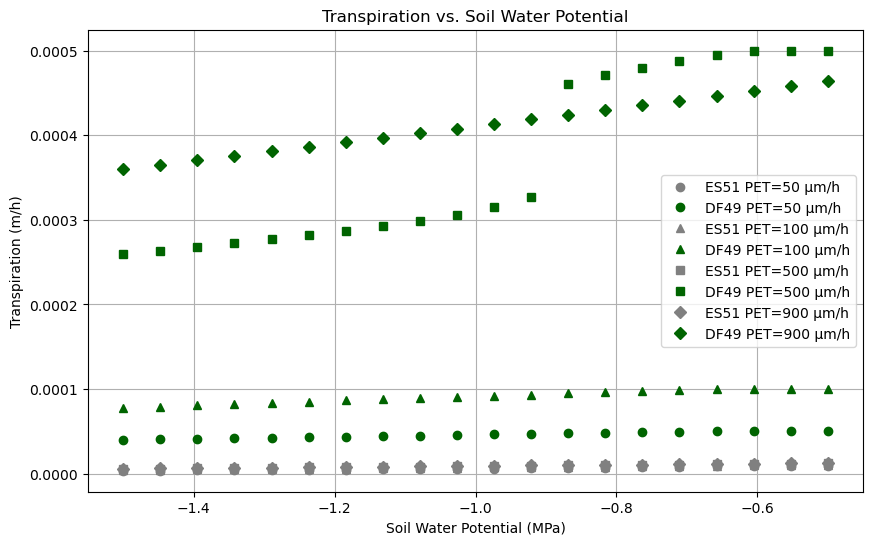

Psi_s (MPa) | PET (m/h) | ES51 Psi_x (MPa) | ES51 E (m/h) | ES51 R_p | DF49 Psi_x (MPa) | DF49 E (m/h) | DF49 R_p | ES51 P50 Check | DF49 P50 Check
------------------------------------------------------------------------------------------------------------------------
-0.50 | 0.000050 | -0.58 | 0.000009 | 8503 | -0.50 | 0.000050 | 23 | Safe | Safe
-0.50 | 0.000100 | -1.70 | 0.000010 | 114753 | -0.50 | 0.000100 | 24 | Safe | Safe
-0.50 | 0.000500 | -2.22 | 0.000012 | 144230 | -0.51 | 0.000500 | 25 | At risk | Safe
-0.50 | 0.000900 | -2.29 | 0.000012 | 145744 | -2.78 | 0.000465 | 4916 | At risk | At risk
-0.55 | 0.000050 | -0.67 | 0.000009 | 12971 | -0.55 | 0.000050 | 31 | Safe | Safe
-0.55 | 0.000100 | -1.72 | 0.000010 | 117245 | -0.56 | 0.000100 | 32 | Safe | Safe
-0.55 | 0.000500 | -2.23 | 0.000012 | 144343 | -0.57 | 0.000500 | 34 | At risk | Safe
-0.55 | 0.000900 | -2.29 | 0.000012 | 145794 | -2.81 | 0.000459 | 4930 | At risk | At risk
-0.61 | 0.000050 | -0.79 | 0.000009 | 20712 | -0

In [19]:
#matplotlib 
import numpy as np
from scipy.optimize import root_scalar
import matplotlib.pyplot as plt

# Weibull resistance function (bounded)
def R_p(psi_x, R_min, R_max, b, d):
    return R_min + (R_max - R_min) * (1 - np.exp(-((-psi_x / b) ** d)))

# Transpiration reduction function
def f_psi(psi_x, p1, p2):
    if psi_x > p1:
        return 1
    elif p2 <= psi_x <= p1:
        return (psi_x - p2) / (p1 - p2)
    else:
        return 0

# Supply-demand difference function
def supply_demand_diff(psi_x, psi_s, PT, R_min, R_max, b, d, p1, p2):
    R_p_val = R_p(psi_x, R_min, R_max, b, d)
    T_supply = (psi_s - psi_x) / R_p_val if R_p_val != 0 else 0
    T_demand = f_psi(psi_x, p1, p2) * PT
    return T_supply - T_demand

# Solve for psi_x and transpiration
def solve_hydraulics(psi_s, PET, LAI_LAI_max, R_min, R_max, b, d, p1, p2):
    PT = PET * LAI_LAI_max
    sol = root_scalar(
        supply_demand_diff,
        args=(psi_s, PT, R_min, R_max, b, d, p1, p2),
        bracket=[psi_s - 5, psi_s],
        method='brentq'
    )
    if sol.converged:
        psi_x_eq = sol.root
        E_eq = f_psi(psi_x_eq, p1, p2) * PT
        R_p_val = R_p(psi_x_eq, R_min, R_max, b, d)
        T_unlimited = (psi_s - psi_x_eq) / R_p_val if R_p_val != 0 else 0
        f_psi_effect = 1 - (E_eq / T_unlimited) if T_unlimited > 0 else 0
        return psi_x_eq, E_eq, R_p_val, f_psi_effect
    return None, None, None, None

# Parameters
params_ES51 = {'R_min': 236.48, 'R_max': 150000, 'b': 1.5, 'd': 3.0, 'p1': -1.2, 'p2': -2.38, 'LAI_LAI_max': 0.18}
params_DF49 = {'R_min': 7.98, 'R_max': 5000, 'b': 1.99, 'd': 4.19, 'p1': -0.65, 'p2': -5.06, 'LAI_LAI_max': 1.0}
P50_ES51 = -1.83  # P50 for ES51
P50_DF49 = -2.24  # P50 for DF49
PET_values = [0.00005, 0.0001, 0.0005, 0.0009]
psi_s_values = np.linspace(-0.5, -1.5, 20)

# Data storage
E_ES51 = {pet: [] for pet in PET_values}
E_DF49 = {pet: [] for pet in PET_values}
psi_x_ES51 = {pet: [] for pet in PET_values}
psi_x_DF49 = {pet: [] for pet in PET_values}
R_p_ES51 = {pet: [] for pet in PET_values}
R_p_DF49 = {pet: [] for pet in PET_values}
f_psi_dominance_ES51 = {pet: [] for pet in PET_values}
f_psi_dominance_DF49 = {pet: [] for pet in PET_values}

# Solve for each condition
for psi_s in psi_s_values:
    for PET in PET_values:
        psi_x, E, R_p_val, f_psi_eff = solve_hydraulics(psi_s, PET, **params_ES51)
        if psi_x is not None:
            E_ES51[PET].append(E)
            psi_x_ES51[PET].append(psi_x)
            R_p_ES51[PET].append(R_p_val)
            f_psi_dominance_ES51[PET].append(f_psi_eff)
        psi_x, E, R_p_val, f_psi_eff = solve_hydraulics(psi_s, PET, **params_DF49)
        if psi_x is not None:
            E_DF49[PET].append(E)
            psi_x_DF49[PET].append(psi_x)
            R_p_DF49[PET].append(R_p_val)
            f_psi_dominance_DF49[PET].append(f_psi_eff)

# Plotting
plt.figure(figsize=(10, 6))
symbols = ['o', '^', 's', 'D']  # Different symbols for PET values
for i, PET in enumerate(PET_values):
    plt.plot(psi_s_values, E_ES51[PET], color='grey', marker=symbols[i], label=f'ES51 PET={PET*1e6:.0f} µm/h', linestyle='none')
    plt.plot(psi_s_values, E_DF49[PET], color='darkgreen', marker=symbols[i], label=f'DF49 PET={PET*1e6:.0f} µm/h', linestyle='none')

plt.xlabel('Soil Water Potential (MPa)')
plt.ylabel('Transpiration (m/h)')
plt.title('Transpiration vs. Soil Water Potential')
plt.legend()
plt.grid(True)
plt.show()

# Print table of results
print("Psi_s (MPa) | PET (m/h) | ES51 Psi_x (MPa) | ES51 E (m/h) | ES51 R_p | DF49 Psi_x (MPa) | DF49 E (m/h) | DF49 R_p | ES51 P50 Check | DF49 P50 Check")
print("-" * 120)
for i, psi_s in enumerate(psi_s_values):
    for j, PET in enumerate(PET_values):
        psi_x_ES51_val = psi_x_ES51[PET][i] if i < len(psi_x_ES51[PET]) else None
        E_ES51_val = E_ES51[PET][i] if i < len(E_ES51[PET]) else None
        R_p_ES51_val = R_p_ES51[PET][i] if i < len(R_p_ES51[PET]) else None
        psi_x_DF49_val = psi_x_DF49[PET][i] if i < len(psi_x_DF49[PET]) else None
        E_DF49_val = E_DF49[PET][i] if i < len(E_DF49[PET]) else None
        R_p_DF49_val = R_p_DF49[PET][i] if i < len(R_p_DF49[PET]) else None
        if psi_x_ES51_val and psi_x_DF49_val:
            p50_check_ES51 = "At risk" if psi_x_ES51_val < P50_ES51 else "Safe"
            p50_check_DF49 = "At risk" if psi_x_DF49_val < P50_DF49 else "Safe"
            print(f"{psi_s:.2f} | {PET:.6f} | {psi_x_ES51_val:.2f} | {E_ES51_val:.6f} | {R_p_ES51_val:.0f} | {psi_x_DF49_val:.2f} | {E_DF49_val:.6f} | {R_p_DF49_val:.0f} | {p50_check_ES51} | {p50_check_DF49}")

# Regulation dominance analysis
print("\nRegulation Dominance (Fraction of Reduction due to f(psi)):")
for PET in PET_values:
    avg_f_psi_ES51 = np.mean(f_psi_dominance_ES51[PET]) if f_psi_dominance_ES51[PET] else 0
    avg_f_psi_DF49 = np.mean(f_psi_dominance_DF49[PET]) if f_psi_dominance_DF49[PET] else 0
    print(f"PET={PET*1e6:.0f} µm/h: ES51 f(psi) effect={avg_f_psi_ES51:.2f}, DF49 f(psi) effect={avg_f_psi_DF49:.2f}")
    R_p_dominance_ES51 = 1 - avg_f_psi_ES51
    R_p_dominance_DF49 = 1 - avg_f_psi_DF49
    print(f"                  ES51 R_p dominance={R_p_dominance_ES51:.2f}, DF49 R_p dominance={R_p_dominance_DF49:.2f}")

In [20]:
#plotly
import numpy as np
from scipy.optimize import root_scalar
import plotly.graph_objects as go

# Weibull resistance function (bounded)
def R_p(psi_x, R_min, R_max, b, d):
    return R_min + (R_max - R_min) * (1 - np.exp(-((-psi_x / b) ** d)))

# Transpiration reduction function
def f_psi(psi_x, p1, p2):
    if psi_x > p1:
        return 1
    elif p2 <= psi_x <= p1:
        return (psi_x - p2) / (p1 - p2)
    else:
        return 0

# Supply-demand difference function
def supply_demand_diff(psi_x, psi_s, PT, R_min, R_max, b, d, p1, p2):
    R_p_val = R_p(psi_x, R_min, R_max, b, d)
    T_supply = (psi_s - psi_x) / R_p_val if R_p_val != 0 else 0
    T_demand = f_psi(psi_x, p1, p2) * PT
    return T_supply - T_demand

# Solve for psi_x and transpiration
def solve_hydraulics(psi_s, PET, LAI_LAI_max, R_min, R_max, b, d, p1, p2):
    PT = PET * LAI_LAI_max
    sol = root_scalar(
        supply_demand_diff,
        args=(psi_s, PT, R_min, R_max, b, d, p1, p2),
        bracket=[psi_s - 5, psi_s],
        method='brentq'
    )
    if sol.converged:
        psi_x_eq = sol.root
        E_eq = f_psi(psi_x_eq, p1, p2) * PT
        R_p_val = R_p(psi_x_eq, R_min, R_max, b, d)
        T_unlimited = (psi_s - psi_x_eq) / R_p_val if R_p_val != 0 else 0
        f_psi_effect = 1 - (E_eq / T_unlimited) if T_unlimited > 0 else 0
        return psi_x_eq, E_eq, R_p_val, f_psi_effect
    return None, None, None, None

# Parameters #
params_ES51 = {'R_min': 236.48, 'R_max': 150000, 'b': 1.5, 'd': 3.0, 'p1': -1.2, 'p2': -2.38, 'LAI_LAI_max': 1.0} #0.18
params_DF49 = {'R_min': 7.98, 'R_max': 5000, 'b': 1.99, 'd': 4.19, 'p1': -0.65, 'p2': -5.06, 'LAI_LAI_max': 1.0}
P50_ES51 = -1.83  # P50 for ES51
P50_DF49 = -2.24  # P50 for DF49
PET_values = [0.00005, 0.0001, 0.0005, 0.0009]
psi_s_values = np.linspace(-0.2, -2.5, 20)

# Data storage
E_ES51 = {pet: [] for pet in PET_values}
E_DF49 = {pet: [] for pet in PET_values}
psi_x_ES51 = {pet: [] for pet in PET_values}
psi_x_DF49 = {pet: [] for pet in PET_values}
R_p_ES51 = {pet: [] for pet in PET_values}
R_p_DF49 = {pet: [] for pet in PET_values}
f_psi_dominance_ES51 = {pet: [] for pet in PET_values}
f_psi_dominance_DF49 = {pet: [] for pet in PET_values}

# Solve for each condition
for psi_s in psi_s_values:
    for PET in PET_values:
        psi_x, E, R_p_val, f_psi_eff = solve_hydraulics(psi_s, PET, **params_ES51)
        if psi_x is not None:
            E_ES51[PET].append(E)
            psi_x_ES51[PET].append(psi_x)
            R_p_ES51[PET].append(R_p_val)
            f_psi_dominance_ES51[PET].append(f_psi_eff)
        psi_x, E, R_p_val, f_psi_eff = solve_hydraulics(psi_s, PET, **params_DF49)
        if psi_x is not None:
            E_DF49[PET].append(E)
            psi_x_DF49[PET].append(psi_x)
            R_p_DF49[PET].append(R_p_val)
            f_psi_dominance_DF49[PET].append(f_psi_eff)

# Plotting with Plotly
fig = go.Figure()

symbols = ['circle', 'square', 'diamond', 'triangle-up']  # Plotly marker symbols
for i, PET in enumerate(PET_values):
    fig.add_trace(go.Scatter(
        x=psi_s_values,
        y=E_ES51[PET],
        mode='markers',
        marker=dict(symbol=symbols[i], color='grey', size=10),
        name=f'ES51 PET={PET*1e6:.0f} µm/h',
        showlegend=True
    ))
    fig.add_trace(go.Scatter(
        x=psi_s_values,
        y=E_DF49[PET],
        mode='markers',
        marker=dict(symbol=symbols[i], color='darkgreen', size=10),
        name=f'DF49 PET={PET*1e6:.0f} µm/h',
        showlegend=True
    ))

fig.update_layout(
    title='Transpiration vs. Soil Water Potential',
    xaxis_title='Soil Water Potential (MPa)',
    yaxis_title='Transpiration (m/h)',
    legend_title='Tree and PET',
    template='plotly_white',
    hovermode='closest'
)
fig.show()

# Print table of results
print("Psi_s (MPa) | PET (m/h) | ES51 Psi_x (MPa) | ES51 E (m/h) | ES51 R_p | DF49 Psi_x (MPa) | DF49 E (m/h) | DF49 R_p | ES51 P50 Check | DF49 P50 Check")
print("-" * 120)
for i, psi_s in enumerate(psi_s_values):
    for j, PET in enumerate(PET_values):
        psi_x_ES51_val = psi_x_ES51[PET][i] if i < len(psi_x_ES51[PET]) else None
        E_ES51_val = E_ES51[PET][i] if i < len(E_ES51[PET]) else None
        R_p_ES51_val = R_p_ES51[PET][i] if i < len(R_p_ES51[PET]) else None
        psi_x_DF49_val = psi_x_DF49[PET][i] if i < len(psi_x_DF49[PET]) else None
        E_DF49_val = E_DF49[PET][i] if i < len(E_DF49[PET]) else None
        R_p_DF49_val = R_p_DF49[PET][i] if i < len(R_p_DF49[PET]) else None
        if psi_x_ES51_val and psi_x_DF49_val:
            p50_check_ES51 = "At risk" if psi_x_ES51_val < P50_ES51 else "Safe"
            p50_check_DF49 = "At risk" if psi_x_DF49_val < P50_DF49 else "Safe"
            print(f"{psi_s:.2f} | {PET:.6f} | {psi_x_ES51_val:.2f} | {E_ES51_val:.6f} | {R_p_ES51_val:.0f} | {psi_x_DF49_val:.2f} | {E_DF49_val:.6f} | {R_p_DF49_val:.0f} | {p50_check_ES51} | {p50_check_DF49}")

# Regulation dominance analysis
print("\nRegulation Dominance (Fraction of Reduction due to f(psi)):")
for PET in PET_values:
    avg_f_psi_ES51 = np.mean(f_psi_dominance_ES51[PET]) if f_psi_dominance_ES51[PET] else 0
    avg_f_psi_DF49 = np.mean(f_psi_dominance_DF49[PET]) if f_psi_dominance_DF49[PET] else 0
    print(f"PET={PET*1e6:.0f} µm/h: ES51 f(psi) effect={avg_f_psi_ES51:.2f}, DF49 f(psi) effect={avg_f_psi_DF49:.2f}")
    R_p_dominance_ES51 = 1 - avg_f_psi_ES51
    R_p_dominance_DF49 = 1 - avg_f_psi_DF49
    print(f"                  ES51 R_p dominance={R_p_dominance_ES51:.2f}, DF49 R_p dominance={R_p_dominance_DF49:.2f}")

Psi_s (MPa) | PET (m/h) | ES51 Psi_x (MPa) | ES51 E (m/h) | ES51 R_p | DF49 Psi_x (MPa) | DF49 E (m/h) | DF49 R_p | ES51 P50 Check | DF49 P50 Check
------------------------------------------------------------------------------------------------------------------------
-0.20 | 0.000050 | -2.06 | 0.000013 | 138911 | -0.20 | 0.000050 | 8 | At risk | Safe
-0.20 | 0.000100 | -2.21 | 0.000014 | 144013 | -0.20 | 0.000100 | 8 | At risk | Safe
-0.20 | 0.000500 | -2.35 | 0.000015 | 146727 | -0.20 | 0.000500 | 8 | At risk | Safe
-0.20 | 0.000900 | -2.36 | 0.000015 | 146963 | -2.60 | 0.000503 | 4762 | At risk | At risk
-0.32 | 0.000050 | -2.08 | 0.000013 | 139687 | -0.32 | 0.000050 | 10 | At risk | Safe
-0.32 | 0.000100 | -2.22 | 0.000013 | 144255 | -0.32 | 0.000100 | 10 | At risk | Safe
-0.32 | 0.000500 | -2.35 | 0.000014 | 146757 | -0.33 | 0.000500 | 11 | At risk | Safe
-0.32 | 0.000900 | -2.36 | 0.000014 | 146979 | -2.68 | 0.000486 | 4844 | At risk | At risk
-0.44 | 0.000050 | -2.10 | 0.000012 

## Test ES51 time series

In [21]:
from pathlib import Path

from csv import DictReader, reader
# Import the utility functions
from utils.read_and_create_dict import read_and_create_dict
from utils.clean_psy import clean_psy_in_dict

# Read files, create/update the dictionary, and clean PSY data
trees_data, paths = read_and_create_dict()
trees_data = clean_psy_in_dict(trees_data)

Info: No Soil file specified for DF21-2021 (value: NA)
Info: No Soil file specified for DF03-2021 (value: NA)
Info: No Psy file specified for DF03-2021 (value: NA)
Info: No Soil file specified for ES48-2021 (value: NA)
Info: No Soil file specified for ES42-2021 (value: NA)
Info: No Psy file specified for ES42-2021 (value: NA)
Info: No SF_W file specified for ES51-2022 (value: NA)
Info: No SF_W_incomplete file specified for ES51-2022 (value: NA)
Info: No Soil file specified for ES51-2022 (value: NA)
  PSY data for DF03-2021 is empty or all NaN
  PSY data for ES42-2021 is empty or all NaN
  PSY data for ES51-2022 is None


## Dynamic Regulation 

## SPAC 51 NO nightime/rain/low VPD regulation

### SPAC MODEL DRY 

Works Aug 9 to 16 (dryest period)

        params = {
            'LAI_LAI_max': 0.18,
            'R_min': 236.48,
            'R_max': 150000,
            'b': 4.19,
            'd': 1.99
        }

        # Optimized stomatal parameters
        P50_opt = -0.46#-0.36
        k_opt = 30#10.0000

In [22]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from scipy.optimize import root_scalar

# Weibull resistance function
def R_p(psi_x, R_min, R_max, b, d):
    return R_min + (R_max - R_min) * (1 - np.exp(-((-psi_x / b) ** d)))

# Logistic transpiration reduction function
def f_psi(psi_x, P50, k):
    return 1 / (1 + np.exp(-k * (psi_x - P50)))

# Supply-demand difference function
def supply_demand_diff(psi_x, psi_s, PT, R_min, R_max, b, d, P50, k):
    R_p_val = R_p(psi_x, R_min, R_max, b, d)
    T_supply = (psi_s - psi_x) / R_p_val if R_p_val != 0 else np.inf
    T_demand = f_psi(psi_x, P50, k) * PT
    return T_supply - T_demand

# Van Genuchten equation for soil moisture to water potential
def invθ(θ, θs, θr, α, n, m):
    rho_w = 1000  # Water density (kg/m³)
    if θ <= θr or np.isnan(θ):
        return np.nan
    try:
        return (((1/α) * (((θs - θr) / (θ - θr))**(1/m) - 1)**(1/n)) * rho_w * 1e-6 * -1).real  # J/kg -> MPa
    except (ValueError, RuntimeWarning):
        return np.nan

# Load and process data
for data in trees_data.values():
    if data['tree'] == 'ES51' and data['year'] == '2021':
        # Parameters
        params = {
            'LAI_LAI_max': 0.18,
            'R_min': 236.48,
            'R_max': 150000,
            'b': 4.19,
            'd': 1.99
        }

        # Optimized stomatal parameters
        P50_opt = -0.46#-0.36
        k_opt = 30#10.0000

        # Extract time series data
        df = data['SF_W_SM_PSY'].copy()
        psy_cleaned_df = data['PSY_cleaned'].rename(columns={'PSY': 'PSYx'})
        df = df.drop(columns=['PSY'], errors='ignore')
        df = df.join(psy_cleaned_df, how='left')
        dates = df.index
        PET = df['PET'].values
        SM = df['Soil_moisture'].values
        psi_measured = df['PSYx'].values  # Assuming PSY column contains measured water potential


        # Convert soil moisture to water potential
        theta_s = np.nanmax(SM)  # Saturated moisture content
        theta_r = np.nanmin(SM) - 0.021  # Residual moisture content
        alpha = 0.0085
        n = 2.085
        m = 1 - 1/n
        psi_s = np.array([invθ(θ, theta_s, theta_r, alpha, n, m) for θ in SM])

        # Calculate E_measured from SF_complete
        LA = float(data['leaf_area']) / 10000  # Convert cm² to m²
        E_measured = (df['SF_complete'].values * 1e-6) / LA  # cm³/h to m³/h

        # Potential transpiration
        PT = PET * params['LAI_LAI_max']

        # Predict psi_x and E_predicted
        psi_x_predicted = []
        E_predicted = []
        for i in range(len(psi_s)):
            sol = root_scalar(
                supply_demand_diff,
                args=(psi_s[i], PT[i], params['R_min'], params['R_max'], params['b'], params['d'], P50_opt, k_opt),
                bracket=[psi_s[i] - 5, psi_s[i]],
                method='brentq'
            )
            if sol.converged:
                psi_x = sol.root
                psi_x_predicted.append(psi_x)
                E_predicted.append(f_psi(psi_x, P50_opt, k_opt) * PT[i])
            else:
                psi_x_predicted.append(np.nan)
                E_predicted.append(np.nan)

        # Convert to numpy arrays for calculations
        E_predicted = np.array(E_predicted)
        psi_x_predicted = np.array(psi_x_predicted)

        # Calculate RMSE
        mask_E = ~np.isnan(E_measured) & ~np.isnan(E_predicted)
        rmse_E = np.sqrt(np.mean((E_measured[mask_E] - E_predicted[mask_E]) ** 2)) if np.any(mask_E) else np.nan
        print(f"RMSE for Transpiration: {rmse_E:.6f} m/h")

        mask_psi = ~np.isnan(psi_measured) & ~np.isnan(psi_x_predicted)
        rmse_psi = np.sqrt(np.mean((psi_measured[mask_psi] - psi_x_predicted[mask_psi]) ** 2)) if np.any(mask_psi) else np.nan
        print(f"RMSE for Water Potential: {rmse_psi:.6f} MPa")

        # Plot 1: Transpiration
        fig1 = go.Figure()
        fig1.add_trace(go.Scatter(x=dates, y=E_measured, mode='lines', name='E_measured', line=dict(color='blue')))
        fig1.add_trace(go.Scatter(x=dates, y=E_predicted, mode='lines', name='E_predicted', line=dict(color='red')))
        fig1.update_layout(
            title='Transpiration: Measured vs Predicted',
            xaxis_title='Date',
            yaxis_title='Transpiration (m/h)',
            template='plotly_white',
            hovermode='closest'
        )
        fig1.show()

        # Plot 2: Water Potential
        fig2 = go.Figure()
        fig2.add_trace(go.Scatter(x=dates, y=psi_measured, mode='lines', name='Psi_measured', line=dict(color='green')))
        fig2.add_trace(go.Scatter(x=dates, y=[i*1 for i in psi_x_predicted], mode='lines', name='Psi_predicted', line=dict(color='orange')))
        fig2.update_layout(
            title='Water Potential: Measured vs Predicted',
            xaxis_title='Date',
            yaxis_title='Water Potential (MPa)',
            template='plotly_white',
            hovermode='closest'
        )
        fig2.show()

        break

RMSE for Transpiration: 0.000079 m/h
RMSE for Water Potential: 1.216805 MPa


### SPAC MODEL POST-DRY
September 15 to October 18  
It seems at the very start and very end of the season stomates are regulating much more even though there is more supply:

        # Parameters
        params = {
            'LAI_LAI_max': 0.18,
            'R_min': 70,#236.48,
            'R_max': 80000,#93750,
            'b': 1.11,#4.19,
            'd': 2.85#2.45
        }

        # Optimized stomatal parameters
        P50_opt = -0.005
        k_opt = 30#10.0000$

In [23]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from scipy.optimize import root_scalar

# Weibull resistance function
def R_p(psi_x, R_min, R_max, b, d):
    return R_min + (R_max - R_min) * (1 - np.exp(-((-psi_x / b) ** d)))

# Logistic transpiration reduction function
def f_psi(psi_x, P50, k):
    return 1 / (1 + np.exp(-k * (psi_x - P50)))

# Supply-demand difference function
def supply_demand_diff(psi_x, psi_s, PT, R_min, R_max, b, d, P50, k):
    R_p_val = R_p(psi_x, R_min, R_max, b, d)
    T_supply = (psi_s - psi_x) / R_p_val if R_p_val != 0 else np.inf
    T_demand = f_psi(psi_x, P50, k) * PT
    return T_supply - T_demand

# Van Genuchten equation for soil moisture to water potential
def invθ(θ, θs, θr, α, n, m):
    rho_w = 1000  # Water density (kg/m³)
    if θ <= θr or np.isnan(θ):
        return np.nan
    try:
        return (((1/α) * (((θs - θr) / (θ - θr))**(1/m) - 1)**(1/n)) * rho_w * 1e-6 * -1).real  # J/kg -> MPa
    except (ValueError, RuntimeWarning):
        return np.nan

# Load and process data
for data in trees_data.values():
    if data['tree'] == 'ES51' and data['year'] == '2021':
        # Parameters
        params = {
            'LAI_LAI_max': 0.18,
            'R_min': 70,#236.48, 70
            'R_max': 80000,#93750, 80000
            'b': 1.19, #1.11,#
            'd': 2.45 #2.85
        }

        # Optimized stomatal parameters
        P50_opt = -0.5#-0.005
        k_opt = 30#10.0000

        # Extract time series data
        # df = data['SF_W_SM_PSY']
        # dates = df.index
        # PET = df['PET'].values
        # SM = df['Soil_moisture'].values
        # psi_measured = df['PSY'].values  # Assuming PSY column contains measured water potential


        df = data['SF_W_SM_PSY'].copy()
        psy_cleaned_df = data['PSY_cleaned'].rename(columns={'PSY': 'PSYx'})
        df = df.drop(columns=['PSY'], errors='ignore')
        df = df.join(psy_cleaned_df, how='left')
        dates = df.index
        PET = df['PET'].values
        SM = df['Soil_moisture'].values
        psi_measured = df['PSYx'].values  # Assuming PSY column contains measured water potential


        # Convert soil moisture to water potential
        theta_s = np.nanmax(SM)  # Saturated moisture content
        theta_r = np.nanmin(SM) - 0.021  # Residual moisture content
        alpha = 0.0085
        n = 2.085
        m = 1 - 1/n
        psi_s = np.array([invθ(θ, theta_s, theta_r, alpha, n, m) for θ in SM])

        # Calculate E_measured from SF_complete
        LA = float(data['leaf_area']) / 10000  # Convert cm² to m²
        E_measured = (df['SF_complete'].values * 1e-6) / LA  # cm³/h to m³/h

        # Potential transpiration
        PT = PET * params['LAI_LAI_max']

        # Predict psi_x and E_predicted
        psi_x_predicted = []
        E_predicted = []
        for i in range(len(psi_s)):
            sol = root_scalar(
                supply_demand_diff,
                args=(psi_s[i], PT[i], params['R_min'], params['R_max'], params['b'], params['d'], P50_opt, k_opt),
                bracket=[psi_s[i] - 5, psi_s[i]],
                method='brentq'
            )
            if sol.converged:
                psi_x = sol.root
                psi_x_predicted.append(psi_x)
                E_predicted.append(f_psi(psi_x, P50_opt, k_opt) * PT[i])
            else:
                psi_x_predicted.append(np.nan)
                E_predicted.append(np.nan)

        # Convert to numpy arrays for calculations
        E_predicted = np.array(E_predicted)
        psi_x_predicted = np.array(psi_x_predicted)

        # Calculate RMSE
        mask_E = ~np.isnan(E_measured) & ~np.isnan(E_predicted)
        rmse_E = np.sqrt(np.mean((E_measured[mask_E] - E_predicted[mask_E]) ** 2)) if np.any(mask_E) else np.nan
        print(f"RMSE for Transpiration: {rmse_E:.6f} m/h")

        mask_psi = ~np.isnan(psi_measured) & ~np.isnan(psi_x_predicted)
        rmse_psi = np.sqrt(np.mean((psi_measured[mask_psi] - psi_x_predicted[mask_psi]) ** 2)) if np.any(mask_psi) else np.nan
        print(f"RMSE for Water Potential: {rmse_psi:.6f} MPa")

        # Plot 1: Transpiration
        fig1 = go.Figure()
        fig1.add_trace(go.Scatter(x=dates, y=E_measured, mode='lines', name='E_measured', line=dict(color='blue')))
        fig1.add_trace(go.Scatter(x=dates, y=E_predicted, mode='lines', name='E_predicted', line=dict(color='red')))
        fig1.update_layout(
            title='Transpiration: Measured vs Predicted',
            xaxis_title='Date',
            yaxis_title='Transpiration (m/h)',
            template='plotly_white',
            hovermode='closest'
        )
        fig1.show()

        # Plot 2: Water Potential
        fig2 = go.Figure()
        fig2.add_trace(go.Scatter(x=dates, y=psi_measured, mode='lines', name='Psi_measured', line=dict(color='green')))
        fig2.add_trace(go.Scatter(x=dates, y=[i*3 for i in psi_x_predicted], mode='lines', name='Psi_predicted', line=dict(color='orange')))
        fig2.update_layout(
            title='Water Potential: Measured vs Predicted',
            xaxis_title='Date',
            yaxis_title='Water Potential (MPa)',
            template='plotly_white',
            hovermode='closest'
        )
        fig2.show()

        break

RMSE for Transpiration: 0.000013 m/h
RMSE for Water Potential: 1.159605 MPa


### SPAC MODEL POST-DRY 


        params = {
            'LAI_LAI_max': 0.18,
            'R_min': 236.48,
            'R_max': 98500,#93750,
            'b': 1.8949,#1.11,#4.19,
            'd': 1.85#1.85#2.45
        }

        # Optimized stomatal parameters
        P50_opt = -0.05
        k_opt = 100#10.0000

In [24]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from scipy.optimize import root_scalar

# Weibull resistance function
def R_p(psi_x, R_min, R_max, b, d):
    return R_min + (R_max - R_min) * (1 - np.exp(-((-psi_x / b) ** d)))

# Logistic transpiration reduction function
def f_psi(psi_x, P50, k):
    return 1 / (1 + np.exp(-k * (psi_x - P50)))

# Supply-demand difference function
def supply_demand_diff(psi_x, psi_s, PT, R_min, R_max, b, d, P50, k):
    R_p_val = R_p(psi_x, R_min, R_max, b, d)
    T_supply = (psi_s - psi_x) / R_p_val if R_p_val != 0 else np.inf
    T_demand = f_psi(psi_x, P50, k) * PT
    return T_supply - T_demand

# Van Genuchten equation for soil moisture to water potential
def invθ(θ, θs, θr, α, n, m):
    rho_w = 1000  # Water density (kg/m³)
    if θ <= θr or np.isnan(θ):
        return np.nan
    try:
        return (((1/α) * (((θs - θr) / (θ - θr))**(1/m) - 1)**(1/n)) * rho_w * 1e-6 * -1).real  # J/kg -> MPa
    except (ValueError, RuntimeWarning):
        return np.nan

# Load and process data
for data in trees_data.values():
    if data['tree'] == 'ES51' and data['year'] == '2021':

        params = {
            'LAI_LAI_max': 0.18,
            'R_min': 236.48,
            'R_max': 98500,#93750,
            'b': 1.89,#1.11,#4.19,
            'd': 1.85#1.85#2.45
        }

        # Optimized stomatal parameters
        P50_opt = -0.005
        k_opt = 30#10.0000

        # Extract time series data
        df = data['SF_W_SM_PSY']
        dates = df.index
        PET = df['PET'].values
        SM = (df['Soil_moisture'].values)*1
        psi_measured = df['PSY'].values  # Assuming PSY column contains measured water potential

        # Convert soil moisture to water potential
        theta_s = np.nanmax(SM)  # Saturated moisture content
        theta_r = np.nanmin(SM) - 0.021  # Residual moisture content
        alpha = 0.0085
        n = 2.085
        m = 1 - 1/n
        psi_s = np.array([invθ(θ, theta_s, theta_r, alpha, n, m) for θ in SM])

        # Calculate E_measured from SF_complete
        LA = float(data['leaf_area']) / 10000  # Convert cm² to m²
        E_measured = (df['SF_complete'].values * 1e-6) / LA  # cm³/h to m³/h

        # Potential transpiration
        PT = PET * params['LAI_LAI_max']

        # Predict psi_x and E_predicted
        psi_x_predicted = []
        E_predicted = []
        for i in range(len(psi_s)):
            sol = root_scalar(
                supply_demand_diff,
                args=(psi_s[i], PT[i], params['R_min'], params['R_max'], params['b'], params['d'], P50_opt, k_opt),
                bracket=[psi_s[i] - 5, psi_s[i]],
                method='brentq'
            )
            if sol.converged:
                psi_x = sol.root
                psi_x_predicted.append(psi_x)
                E_predicted.append(f_psi(psi_x, P50_opt, k_opt) * PT[i])
            else:
                psi_x_predicted.append(np.nan)
                E_predicted.append(np.nan)

        # Convert to numpy arrays for calculations
        E_predicted = np.array(E_predicted)
        psi_x_predicted = np.array(psi_x_predicted)

        # Calculate RMSE
        mask_E = ~np.isnan(E_measured) & ~np.isnan(E_predicted)
        rmse_E = np.sqrt(np.mean((E_measured[mask_E] - E_predicted[mask_E]) ** 2)) if np.any(mask_E) else np.nan
        print(f"RMSE for Transpiration: {rmse_E:.6f} m/h")

        mask_psi = ~np.isnan(psi_measured) & ~np.isnan(psi_x_predicted)
        rmse_psi = np.sqrt(np.mean((psi_measured[mask_psi] - psi_x_predicted[mask_psi]) ** 2)) if np.any(mask_psi) else np.nan
        print(f"RMSE for Water Potential: {rmse_psi:.6f} MPa")

        # Plot 1: Transpiration
        fig1 = go.Figure()
        fig1.add_trace(go.Scatter(x=dates, y=E_measured, mode='lines', name='E_measured', line=dict(color='blue')))
        fig1.add_trace(go.Scatter(x=dates, y=[i*1 for i in E_predicted], mode='lines', name='E_predicted', line=dict(color='red')))
        fig1.update_layout(
            title='Transpiration: Measured vs Predicted',
            xaxis_title='Date',
            yaxis_title='Transpiration (m/h)',
            template='plotly_white',
            hovermode='closest'
        )
        fig1.show()

        # Plot 2: Water Potential
        fig2 = go.Figure()
        fig2.add_trace(go.Scatter(x=dates, y=psi_measured, mode='lines', name='Psi_measured', line=dict(color='green')))
        fig2.add_trace(go.Scatter(x=dates, y=[i*1 for i in psi_x_predicted], mode='lines', name='Psi_predicted', line=dict(color='orange')))
        fig2.update_layout(
            title='Water Potential: Measured vs Predicted',
            xaxis_title='Date',
            yaxis_title='Water Potential (MPa)',
            template='plotly_white',
            hovermode='closest'
        )
        fig2.show()

        break

RMSE for Transpiration: 0.000015 m/h
RMSE for Water Potential: 1.621083 MPa


## SPAC 51 nightime/rain/low VPD regulation

### SPAC DRY JUL20-AUG 16
good for E in Jul 20-Ago 16 

        params = {
            'LAI_LAI_max': 0.18,
            'R_min': 236.78,#50,
            'R_max': 100000,# works better than 150000
            'b': 1.8, #1.11, #4.19,#
            'd': 1.99 #2.85
        }

        # Optimized stomatal parameters
        P50_opt = -0.7
        k_opt = 80

        # Parameters
        # params = {
        #     'LAI_LAI_max': 0.18,
        #     'R_min': 40000,#50,
        #     'R_max': 100000,# works better than 150000
        #     'b': 4.6, #1.11, #4.19,#
        #     'd': 1.99 #2.85
        # }
        # # Optimized stomatal parameters
        # P50_opt = -1
        # k_opt = 100

In [25]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from scipy.optimize import root_scalar
from datetime import time

# Weibull resistance function
def R_p(psi_x, R_min, R_max, b, d):
    return R_min + (R_max - R_min) * (1 - np.exp(-((-psi_x / b) ** d)))

# Logistic transpiration reduction function
def f_psi(psi_x, P50, k):
    return 1 / (1 + np.exp(-k * (psi_x - P50)))

# Supply-demand difference function
def supply_demand_diff(psi_x, psi_s, PT, R_min, R_max, b, d, P50, k):
    R_p_val = R_p(psi_x, R_min, R_max, b, d)
    T_supply = (psi_s - psi_x) / R_p_val if R_p_val != 0 else np.inf
    T_demand = f_psi(psi_x, P50, k) * PT
    return T_supply - T_demand

# Van Genuchten equation for soil moisture to water potential
def invθ(θ, θs, θr, α, n, m):
    rho_w = 1000  # Water density (kg/m³)
    if θ <= θr or np.isnan(θ):
        return np.nan
    try:
        return (((1/α) * (((θs - θr) / (θ - θr))**(1/m) - 1)**(1/n)) * rho_w * 1e-6 * -1).real  # J/kg -> MPa
    except (ValueError, RuntimeWarning):
        return np.nan
    

# Load and process data
for data in trees_data.values():
    if data['tree'] == 'ES51' and data['year'] == '2021':

        params = {
            'LAI_LAI_max': 0.18,
            'R_min': 236.78,#50,
            'R_max': 100000,# works better than 150000
            'b': 1.8, #1.11, #4.19,#
            'd': 1.99 #2.85
        }

        # Optimized stomatal parameters
        P50_opt = -0.7
        k_opt = 80

        # Extract time series data
        df = data['SF_W_SM_PSY'].copy()
        psy_cleaned_df = data['PSY_cleaned'].rename(columns={'PSY': 'PSYx'})
        df = df.drop(columns=['PSY'], errors='ignore')
        df = df.join(psy_cleaned_df, how='left')
        dates = df.index
        PET = df['PET'].values
        SM = df['Soil_moisture'].values
        psi_measured = df['PSYx'].values  # Assuming PSY column contains measured water potential
        VPD = df['VPD'].values  # Vapor Pressure Deficit in kPa
        Rain = df['Rain'].values  # Rainfall in mm

        # Convert soil moisture to water potential
        theta_s = np.nanmax(SM)
        theta_r = np.nanmin(SM) - 0.021
        alpha = 0.0085
        n = 2.085
        m = 1 - 1/n
        psi_s = np.array([invθ(θ, theta_s, theta_r, alpha, n, m) for θ in SM])

        # Calculate E_measured from SF_complete
        LA = float(data['leaf_area']) / 10000  # Convert cm² to m²
        E_measured = (df['SF_complete'].values * 1e-6) / LA  # cm³/h to m³/h

        # Potential transpiration
        PT = PET * params['LAI_LAI_max']

        # Determine minimum PET for nighttime (10 PM to 7 AM) using 5th percentile
        nighttime_mask = (dates.time >= time(22, 0)) | (dates.time < time(7, 0))
        PET_nighttime = PET[nighttime_mask]
        PET_min = np.nanpercentile(PET_nighttime, 5) if np.any(~np.isnan(PET_nighttime)) else np.nanmin(PET) * 0.1

        # Predict psi_x and E_predicted with nighttime/rain adjustment
        psi_x_predicted = []
        E_predicted = []
        for i in range(len(psi_s)):
            # Check for nighttime, low VPD, or rain conditions
            is_night_or_rain = (
                (dates[i].time() >= time(22, 0) or dates[i].time() < time(7, 0)) or  # Fixed: call time() method
                (VPD[i] < 0.1) or
                (Rain[i] > 0)
            )

            if is_night_or_rain:
                # Minimal transpiration with near-closed stomata
                PT_min = PET_min * params['LAI_LAI_max']
                f_psi_min = f_psi(psi_s[i], P50_opt, k_opt) * 0.01  # Force near-zero stomatal conductance
                E_predicted.append(min(PT_min * f_psi_min, 0.1))  # Cap at 0.0001 mm/h
                psi_x_predicted.append(psi_s[i])  # Equilibrate with soil potential
            else:
                sol = root_scalar(
                    supply_demand_diff,
                    args=(psi_s[i], PT[i], params['R_min'], params['R_max'], params['b'], params['d'], P50_opt, k_opt),
                    bracket=[psi_s[i] - 5, psi_s[i]],
                    method='brentq'
                )
                if sol.converged:
                    psi_x = sol.root
                    psi_x_predicted.append(psi_x)
                    E_predicted.append(f_psi(psi_x, P50_opt, k_opt) * PT[i])
                else:
                    psi_x_predicted.append(np.nan)
                    E_predicted.append(np.nan)

        # Convert to numpy arrays for calculations
        E_predicted = np.array(E_predicted)
        psi_x_predicted = np.array(psi_x_predicted)

        # Calculate RMSE
        mask_E = ~np.isnan(E_measured) & ~np.isnan(E_predicted)
        rmse_E = np.sqrt(np.mean((E_measured[mask_E] - E_predicted[mask_E]) ** 2)) if np.any(mask_E) else np.nan
        print(f"RMSE for Transpiration: {rmse_E:.6f} m/h")

        mask_psi = ~np.isnan(psi_measured) & ~np.isnan(psi_x_predicted)
        rmse_psi = np.sqrt(np.mean((psi_measured[mask_psi] - psi_x_predicted[mask_psi]) ** 2)) if np.any(mask_psi) else np.nan
        print(f"RMSE for Water Potential: {rmse_psi:.6f} MPa")

        # Plot 1: Transpiration
        fig1 = go.Figure()
        fig1.add_trace(go.Scatter(x=dates, y=E_measured, mode='lines', name='E_measured', line=dict(color='blue')))
        fig1.add_trace(go.Scatter(x=dates, y=E_predicted, mode='lines', name='E_predicted', line=dict(color='red')))
        fig1.update_layout(
            title='Transpiration: Measured vs Predicted',
            xaxis_title='Date',
            yaxis_title='Transpiration (m/h)',
            template='plotly_white',
            hovermode='closest'
        )
        fig1.show()

        # Plot 2: Water Potential
        fig2 = go.Figure()
        fig2.add_trace(go.Scatter(x=dates, y=psi_measured, mode='lines', name='Psi_measured', line=dict(color='green')))
        fig2.add_trace(go.Scatter(x=dates, y=psi_x_predicted, mode='lines', name='Psi_predicted', line=dict(color='orange')))
        fig2.update_layout(
            title='Water Potential: Measured vs Predicted',
            xaxis_title='Date',
            yaxis_title='Water Potential (MPa)',
            template='plotly_white',
            hovermode='closest'
        )
        fig2.show()

        break

RMSE for Transpiration: 0.000012 m/h
RMSE for Water Potential: 1.214482 MPa


### SPAC POST-DRY AUG 18 to SEP 25
before secong dry period AUG18 to SEP25

        params = {
            'LAI_LAI_max': 0.18,
            'R_min': 236.48,#236.48,
            'R_max': 43750,#93750,
            'b': 1.11,#4.19, #1.11, #changes height of curve if i increase it the curve becomes more pointy and flat during day (more responsive to drying soil)
            'd': 1.85#2.451.99#
        }

        # Optimized stomatal parameters
        P50_opt = -1 #the higher ~-1 it makes the time series flat cause there's no regulation, stomta don't close 
        k_opt = 10 #makes initial fall steeper if increased shows more drive by drying soil (trend)
 

In [26]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from scipy.optimize import root_scalar
from datetime import time

# Weibull resistance function
def R_p(psi_x, R_min, R_max, b, d):
    return R_min + (R_max - R_min) * (1 - np.exp(-((-psi_x / b) ** d)))

# Logistic transpiration reduction function
def f_psi(psi_x, P50, k):
    return 1 / (1 + np.exp(-k * (psi_x - P50)))

# Supply-demand difference function
def supply_demand_diff(psi_x, psi_s, PT, R_min, R_max, b, d, P50, k):
    R_p_val = R_p(psi_x, R_min, R_max, b, d)
    T_supply = (psi_s - psi_x) / R_p_val if R_p_val != 0 else np.inf
    T_demand = f_psi(psi_x, P50, k) * PT
    return T_supply - T_demand

# Van Genuchten equation for soil moisture to water potential
def invθ(θ, θs, θr, α, n, m):
    rho_w = 1000  # Water density (kg/m³)
    if θ <= θr or np.isnan(θ):
        return np.nan
    try:
        return (((1/α) * (((θs - θr) / (θ - θr))**(1/m) - 1)**(1/n)) * rho_w * 1e-6 * -1).real  # J/kg -> MPa
    except (ValueError, RuntimeWarning):
        return np.nan
    

# Load and process data
for data in trees_data.values():
    if data['tree'] == 'ES51' and data['year'] == '2021':
        # Parameters
        params = {
            'LAI_LAI_max': 0.18,
            'R_min': 236.48,#236.48,
            'R_max': 43750,#93750,
            'b': 1.11,#4.19, #1.11, #changes height of curve if i increase it the curve becomes more pointy and flat during day (more responsive to drying soil)
            'd': 1.85#2.451.99#
        }

        # Optimized stomatal parameters
        P50_opt = -1 #the higher ~-1 it makes the time series flat cause there's no regulation, stomta don't close 
        k_opt = 10 #makes initial fall steeper if increased shows more drive by drying soil (trend)
 
        # Extract time series data
        df = data['SF_W_SM_PSY'].copy()
        psy_cleaned_df = data['PSY_cleaned'].rename(columns={'PSY': 'PSYx'})
        df = df.drop(columns=['PSY'], errors='ignore')
        df = df.join(psy_cleaned_df, how='left')
        dates = df.index
        PET = df['PET'].values
        SM = df['Soil_moisture'].values
        psi_measured = df['PSYx'].values  # Assuming PSY column contains measured water potential
        VPD = df['VPD'].values  # Vapor Pressure Deficit in kPa
        Rain = df['Rain'].values  # Rainfall in mm


        # Convert soil moisture to water potential
        theta_s = np.nanmax(SM)
        theta_r = np.nanmin(SM) - 0.021
        alpha = 0.0085
        n = 2.085
        m = 1 - 1/n
        psi_s = np.array([invθ(θ, theta_s, theta_r, alpha, n, m) for θ in SM])

        # Calculate E_measured from SF_complete
        LA = float(data['leaf_area']) / 10000  # Convert cm² to m²
        E_measured = (df['SF_complete'].values * 1e-6) / LA  # cm³/h to m³/h

        # Potential transpiration
        PT = PET * params['LAI_LAI_max']

        # Determine minimum PET for nighttime (10 PM to 7 AM) using 5th percentile
        nighttime_mask = (dates.time >= time(22, 0)) | (dates.time < time(7, 0)) #22-7
        PET_nighttime = PET[nighttime_mask]
        PET_min = np.nanpercentile(PET_nighttime, 5) if np.any(~np.isnan(PET_nighttime)) else np.nanmin(PET) *0.1 

        # Predict psi_x and E_predicted with nighttime/rain adjustment
        psi_x_predicted = []
        E_predicted = []
        for i in range(len(psi_s)):
            # Check for nighttime, low VPD, or rain conditions
            is_night_or_rain = (
                (dates[i].time() >= time(22, 0) or dates[i].time() < time(7, 0)) or  # Fixed: call time() method 
                (VPD[i] < 0.3) or
                (Rain[i] > 0)
            )

            if is_night_or_rain:
                # Minimal transpiration with near-closed stomata
                PT_min = PET_min * params['LAI_LAI_max']
                f_psi_min = f_psi(psi_s[i], P50_opt, k_opt) * 0.1  # Force near-zero stomatal conductance (shifts up and down )
                E_predicted.append(min(PT_min * f_psi_min, 5))  # Cap at 0.0001 mm/h
                psi_x_predicted.append(psi_s[i])  # Equilibrate with soil potential
            else:
                sol = root_scalar(
                    supply_demand_diff,
                    args=(psi_s[i], PT[i], params['R_min'], params['R_max'], params['b'], params['d'], P50_opt, k_opt),
                    bracket=[psi_s[i] - 5, psi_s[i]], #-5
                    method='brentq'
                )
                if sol.converged:
                    psi_x = sol.root
                    psi_x_predicted.append(psi_x)
                    E_predicted.append(f_psi(psi_x, P50_opt, k_opt) * PT[i])
                else:
                    psi_x_predicted.append(np.nan)
                    E_predicted.append(np.nan)

        # Convert to numpy arrays for calculations
        E_predicted = np.array(E_predicted)
        psi_x_predicted = np.array(psi_x_predicted)

        # Calculate RMSE
        mask_E = ~np.isnan(E_measured) & ~np.isnan(E_predicted)
        rmse_E = np.sqrt(np.mean((E_measured[mask_E] - E_predicted[mask_E]) ** 2)) if np.any(mask_E) else np.nan
        print(f"RMSE for Transpiration: {rmse_E:.6f} m/h")

        mask_psi = ~np.isnan(psi_measured) & ~np.isnan(psi_x_predicted)
        rmse_psi = np.sqrt(np.mean((psi_measured[mask_psi] - psi_x_predicted[mask_psi]) ** 2)) if np.any(mask_psi) else np.nan
        print(f"RMSE for Water Potential: {rmse_psi:.6f} MPa")

        # Plot 1: Transpiration
        fig1 = go.Figure()
        
        fig1.add_trace(go.Scatter(x=dates, y=E_predicted, mode='lines', name='E_predicted', line=dict(color='red')))
        fig1.add_trace(go.Scatter(x=dates, y=E_measured, mode='lines', name='E_measured', line=dict(color='blue')))
        fig1.update_layout(
            title='Transpiration: Measured vs Predicted',
            xaxis_title='Date',
            yaxis_title='Transpiration (m/h)',
            template='plotly_white',
            hovermode='closest'
        )
        fig1.show()

        # Plot 2: Water Potential
        fig2 = go.Figure()
        fig2.add_trace(go.Scatter(x=dates, y=psi_measured, mode='lines', name='Psi_measured', line=dict(color='green')))
        fig2.add_trace(go.Scatter(x=dates, y=psi_x_predicted, mode='lines', name='Psi_predicted', line=dict(color='orange')))
        fig2.update_layout(
            title='Water Potential: Measured vs Predicted',
            xaxis_title='Date',
            yaxis_title='Water Potential (MPa)',
            template='plotly_white',
            hovermode='closest'
        )
        fig2.show()

        break

RMSE for Transpiration: 0.000014 m/h
RMSE for Water Potential: 0.978397 MPa


### Last part of POST DRY- SECOND DROUGHT

Sep25-end 


        params = {
            'LAI_LAI_max': 0.18,
            'R_min': 236.48,
            'R_max': 80000,#93750,
            'b': 1.11,#4.19,
            'd': 2.85#2.45
        }

        # Optimized stomatal parameters
        P50_opt = -0.005
        k_opt = 30#10.0000

In [27]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from scipy.optimize import root_scalar
from datetime import time

# Weibull resistance function
def R_p(psi_x, R_min, R_max, b, d):
    return R_min + (R_max - R_min) * (1 - np.exp(-((-psi_x / d) ** b)))

# Logistic transpiration reduction function
def f_psi(psi_x, P50, k):
    return 1 / (1 + np.exp(-k * (psi_x - P50)))

# Supply-demand difference function
def supply_demand_diff(psi_x, psi_s, PT, R_min, R_max, b, d, P50, k):
    R_p_val = R_p(psi_x, R_min, R_max, b, d)
    T_supply = (psi_s - psi_x) / R_p_val if R_p_val != 0 else np.inf
    T_demand = f_psi(psi_x, P50, k) * PT
    return T_supply - T_demand

# Van Genuchten equation for soil moisture to water potential
def invθ(θ, θs, θr, α, n, m):
    rho_w = 1000  # Water density (kg/m³)
    if θ <= θr or np.isnan(θ):
        return np.nan
    try:
        return (((1/α) * (((θs - θr) / (θ - θr))**(1/m) - 1)**(1/n)) * rho_w * 1e-6 * -1).real  # J/kg -> MPa
    except (ValueError, RuntimeWarning):
        return np.nan
    

# Load and process data
for data in trees_data.values():
    if data['tree'] == 'ES51' and data['year'] == '2021':
        #Parameters
        params = {
            'LAI_LAI_max': 0.18,
            'R_min': 236.48,
            'R_max': 80000,#93750,
            'b': 1.11,#4.19,
            'd': 2.85#2.45
        }

        # Optimized stomatal parameters
        P50_opt = -0.005
        k_opt = 30#10.0000
        
        # Extract time series data
        df = data['SF_W_SM_PSY'].copy()
        psy_cleaned_df = data['PSY_cleaned'].rename(columns={'PSY': 'PSYx'})
        df = df.drop(columns=['PSY'], errors='ignore')
        df = df.join(psy_cleaned_df, how='left')
        dates = df.index
        PET = df['PET'].values
        SM = df['Soil_moisture'].values
        psi_measured = df['PSYx'].values  # Assuming PSY column contains measured water potential
        VPD = df['VPD'].values  # Vapor Pressure Deficit in kPa
        Rain = df['Rain'].values  # Rainfall in mm

        # Convert soil moisture to water potential
        theta_s = np.nanmax(SM)
        theta_r = np.nanmin(SM) - 0.021
        alpha = 0.0085
        n = 2.085
        m = 1 - 1/n
        psi_s = np.array([invθ(θ, theta_s, theta_r, alpha, n, m) for θ in SM])

        # Calculate E_measured from SF_complete
        LA = float(data['leaf_area']) / 10000  # Convert cm² to m²
        E_measured = (df['SF_complete'].values * 1e-6) / LA  # cm³/h to m³/h

        # Potential transpiration
        PT = PET * params['LAI_LAI_max']

        # Determine minimum PET for nighttime (10 PM to 7 AM) using 5th percentile
        nighttime_mask = (dates.time >= time(22, 0)) | (dates.time < time(7, 0))
        PET_nighttime = PET[nighttime_mask]
        PET_min = np.nanpercentile(PET_nighttime, 5) if np.any(~np.isnan(PET_nighttime)) else np.nanmin(PET) * 0.1

        # Predict psi_x and E_predicted with nighttime/rain adjustment
        psi_x_predicted = []
        E_predicted = []
        for i in range(len(psi_s)):
            # Check for nighttime, low VPD, or rain conditions
            is_night_or_rain = (
                (dates[i].time() >= time(22, 0) or dates[i].time() < time(7, 0)) or  # Fixed: call time() method
                (VPD[i] < 0.3) or
                (Rain[i] > 0)
            )

            if is_night_or_rain:
                # Minimal transpiration with near-closed stomata
                PT_min = PET_min * params['LAI_LAI_max']
                f_psi_min = f_psi(psi_s[i], P50_opt, k_opt) * 0.01  # Force near-zero stomatal conductance
                E_predicted.append(min(PT_min * f_psi_min, 0.0001))  # Cap at 0.0001 mm/h
                psi_x_predicted.append(psi_s[i])  # Equilibrate with soil potential
            else:
                sol = root_scalar(
                    supply_demand_diff,
                    args=(psi_s[i], PT[i], params['R_min'], params['R_max'], params['b'], params['d'], P50_opt, k_opt),
                    bracket=[psi_s[i] - 5, psi_s[i]],
                    method='brentq'
                )
                if sol.converged:
                    psi_x = sol.root
                    psi_x_predicted.append(psi_x)
                    E_predicted.append(f_psi(psi_x, P50_opt, k_opt) * PT[i])
                else:
                    psi_x_predicted.append(np.nan)
                    E_predicted.append(np.nan)

        # Convert to numpy arrays for calculations
        E_predicted = np.array(E_predicted)
        psi_x_predicted = np.array(psi_x_predicted)

        # Calculate RMSE
        mask_E = ~np.isnan(E_measured) & ~np.isnan(E_predicted)
        rmse_E = np.sqrt(np.mean((E_measured[mask_E] - E_predicted[mask_E]) ** 2)) if np.any(mask_E) else np.nan
        print(f"RMSE for Transpiration: {rmse_E:.6f} m/h")

        mask_psi = ~np.isnan(psi_measured) & ~np.isnan(psi_x_predicted)
        rmse_psi = np.sqrt(np.mean((psi_measured[mask_psi] - psi_x_predicted[mask_psi]) ** 2)) if np.any(mask_psi) else np.nan
        print(f"RMSE for Water Potential: {rmse_psi:.6f} MPa")

        # Plot 1: Transpiration
        fig1 = go.Figure()
        fig1.add_trace(go.Scatter(x=dates, y=E_measured, mode='lines', name='E_measured', line=dict(color='blue')))
        fig1.add_trace(go.Scatter(x=dates, y=E_predicted, mode='lines', name='E_predicted', line=dict(color='red')))
        fig1.update_layout(
            title='Transpiration: Measured vs Predicted',
            xaxis_title='Date',
            yaxis_title='Transpiration (m/h)',
            template='plotly_white',
            hovermode='closest'
        )
        fig1.show()

        # Plot 2: Water Potential
        fig2 = go.Figure()
        fig2.add_trace(go.Scatter(x=dates, y=psi_measured, mode='lines', name='Psi_measured', line=dict(color='green')))
        fig2.add_trace(go.Scatter(x=dates, y=psi_x_predicted, mode='lines', name='Psi_predicted', line=dict(color='orange')))
        fig2.update_layout(
            title='Water Potential: Measured vs Predicted',
            xaxis_title='Date',
            yaxis_title='Water Potential (MPa)',
            template='plotly_white',
            hovermode='closest'
        )
        fig2.show()

        break

RMSE for Transpiration: 0.000010 m/h
RMSE for Water Potential: 1.452579 MPa


### FIRST ATTEMPTS CHANGING WEIBULL FOR SHAPE (WRONG MAGNITUDE)

In [28]:
import numpy as np
from scipy.optimize import root_scalar
import plotly.graph_objects as go
import pandas as pd

# Weibull resistance function (bounded)
def R_p(psi_x, R_min, R_max, b, d):
    return R_min + (R_max - R_min) * (1 - np.exp(-((-psi_x / d) ** b)))
    

# Transpiration reduction function
# def f_psi(psi_x, P50):
#     k=2
#     return 1 / (1+ np.exp(-k*(P50 - psi_x)))
def f_psi(psi_x, p1, p2):
    if psi_x > p1:
        return 1
    elif p2 <= psi_x <= p1:
        return (psi_x - p2) / (p1 - p2)
    else:
        return 0#(psi_x - p2) / (p1 - p2)

# Supply-demand difference function
def supply_demand_diff(psi_x, psi_s, PT, R_min,R_max, b, d, p1, p2):
    R_p_val = R_p(psi_x, R_min, R_max, b, d)
    T_supply = (psi_s - psi_x) / R_p_val if R_p_val != 0 else 0
  
    T_demand = f_psi(psi_x, p1, p2) * PT #f_psi(psi_x,P50=-2)#
    return T_supply - T_demand

# Solve for psi_x and transpiration
def solve_hydraulics(psi_s, PET, LAI_LAI_max, R_min,R_max, b, d, p1, p2):
    PT = PET * LAI_LAI_max
    sol = root_scalar(
        supply_demand_diff,
        args=(psi_s, PT, R_min, R_max, b, d, p1, p2),
        #args=(psi_s, PT, R_min, b, d, p1, p2),
        bracket=[psi_s - 5, psi_s],
        method='brentq'
    )
    if sol.converged:
        psi_x_eq = sol.root
        E_eq = f_psi(psi_x_eq, p1, p2) * PT # f_psi(psi_x_eq,P50=-2)
        return psi_x_eq, E_eq
    return np.nan, np.nan

# Van Genuchten equation for soil moisture to water potential
def invθ(θ, θs, θr, α, n, m):
    rho_w = 1000  # Water density (kg/m³)
    if θ <= θr or np.isnan(θ):
        return np.nan
    try:
        return (((1/α) * (((θs - θr) / (θ - θr))**(1/m) - 1)**(1/n)) * rho_w * 1e-6 * -1).real  # J/kg -> MPa
    except (ValueError, RuntimeWarning):
        return np.nan

# Main processing function
def process_tree_data(tree_data):
    # Parameters
    params = {
        'R_min': 4, 'R_max': 1500, 'b': 4.99, 'd': 4.59, #4.19 1.99
        'p1': -0.00002, 'p2': -2.38, 'LAI_LAI_max': 0.18
    } # 'R_min': 236.48, 'R_max': 150000, 'b': 4.19, 'd': 1.99,'p1': -1.2, 'p2': -2.38 
    P50 = -2#-1.83
    LA = float(tree_data['leaf_area']) / 10000  # Convert cm² to m²

    # Extract time series data
    df = tree_data['SF_W_SM_PSY']
    dates = df.index
    PET = df['PET'].values
    SM = df['Soil_moisture'].values

    # Convert soil moisture to water potential
    θs = np.nanmax(SM)  # Saturated moisture content
    θr = np.nanmin(SM) - 0.021  # Residual moisture content
    α = 0.0085
    n = 2.085
    m = 1 - 1/n
    psi_s = np.array([invθ(θ, θs, θr, α, n, m) for θ in SM])

    # Calculate E_measured from SF_complete
    E_measured = (df['SF_complete'].values * 1e-6) #/ LA  # cm³/h to m³/h

    # Predict E and psi_x
    E_predicted = []
    psi_x_predicted = []
    for i in range(len(dates)):
        psi_s_val = psi_s[i]
        PET_val = PET[i]
        psi_x, E = solve_hydraulics(psi_s_val, PET_val, **params)
        E_predicted.append(E)
        psi_x_predicted.append(psi_x)

    E_predicted = np.array(E_predicted)
    psi_x_predicted = np.array(psi_x_predicted)

    # Extract measured PSY (with NaN handling)
    psi_measured = df['PSY'].values

    # Accuracy metric (RMSE for non-NaN pairs)
    mask = ~np.isnan(E_measured) & ~np.isnan(E_predicted)
    if np.any(mask):
        rmse_E = np.sqrt(np.mean((E_measured[mask] - E_predicted[mask]) ** 2))
    else:
        rmse_E = np.nan

    mask_psi = ~np.isnan(psi_measured) & ~np.isnan(psi_x_predicted)
    if np.any(mask_psi):
        rmse_psi = np.sqrt(np.mean((psi_measured[mask_psi] - psi_x_predicted[mask_psi]) ** 2))
    else:
        rmse_psi = np.nan

    return dates, E_measured, E_predicted, psi_measured, psi_x_predicted, rmse_E, rmse_psi

# Load and process data
for data in trees_data.values():
    if data['tree'] == 'ES51' and data['year'] == '2021':
        dates, E_measured, E_predicted, psi_measured, psi_x_predicted, rmse_E, rmse_psi = process_tree_data(data)
        break

# Plot 1: Transpiration
fig1 = go.Figure()
fig1.add_trace(go.Scatter(x=dates, y=E_measured, mode='lines', name='E_measured', line=dict(color='blue')))
fig1.add_trace(go.Scatter(x=dates, y=[i*3e-3 for i in E_predicted], mode='lines', name='E_predicted', line=dict(color='red')))
fig1.update_layout(
    title='Transpiration: Measured vs Predicted',
    xaxis_title='Date',
    yaxis_title='Transpiration (m/h)',
    template='plotly_white',
    hovermode='closest'
)
fig1.show()

# Plot 2: Water Potential
fig2 = go.Figure()
fig2.add_trace(go.Scatter(x=dates, y=psi_measured, mode='lines', name='Psi_measured', line=dict(color='green')))
fig2.add_trace(go.Scatter(x=dates, y=[i*2 for i in psi_x_predicted], mode='lines', name='Psi_predicted', line=dict(color='orange')))
fig2.update_layout(
    title='Water Potential: Measured vs Predicted',
    xaxis_title='Date',
    yaxis_title='Water Potential (MPa)',
    template='plotly_white',
    hovermode='closest'
)
fig2.show()

# Print accuracy metrics
print(f"RMSE for Transpiration (E): {rmse_E:.6f} m/h")
print(f"RMSE for Water Potential (Psi): {rmse_psi:.6f} MPa")

RMSE for Transpiration (E): 0.023610 m/h
RMSE for Water Potential (Psi): 1.580046 MPa


In [29]:
# import numpy as np
# from scipy.optimize import root_scalar
# import plotly.graph_objects as go
# import pandas as pd

# # Weibull resistance function (bounded)
# def R_p(psi_x, R_min, R_max, b, d):
#     return R_min + (R_max - R_min) * (1 - np.exp(-((-psi_x / b) ** d)))
    

# # Transpiration reduction function
# # def f_psi(psi_x, P50):
# #     k=2
# #     return 1 / (1+ np.exp(-k*(P50 - psi_x)))
# def f_psi(psi_x, p1, p2):
#     if psi_x > p1:
#         return 1
#     elif p2 <= psi_x <= p1:
#         return (psi_x - p2) / (p1 - p2)
#     else:
#         return 0#(psi_x - p2) / (p1 - p2)

# # Supply-demand difference function
# def supply_demand_diff(psi_x, psi_s, PT, R_min,R_max, b, d, p1, p2):
#     R_p_val = R_p(psi_x, R_min, R_max, b, d)
#     T_supply = (psi_s - psi_x) / R_p_val if R_p_val != 0 else 0
  
#     T_demand = f_psi(psi_x, p1, p2) * PT #f_psi(psi_x,P50=-2)#
#     return T_supply - T_demand

# # Solve for psi_x and transpiration
# def solve_hydraulics(psi_s, PET, LAI_LAI_max, R_min,R_max, b, d, p1, p2):
#     PT = PET * LAI_LAI_max
#     sol = root_scalar(
#         supply_demand_diff,
#         args=(psi_s, PT, R_min, R_max, b, d, p1, p2),
#         #args=(psi_s, PT, R_min, b, d, p1, p2),
#         bracket=[psi_s - 5, psi_s],
#         method='brentq'
#     )
#     if sol.converged:
#         psi_x_eq = sol.root
#         E_eq = f_psi(psi_x_eq, p1, p2) * PT # f_psi(psi_x_eq,P50=-2)
#         return psi_x_eq, E_eq
#     return np.nan, np.nan

# # Van Genuchten equation for soil moisture to water potential
# def invθ(θ, θs, θr, α, n, m):
#     rho_w = 1000  # Water density (kg/m³)
#     if θ <= θr or np.isnan(θ):
#         return np.nan
#     try:
#         return (((1/α) * (((θs - θr) / (θ - θr))**(1/m) - 1)**(1/n)) * rho_w * 1e-6 * -1).real  # J/kg -> MPa
#     except (ValueError, RuntimeWarning):
#         return np.nan

# # Main processing function
# def process_tree_data(tree_data):
#     # Parameters
#     params = {
#         'R_min': 4, 'R_max': 1500, 'b': 4.99, 'd': 2.59, #4.19 1.99
#         'p1': -0.00002, 'p2': -2.38, 'LAI_LAI_max': 0.18
#     } # 'R_min': 236.48, 'R_max': 150000, 'b': 4.19, 'd': 1.99,'p1': -1.2, 'p2': -2.38 
#     P50 = -2#-1.83
#     LA = float(tree_data['leaf_area']) / 10000  # Convert cm² to m²

#     # Extract time series data
#     df = tree_data['SF_W_SM_PSY']
#     dates = df.index
#     PET = df['PET'].values
#     SM = df['Soil_moisture'].values

#     # Convert soil moisture to water potential
#     θs = np.nanmax(SM)  # Saturated moisture content
#     θr = np.nanmin(SM) - 0.021  # Residual moisture content
#     α = 0.0085
#     n = 2.085
#     m = 1 - 1/n
#     psi_s = np.array([invθ(θ, θs, θr, α, n, m) for θ in SM])

#     # Calculate E_measured from SF_complete
#     E_measured = (df['SF_complete'].values * 1e-6) / LA  # cm³/h to m³/h

#     # Predict E and psi_x
#     E_predicted = []
#     psi_x_predicted = []
#     for i in range(len(dates)):
#         psi_s_val = psi_s[i]
#         PET_val = PET[i]
#         psi_x, E = solve_hydraulics(psi_s_val, PET_val, **params)
#         E_predicted.append(E)
#         psi_x_predicted.append(psi_x)

#     E_predicted = np.array(E_predicted)
#     psi_x_predicted = np.array(psi_x_predicted)

#     # Extract measured PSY (with NaN handling)
#     psi_measured = df['PSY'].values

#     # Accuracy metric (RMSE for non-NaN pairs)
#     mask = ~np.isnan(E_measured) & ~np.isnan(E_predicted)
#     if np.any(mask):
#         rmse_E = np.sqrt(np.mean((E_measured[mask] - E_predicted[mask]) ** 2))
#     else:
#         rmse_E = np.nan

#     mask_psi = ~np.isnan(psi_measured) & ~np.isnan(psi_x_predicted)
#     if np.any(mask_psi):
#         rmse_psi = np.sqrt(np.mean((psi_measured[mask_psi] - psi_x_predicted[mask_psi]) ** 2))
#     else:
#         rmse_psi = np.nan

#     return dates, E_measured, E_predicted, psi_measured, psi_x_predicted, rmse_E, rmse_psi

# # Load and process data
# for data in trees_data.values():
#     if data['tree'] == 'ES51' and data['year'] == '2021':
#         dates, E_measured, E_predicted, psi_measured, psi_x_predicted, rmse_E, rmse_psi = process_tree_data(data)
#         break

# # Plot 1: Transpiration
# fig1 = go.Figure()
# fig1.add_trace(go.Scatter(x=dates, y=E_measured, mode='lines', name='E_measured', line=dict(color='blue')))
# fig1.add_trace(go.Scatter(x=dates, y=[i*1e-3 for i in E_predicted], mode='lines', name='E_predicted', line=dict(color='red')))
# fig1.update_layout(
#     title='Transpiration: Measured vs Predicted',
#     xaxis_title='Date',
#     yaxis_title='Transpiration (m/h)',
#     template='plotly_white',
#     hovermode='closest'
# )
# fig1.show()

# # Plot 2: Water Potential
# fig2 = go.Figure()
# fig2.add_trace(go.Scatter(x=dates, y=psi_measured, mode='lines', name='Psi_measured', line=dict(color='green')))
# fig2.add_trace(go.Scatter(x=dates, y=[i*1 for i in psi_x_predicted], mode='lines', name='Psi_predicted', line=dict(color='orange')))
# fig2.update_layout(
#     title='Water Potential: Measured vs Predicted',
#     xaxis_title='Date',
#     yaxis_title='Water Potential (MPa)',
#     template='plotly_white',
#     hovermode='closest'
# )
# fig2.show()

# # Print accuracy metrics
# print(f"RMSE for Transpiration (E): {rmse_E:.6f} m/h")
# print(f"RMSE for Water Potential (Psi): {rmse_psi:.6f} MPa")

## Test DF49 time series

### CALIBRATION DF49

Optimized P50: -1.0000 MPa
Optimized k: 10.0000


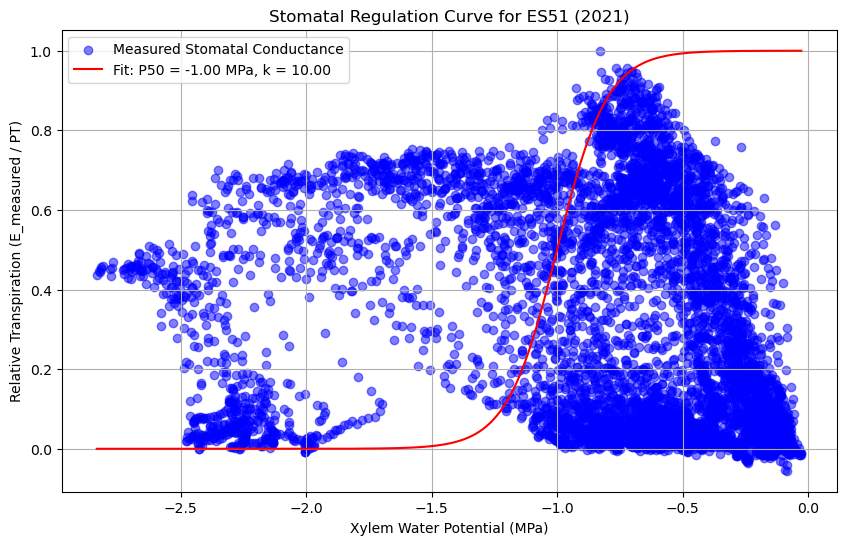

In [30]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Logistic function for stomatal regulation
def f_psi(psi_x, P50, k):
    return 1 / (1 + np.exp(-k * (psi_x - P50)))

# Objective function for curve fitting (least squares)
def objective(params, psi_x, f_measured):
    P50, k = params
    return f_measured - f_psi(psi_x, P50, k)

# Load and process data
for data in trees_data.values():
    if data['tree'] == 'DF49' and data['year'] == '2022':
        # Extract time series data
        df = data['SF_W_SM_PSY']
        dates = df.index
        PET = df['PET'].values
        SM = df['Soil_moisture'].values
        psi_measured = df['PSY'].values  # Measured xylem water potential
        SF = df['SF_complete'].values    # Sap flow in cm³/h

        # Convert soil moisture to water potential (Van Genuchten)
        theta_s = np.nanmax(SM)  # Saturated moisture content
        theta_r = np.nanmin(SM) - 0.021  # Residual moisture content
        alpha = 0.0085
        n = 2.085
        m = 1 - 1/n
        psi_s = np.array([invθ(θ, theta_s, theta_r, alpha, n, m) for θ in SM]) if 'invθ' in globals() else np.nan * np.ones(len(SM))

        # Calculate E_measured from SF_complete
        LA = float(data['leaf_area']) / 10000  # Convert cm² to m²
        E_measured = (SF * 1e-6) / LA  # cm³/h to m³/h

        # Potential transpiration (PT) as the maximum observed E_measured (proxy)
        PT = np.nanmax(E_measured) if np.any(~np.isnan(E_measured)) else np.nanmax(PET) * 0.18  # Use LAI_LAI_max = 0.18 as scaling factor
        f_measured = E_measured / PT  # Normalized stomatal conductance (0 to 1)

        # Filter out NaN values for fitting
        mask = ~np.isnan(psi_measured) & ~np.isnan(f_measured)
        psi_x_fit = psi_measured[mask]
        f_measured_fit = f_measured[mask]

        # Initial guess and bounds for P50 and k
        initial_params = [-1.0, 20]  # Based on previous optimization
        bounds = ([-5.0, 10], [-1, 80])  # P50 from -2.0 to -0.05 MPa, k from 10 to 30

        # Fit the logistic function
        try:
            popt, pcov = curve_fit(f_psi, psi_x_fit, f_measured_fit, p0=initial_params, bounds=bounds, maxfev=10000)
            P50_opt, k_opt = popt
            print(f"Optimized P50: {P50_opt:.4f} MPa")
            print(f"Optimized k: {k_opt:.4f}")
        except RuntimeError as e:
            print(f"Curve fitting failed: {e}")
            P50_opt, k_opt = initial_params
            print(f"Using initial guess: P50 = {P50_opt:.4f} MPa, k = {k_opt:.4f}")

        # Generate smooth curve for plotting
        psi_x_range = np.linspace(min(psi_x_fit), max(psi_x_fit), 200)
        f_psi_fit = f_psi(psi_x_range, P50_opt, k_opt)

        # Plot stomatal regulation
        plt.figure(figsize=(10, 6))
        plt.scatter(psi_x_fit, f_measured_fit, color='blue', alpha=0.5, label='Measured Stomatal Conductance')
        plt.plot(psi_x_range, f_psi_fit, color='red', label=f'Fit: P50 = {P50_opt:.2f} MPa, k = {k_opt:.2f}')
        plt.xlabel('Xylem Water Potential (MPa)')
        plt.ylabel('Relative Transpiration (E_measured / PT)')
        plt.title('Stomatal Regulation Curve for ES51 (2021)')
        plt.legend()
        plt.grid(True)
        plt.show()

        break

# Van Genuchten equation (included for completeness, assumed available)
def invθ(θ, θs, θr, α, n, m):
    rho_w = 1000  # Water density (kg/m³)
    if θ <= θr or np.isnan(θ):
        return np.nan
    try:
        return (((1/α) * (((θs - θr) / (θ - θr))**(1/m) - 1)**(1/n)) * rho_w * 1e-6 * -1).real  # J/kg -> MPa
    except (ValueError, RuntimeWarning):
        return np.nan

### SPAC FOR DRY PERIOD

In [31]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from scipy.optimize import root_scalar

# Weibull resistance function
def R_p(psi_x, R_min, R_max, b, d):
    return R_min + (R_max - R_min) * (1 - np.exp(-((-psi_x / b) ** d)))

# Logistic transpiration reduction function
def f_psi(psi_x, P50, k):
    return 1 / (1 + np.exp(-k * (psi_x - P50)))

# Supply-demand difference function
def supply_demand_diff(psi_x, psi_s, PT, R_min, R_max, b, d, P50, k):
    R_p_val = R_p(psi_x, R_min, R_max, b, d)
    T_supply = (psi_s - psi_x) / R_p_val if R_p_val != 0 else np.inf
    T_demand = f_psi(psi_x, P50, k) * PT
    return T_supply - T_demand

# Van Genuchten equation for soil moisture to water potential
def invθ(θ, θs, θr, α, n, m):
    rho_w = 1000  # Water density (kg/m³)
    if θ <= θr or np.isnan(θ):
        return np.nan
    try:
        return (((1/α) * (((θs - θr) / (θ - θr))**(1/m) - 1)**(1/n)) * rho_w * 1e-6 * -1).real  # J/kg -> MPa
    except (ValueError, RuntimeWarning):
        return np.nan

# Load and process data
for data in trees_data.values():
    if data['tree'] == 'DF49' and data['year'] == '2022':
        # Parameters
        params = {
            'LAI_LAI_max': 1,
            'R_min': 7.98,
            'R_max': 15000,#10500, #750
            'b': 1.37,
            'd': 2.92
        }

        # Optimized stomatal parameters
        P50_opt = -1.5
        k_opt = 20#10.0000

        # Extract time series data
        df = data['SF_W_SM_PSY']
        dates = df.index
        PET = df['PET'].values
        SM = (df['Soil_moisture'].values)*1 #############SOIL MOISTURE
        psi_measured = df['PSY'].values  # Assuming PSY column contains measured water potential

        # Convert soil moisture to water potential
        theta_s = np.nanmax(SM)  # Saturated moisture content
        theta_r = np.nanmin(SM) - 0.021  # Residual moisture content
        alpha = 0.0085
        n = 2.085
        m = 1 - 1/n
        psi_s = np.array([invθ(θ, theta_s, theta_r, alpha, n, m) for θ in SM])

        # Calculate E_measured from SF_complete
        LA = float(data['leaf_area']) / 10000  # Convert cm² to m²
        E_measured = (df['SF_complete'].values * 1e-6) / LA  # cm³/h to m³/h

        # Potential transpiration
        PT = PET * params['LAI_LAI_max']

        # Predict psi_x and E_predicted
        psi_x_predicted = []
        E_predicted = []
        for i in range(len(psi_s)):
            sol = root_scalar(
                supply_demand_diff,
                args=(psi_s[i], PT[i], params['R_min'], params['R_max'], params['b'], params['d'], P50_opt, k_opt),
                bracket=[psi_s[i] - 5, psi_s[i]],
                method='brentq'
            )
            if sol.converged:
                psi_x = sol.root
                psi_x_predicted.append(psi_x)
                E_predicted.append(f_psi(psi_x, P50_opt, k_opt) * PT[i])
            else:
                psi_x_predicted.append(np.nan)
                E_predicted.append(np.nan)

        # Convert to numpy arrays for calculations
        E_predicted = np.array(E_predicted)
        psi_x_predicted = np.array(psi_x_predicted)

        # Calculate RMSE
        mask_E = ~np.isnan(E_measured) & ~np.isnan(E_predicted)
        rmse_E = np.sqrt(np.mean((E_measured[mask_E] - E_predicted[mask_E]) ** 2)) if np.any(mask_E) else np.nan
        print(f"RMSE for Transpiration: {rmse_E:.6f} m/h")

        mask_psi = ~np.isnan(psi_measured) & ~np.isnan(psi_x_predicted)
        rmse_psi = np.sqrt(np.mean((psi_measured[mask_psi] - psi_x_predicted[mask_psi]) ** 2)) if np.any(mask_psi) else np.nan
        print(f"RMSE for Water Potential: {rmse_psi:.6f} MPa")

        # Plot 1: Transpiration
        fig1 = go.Figure()
        fig1.add_trace(go.Scatter(x=dates, y=E_measured, mode='lines', name='E_measured', line=dict(color='blue')))
        fig1.add_trace(go.Scatter(x=dates, y=[i*1 for i in E_predicted], mode='lines', name='E_predicted', line=dict(color='red')))
        fig1.update_layout(
            title='Transpiration: Measured vs Predicted',
            xaxis_title='Date',
            yaxis_title='Transpiration (m/h)',
            template='plotly_white',
            hovermode='closest'
        )
        fig1.show()

        # Plot 2: Water Potential
        fig2 = go.Figure()
        fig2.add_trace(go.Scatter(x=dates, y=psi_measured, mode='lines', name='Psi_measured', line=dict(color='green')))
        fig2.add_trace(go.Scatter(x=dates, y=[i*1 for i in psi_x_predicted], mode='lines', name='Psi_predicted', line=dict(color='orange')))
        fig2.update_layout(
            title='Water Potential: Measured vs Predicted',
            xaxis_title='Date',
            yaxis_title='Water Potential (MPa)',
            template='plotly_white',
            hovermode='closest'
        )
        fig2.show()

        break

RMSE for Transpiration: 0.000049 m/h
RMSE for Water Potential: 0.947678 MPa


In [ ]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from scipy.optimize import root_scalar
from datetime import time

# Weibull resistance function
def R_p(psi_x, R_min, R_max, b, d):
    return R_min + (R_max - R_min) * (1 - np.exp(-((-psi_x / b) ** d)))

# Logistic transpiration reduction function
def f_psi(psi_x, P50, k):
    return 1 / (1 + np.exp(-k * (psi_x - P50)))

# Supply-demand difference function
def supply_demand_diff(psi_x, psi_s, PT, R_min, R_max, b, d, P50, k):
    R_p_val = R_p(psi_x, R_min, R_max, b, d)
    T_supply = (psi_s - psi_x) / R_p_val if R_p_val != 0 else np.inf
    T_demand = f_psi(psi_x, P50, k) * PT
    return T_supply - T_demand

# Van Genuchten equation for soil moisture to water potential
def invθ(θ, θs, θr, α, n, m):
    rho_w = 1000  # Water density (kg/m³)
    if θ <= θr or np.isnan(θ):
        return np.nan
    try:
        return (((1/α) * (((θs - θr) / (θ - θr))**(1/m) - 1)**(1/n)) * rho_w * 1e-6 * -1).real  # J/kg -> MPa
    except (ValueError, RuntimeWarning):
        return np.nan

# Load and process data
for data in trees_data.values():
    if data['tree'] == 'DF49' and data['year'] == '2022':
        # Parameters
        params = {
            'LAI_LAI_max': 1,
            'R_min': 7.98,  # 7.98,
            'R_max': 18000,  # 750,
            'b': 1.37,  # 2.06, 1.37,
            'd': 4.92  # 4
        }

        # Optimized stomatal parameters
        P50_opt = -1.5  # -2
        k_opt = 80  # 10.0000

        # Extract time series data
        df = data['SF_W_SM_PSY']        alpha = 0.0085
        n = 2.085
        m = 1 - 1/n
        psi_s = np.array([invθ(θ, theta_s, theta_r, alpha, n, m) for θ in SM])

        # Calculate E_measured from SF_complete
        LA = float(data['leaf_area']) / 10000  # Convert cm² to m²
        E_measured = (df['SF_complete'].values * 1e-6) / LA  # cm³/h to m³/h

        # Potential transpiration
        PT = PET * params['LAI_LAI_max']

        # Determine minimum PET for nighttime (10 PM to 7 AM) using 5th percentile
        nighttime_mask = (dates.time >= time(22, 0)) | (dates.time < time(7, 0))
        PET_nighttime = PET[nighttime_mask]
        PET_min = np.nanpercentile(PET_nighttime, 5) if np.any(~np.isnan(PET_nighttime)) else np.nanmin(PET) * 0.1

        # Predict psi_x and E_predicted with nighttime/rain adjustment
        psi_x_predicted = []
        E_predicted = []
        for i in range(len(psi_s)):
            # Check for nighttime, low VPD, or rain conditions
            is_night_or_rain = (
                (dates[i].time() >= time(22, 0) or dates[i].time() < time(7, 0)) or  # Fixed: call time() method
                (VPD[i] < 0.3) or
                (Rain[i] > 0)
            )

            if is_night_or_rain:
                # Minimal transpiration with near-closed stomata
                PT_min = PET_min * params['LAI_LAI_max']
                f_psi_min = f_psi(psi_s[i], P50_opt, k_opt) * 0.01  # Force near-zero stomatal conductance
                E_predicted.append(min(PT_min * f_psi_min, 0.0001))  # Cap at 0.0001 mm/h
                psi_x_predicted.append(psi_s[i])  # Equilibrate with soil potential
            else:
                sol = root_scalar(
                    supply_demand_diff,
                    args=(psi_s[i], PT[i], params['R_min'], params['R_max'], params['b'], params['d'], P50_opt, k_opt),
                    bracket=[psi_s[i] - 5, psi_s[i]],
                    method='brentq'
                )
                if sol.converged:
                    psi_x = sol.root
                    psi_x_predicted.append(psi_x)
                    E_predicted.append(f_psi(psi_x, P50_opt, k_opt) * PT[i])
                else:
                    psi_x_predicted.append(np.nan)
                    E_predicted.append(np.nan)

        # Convert to numpy arrays for calculations
        E_predicted = np.array(E_predicted)
        psi_x_predicted = np.array(psi_x_predicted)

        # Calculate RMSE
        mask_E = ~np.isnan(E_measured) & ~np.isnan(E_predicted)
        rmse_E = np.sqrt(np.mean((E_measured[mask_E] - E_predicted[mask_E]) ** 2)) if np.any(mask_E) else np.nan
        print(f"RMSE for Transpiration: {rmse_E:.6f} m/h")

        mask_psi = ~np.isnan(psi_measured) & ~np.isnan(psi_x_predicted)
        rmse_psi = np.sqrt(np.mean((psi_measured[mask_psi] - psi_x_predicted[mask_psi]) ** 2)) if np.any(mask_psi) else np.nan
        print(f"RMSE for Water Potential: {rmse_psi:.6f} MPa")

        # Plot 1: Transpiration
        fig1 = go.Figure()
        fig1.add_trace(go.Scatter(x=dates, y=E_measured, mode='lines', name='E_measured', line=dict(color='blue')))
        fig1.add_trace(go.Scatter(x=dates, y=E_predicted, mode='lines', name='E_predicted', line=dict(color='red')))
        fig1.update_layout(
            title='Transpiration: Measured vs Predicted',
            xaxis_title='Date',
            yaxis_title='Transpiration (m/h)',
            template='plotly_white',
            hovermode='closest'
        )
        fig1.show()

        # Plot 2: Water Potential
        fig2 = go.Figure()
        fig2.add_trace(go.Scatter(x=dates, y=psi_measured, mode='lines', name='Psi_measured', line=dict(color='green')))
        fig2.add_trace(go.Scatter(x=dates, y=[i * 1 for i in psi_x_predicted], mode='lines', name='Psi_predicted', line=dict(color='orange')))
        fig2.update_layout(
            title='Water Potential: Measured vs Predicted',
            xaxis_title='Date',
            yaxis_title='Water Potential (MPa)',
            template='plotly_white',
            hovermode='closest'
        )
        fig2.show()

        break
        dates = df.index
        PET = df['PET'].values
        SM = df['Soil_moisture'].values * 1  # Soil moisture scaling
        psi_measured = df['PSY'].values
        VPD = df['VPD'].values  # Vapor Pressure Deficit in kPa
        Rain = df['Rain'].values  # Rainfall in mm

        # Convert soil moisture to water potential
        theta_s = np.nanmax(SM)
        theta_r = np.nanmin(SM) - 0.021


RMSE for Transpiration: 0.000048 m/h
RMSE for Water Potential: 0.690476 MPa


In [33]:
import numpy as np
from scipy.optimize import root_scalar
import plotly.graph_objects as go
import pandas as pd

# Weibull resistance function (bounded)
def R_p(psi_x, R_min, R_max, b, d):
    return R_min + (R_max - R_min) * (1 - np.exp(-((-psi_x / b) ** d)))

# Transpiration reduction function
# def f_psi(psi_x, P50):
#     k=2
#     return 1 / (1+ np.exp(-k*(P50 - psi_x)))
def f_psi(psi_x, p1, p2):
    if psi_x > p1:
        return 1
    elif p2 <= psi_x <= p1:
        return (psi_x - p2) / (p1 - p2)
    else:
        return 0#(psi_x - p2) / (p1 - p2)

# Supply-demand difference function
def supply_demand_diff(psi_x, psi_s, PT, R_min,R_max, b, d, p1, p2):
    R_p_val = R_p(psi_x, R_min, R_max, b, d)
    T_supply = (psi_s - psi_x) / R_p_val if R_p_val != 0 else 0
  
    T_demand = f_psi(psi_x, p1, p2) * PT #f_psi(psi_x,P50=-2)#
    return T_supply - T_demand

# Solve for psi_x and transpiration
def solve_hydraulics(psi_s, PET, LAI_LAI_max, R_min,R_max, b, d, p1, p2):
    PT = PET * LAI_LAI_max
    sol = root_scalar(
        supply_demand_diff,
        args=(psi_s, PT, R_min, R_max, b, d, p1, p2),
        #args=(psi_s, PT, R_min, b, d, p1, p2),
        bracket=[psi_s - 5, psi_s],
        method='brentq'
    )
    if sol.converged:
        psi_x_eq = sol.root
        E_eq = f_psi(psi_x_eq, p1, p2) * PT # f_psi(psi_x_eq,P50=-2)
        return psi_x_eq, E_eq
    return np.nan, np.nan

# Van Genuchten equation for soil moisture to water potential
def invθ(θ, θs, θr, α, n, m):
    rho_w = 1000  # Water density (kg/m³)
    if θ <= θr or np.isnan(θ):
        return np.nan
    try:
        return (((1/α) * (((θs - θr) / (θ - θr))**(1/m) - 1)**(1/n)) * rho_w * 1e-6 * -1).real  # J/kg -> MPa
    except (ValueError, RuntimeWarning):
        return np.nan

# Main processing function
def process_tree_data(tree_data):
    # Parameters
    params = {
        'R_min': 2, 'R_max': 1500, 'b': 4.99, 'd': 4.59, #1.54 4
        'p1': -0.002, 'p2': -1.5, 'LAI_LAI_max': 1
    } # 'R_min': 7.98, 'R_max': 750,'p1': -1, 'p2': -2.38,'b': 1.54, 'd': 4,
    P50 = -2#-1.83
    LA = float(tree_data['leaf_area']) / 10000  # Convert cm² to m²

    # Extract time series data
    df = tree_data['SF_W_SM_PSY']
    dates = df.index
    PET = df['PET'].values
    SM = df['Soil_moisture'].values

    # Convert soil moisture to water potential
    θs = np.nanmax(SM)  # Saturated moisture content
    θr = np.nanmin(SM) - 0.021  # Residual moisture content
    α = 0.0085
    n = 2.085
    m = 1 - 1/n
    psi_s = np.array([invθ(θ, θs, θr, α, n, m) for θ in SM])

    # Calculate E_measured from SF_complete
    E_measured = (df['SF_complete'].values * 1e-6) / LA  # cm³/h to m³/h

    # Predict E and psi_x
    E_predicted = []
    psi_x_predicted = []
    for i in range(len(dates)):
        psi_s_val = psi_s[i]
        PET_val = PET[i]
        psi_x, E = solve_hydraulics(psi_s_val, PET_val, **params)
        E_predicted.append(E)
        psi_x_predicted.append(psi_x)

    E_predicted = np.array(E_predicted)
    psi_x_predicted = np.array(psi_x_predicted)

    # Extract measured PSY (with NaN handling)
    psi_measured = df['PSY'].values

    # Accuracy metric (RMSE for non-NaN pairs)
    mask = ~np.isnan(E_measured) & ~np.isnan(E_predicted)
    if np.any(mask):
        rmse_E = np.sqrt(np.mean((E_measured[mask] - E_predicted[mask]) ** 2))
    else:
        rmse_E = np.nan

    mask_psi = ~np.isnan(psi_measured) & ~np.isnan(psi_x_predicted)
    if np.any(mask_psi):
        rmse_psi = np.sqrt(np.mean((psi_measured[mask_psi] - psi_x_predicted[mask_psi]) ** 2))
    else:
        rmse_psi = np.nan

    return dates, E_measured, E_predicted, psi_measured, psi_x_predicted, rmse_E, rmse_psi

# Load and process data
for data in trees_data.values():
    if data['tree'] == 'DF49' and data['year'] == '2022':
        dates, E_measured, E_predicted, psi_measured, psi_x_predicted, rmse_E, rmse_psi = process_tree_data(data)
        break

# Plot 1: Transpiration
fig1 = go.Figure()
fig1.add_trace(go.Scatter(x=dates, y=E_measured, mode='lines', name='E_measured', line=dict(color='blue')))
fig1.add_trace(go.Scatter(x=dates, y=[i*1 for i in E_predicted], mode='lines', name='E_predicted', line=dict(color='red')))
fig1.update_layout(
    title='Transpiration: Measured vs Predicted',
    xaxis_title='Date',
    yaxis_title='Transpiration (m/h)',
    template='plotly_white',
    hovermode='closest'
)
fig1.show()

# Plot 2: Water Potential
fig2 = go.Figure()
fig2.add_trace(go.Scatter(x=dates, y=psi_measured, mode='lines', name='Psi_measured', line=dict(color='green')))
fig2.add_trace(go.Scatter(x=dates, y=psi_x_predicted, mode='lines', name='Psi_predicted', line=dict(color='orange')))
fig2.update_layout(
    title='Water Potential: Measured vs Predicted',
    xaxis_title='Date',
    yaxis_title='Water Potential (MPa)',
    template='plotly_white',
    hovermode='closest'
)
fig2.show()

# Print accuracy metrics
print(f"RMSE for Transpiration (E): {rmse_E:.6f} m/h")
print(f"RMSE for Water Potential (Psi): {rmse_psi:.6f} MPa")

RMSE for Transpiration (E): 0.074546 m/h
RMSE for Water Potential (Psi): 0.620663 MPa


# General functions graphic exploration 

## Weibull graph (explore d,c changes)

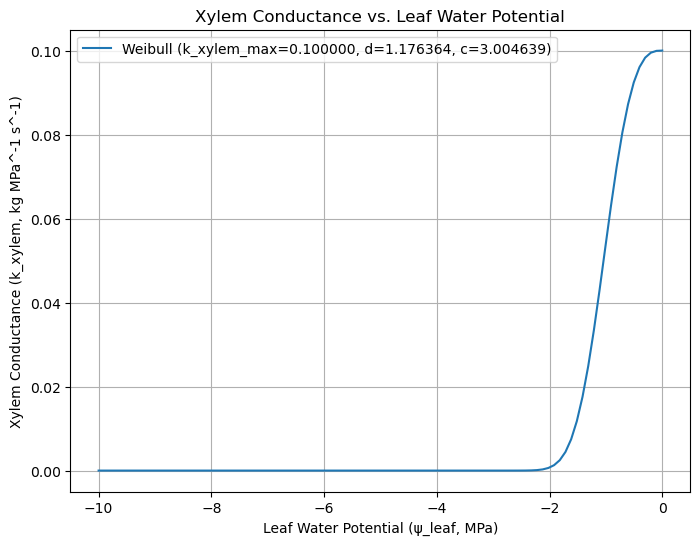

In [34]:
import numpy as np
import matplotlib.pyplot as plt

# Weibull function for xylem conductance
def xylem_conductance(psi_leaf, k_xylem_max, d, c):
    """
    Calculate xylem conductance based on water potential.
    psi_leaf: leaf water potential (MPa, negative)
    k_xylem_max: maximum xylem conductance (kg MPa^-1 s^-1)
    d, c: Weibull parameters for cavitation
    Returns conductance in kg MPa^-1 s^-1
    """
    return k_xylem_max * np.exp(-(np.abs(psi_leaf) / d) ** c)

# Parameters
k_xylem_max = 1/10#,]#0.042#1/10 #626 # kg MPa^-1 s^-1
d = 1.176364#1  1.99                # MPa
c = 3.004639#2.11 #1.23               # Unitless
   
# Generate ψ_leaf values
psi_leaf = np.linspace(0, -10, 100)  # MPa, from 0 to -3

k_xylem = xylem_conductance(psi_leaf, k_xylem_max, d, c)


# Plot
plt.figure(figsize=(8, 6))
plt.plot(psi_leaf, k_xylem, label=f'Weibull (k_xylem_max={k_xylem_max:.6f}, d={d}, c={c})')
plt.xlabel('Leaf Water Potential (ψ_leaf, MPa)')
plt.ylabel('Xylem Conductance (k_xylem, kg MPa^-1 s^-1)')
plt.title('Xylem Conductance vs. Leaf Water Potential')
plt.grid(True)
plt.legend()
plt.show()



In [35]:
import numpy as np
import plotly.graph_objects as go

# Weibull function for xylem conductance
def xylem_conductance(psi_leaf, k_xylem_max, d, c):
    """
    Calculate xylem conductance based on water potential.
    psi_leaf: leaf water potential (MPa, negative)
    k_xylem_max: maximum xylem conductance (kg MPa^-1 s^-1)
    d, c: Weibull parameters for cavitation
    Returns conductance in kg MPa^-1 s^-1
    """
    return k_xylem_max * np.exp(-(np.abs(psi_leaf) / d) ** c)

# Parameters
k_xylem_max = 1#,]#0.042#1/10 #626 # kg MPa^-1 s^-1
d = [1.99,1.99,1.85,2.85,4.92]#1  1.99                # MPa
c = [4.19,1.8,1.11,1.11,1.37]#2.11 #1.23               # Unitless

# Generate ψ_leaf values
psi_leaf = np.linspace(0, -10, 100)  # MPa, from 0 to -3

#k_xylem = xylem_conductance(psi_leaf, k_xylem_max, d, c)

# Create traces for different psi_50 and s combinations
fig = go.Figure()
for i,j in zip(d,c):
    k_psi = xylem_conductance(psi_leaf=psi_leaf, k_xylem_max=k_xylem_max, d=i, c=j)
    fig.add_trace(go.Scatter(
        x=psi_leaf,
        y=1-k_psi,
        mode='lines',
        name=f'k={k_xylem_max} MPa, d={i}, c={j}',
    ))
# for i in d:
#     for j in c:
#         k_psi = xylem_conductance(psi_leaf=psi_leaf, k_xylem_max=k_xylem_max, d=i, c=j)
#         fig.add_trace(go.Scatter(
#             x=psi_leaf,
#             y=1-k_psi,
#             mode='lines',
#             name=f'ψ_50={psi_50} MPa, k={k_xylem_max} MPa, d={i}, c={j}',
#         ))

# Update layout
fig.update_layout(
    xaxis_title='Xylem Water Potential (ψ_leaf, MPa)',
    yaxis_title='conductance ',
    legend_title='Parameters',
    hovermode='x unified',
    template='plotly_white'
)

# Show the plot
fig.show()

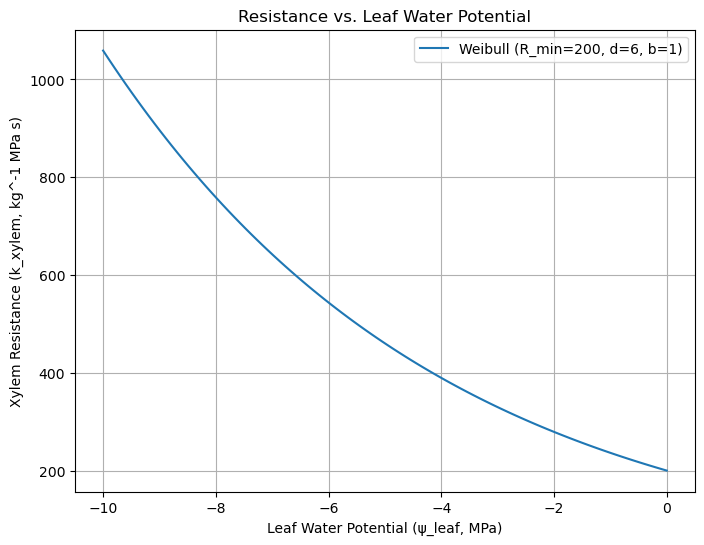

In [36]:

import numpy as np
import matplotlib.pyplot as plt

# Weibull function for xylem resistance
def xylem_resistance(R_min, d, b, psi_x):
    """
    Calculate xylem conductance based on water potential.
    psi_leaf: leaf water potential (MPa, negative)
    k_xylem_max: maximum xylem conductance (kg MPa^-1 s^-1)
    d, c: Weibull parameters for cavitation
    Returns conductance in kg MPa^-1 s^-1
    """
    return R_min * (np.exp(((-psi_x / d) ** b)))


# Parameters
R_min = 200#2
d = 6#4.59 #1.99                # MPa
b = 1#4.45#4.99 #             # Unitless

# Generate ψ_leaf values
psi_x = np.linspace(0, -10, 100)  # MPa, from 0 to -3
R_xylem = xylem_resistance(R_min, d, b, psi_x)
 
# Plot
plt.figure(figsize=(8, 6))
plt.plot(psi_leaf, R_xylem, label=f'Weibull (R_min={R_min:.0f}, d={d}, b={b})')
plt.xlabel('Leaf Water Potential (ψ_leaf, MPa)')
plt.ylabel('Xylem Resistance (k_xylem, kg^-1 MPa s)')
plt.title('Resistance vs. Leaf Water Potential')
plt.grid(True)
plt.legend()
plt.show()

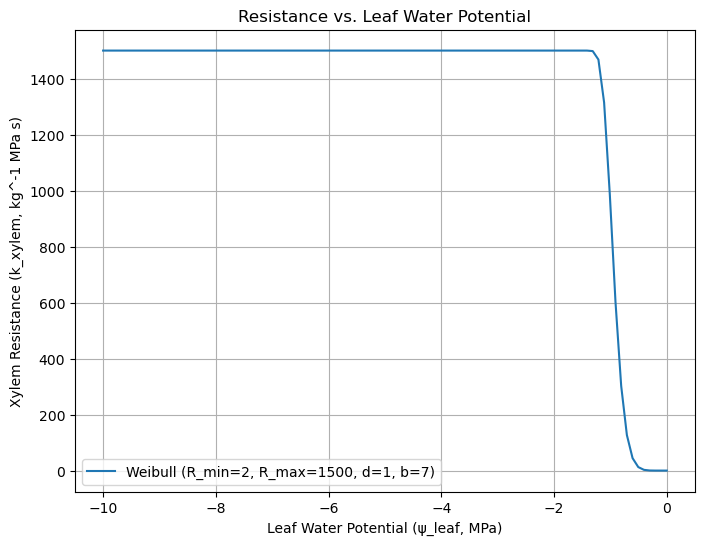

In [37]:

import numpy as np
import matplotlib.pyplot as plt

# Weibull function for xylem conductance
def xylem_conductance(R_min, R_max, d, b, psi_x):
    """
    Calculate xylem conductance based on water potential.
    psi_leaf: leaf water potential (MPa, negative)
    k_xylem_max: maximum xylem conductance (kg MPa^-1 s^-1)
    d, c: Weibull parameters for cavitation
    Returns conductance in kg MPa^-1 s^-1
    """
    return R_min + (R_max - R_min) * (1 - np.exp(-((-psi_x / d) ** b)))


# Parameters
R_min = 2#2
R_max = 1500 #1500
d = 1#4.59 #1.99                # MPa
b = 7#4.45#4.99 #             # Unitless

# Generate ψ_leaf values
psi_x = np.linspace(0, -10, 100)  # MPa, from 0 to -3
R_xylem = xylem_conductance(R_min, R_max, d, b, psi_x)
 
# Plot
plt.figure(figsize=(8, 6))
plt.plot(psi_leaf, R_xylem, label=f'Weibull (R_min={R_min:.0f}, R_max={R_max:.0f}, d={d}, b={b})')
plt.xlabel('Leaf Water Potential (ψ_leaf, MPa)')
plt.ylabel('Xylem Resistance (k_xylem, kg^-1 MPa s)')
plt.title('Resistance vs. Leaf Water Potential')
plt.grid(True)
plt.legend()
plt.show()

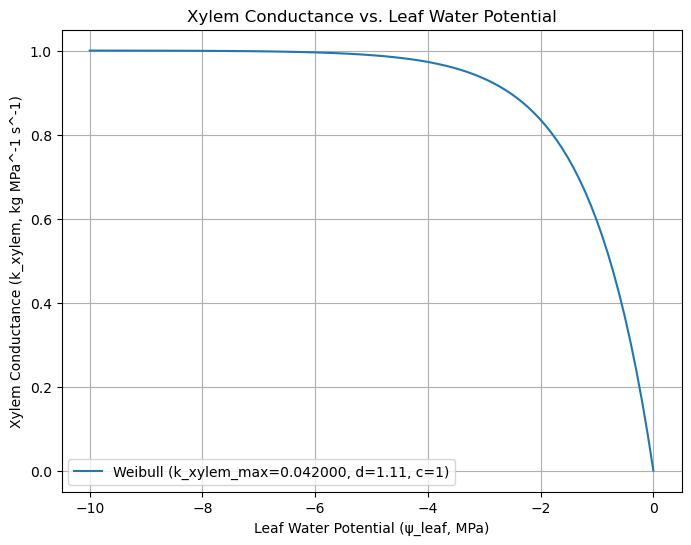

In [38]:
import numpy as np
import matplotlib.pyplot as plt

# Weibull function for xylem conductance
def xylem_conductance(psi_leaf, k_xylem_max, d, c):
    """
    Calculate xylem conductance based on water potential.
    psi_leaf: leaf water potential (MPa, negative)
    k_xylem_max: maximum xylem conductance (kg MPa^-1 s^-1)
    d, c: Weibull parameters for cavitation
    Returns conductance in kg MPa^-1 s^-1
    """

    return (k_xylem_max * (1-np.exp(-(np.abs(psi_leaf) / d) ** c)))/k_xylem_max

# Parameters
k_xylem_max = 0.042#1/10 #626 # kg MPa^-1 s^-1
d = 1.11                 # MPa
c = 1                # Unitless

# Generate ψ_leaf values
psi_leaf = np.linspace(0, -10, 100)  # MPa, from 0 to -3
k_xylem = xylem_conductance(psi_leaf, k_xylem_max, d, c)

# Plot
plt.figure(figsize=(8, 6))
plt.plot(psi_leaf, k_xylem, label=f'Weibull (k_xylem_max={k_xylem_max:.6f}, d={d}, c={c})')
plt.xlabel('Leaf Water Potential (ψ_leaf, MPa)')
plt.ylabel('Xylem Conductance (k_xylem, kg MPa^-1 s^-1)')
plt.title('Xylem Conductance vs. Leaf Water Potential')
plt.grid(True)
plt.legend()
plt.show()

In [39]:
for data in trees_data.values():
    fig = go.Figure()
    if data['tree'] == 'DF49' and data['year'] == '2022':
        fig.add_trace(go.Scatter(x=data['SF_W_SM_PSY'].index, y=data['SF_W_SM_PSY']['PET'], mode='lines', name='PET', line=dict(color='blue')))
        
        fig.show()

## Graph exploration for stomatal conductance

In [40]:
import numpy as np
import plotly.graph_objects as go

# Corrected logistic function for stomatal conductance
def g_s_logistic(psi_leaf, psi_50, k):

    return (1 / (1+ np.exp(-k*(psi_50 - psi_leaf))))


# Parameters
k_values = [10,20,30,80,100]  #steepness [1,2,3]
psi_50_values = [-0.05,-0.1,-0.35]#[-1,-1.5, -2.24, -3.0]  # Different psi_50 values to explore (MPa)
#s_values = [0.1,0.2,0.3,0.5]  # Different slope factors to explore (MPa)

# Generate ψ_leaf values
psi_leaf = np.linspace(-3, 0, 200)  # MPa, from -5 to 0

# Create traces for different psi_50 and s combinations
fig = go.Figure()

for psi_50 in psi_50_values:
    for k in k_values:
        g_s = g_s_logistic(psi_leaf, psi_50, k)
        fig.add_trace(go.Scatter(
            x=psi_leaf,
            y=g_s,
            mode='lines',
            name=f'ψ_50={psi_50} MPa, k={k} MPa'
        ))

# Update layout
fig.update_layout(
    xaxis_title='Xylem Water Potential (ψ_leaf, MPa)',
    yaxis_title='Stomatal reduction function',
    legend_title='Parameters',
    hovermode='x unified',
    template='plotly_white'
)

# Show the plot
fig.show()

In [41]:
import numpy as np
import plotly.graph_objects as go

# Corrected logistic function for stomatal conductance
def g_s_logistic(psi_leaf, g_s_max_mol, psi_50, s):
    """
    Calculate stomatal conductance based on leaf water potential.
    psi_leaf: leaf water potential (MPa, negative)
    g_s_max_mol: maximum stomatal conductance (mol m^-2 s^-1)
    psi_50: water potential at 50% of g_s_max (MPa)
    s: slope factor for stomatal response (MPa)
    Returns conductance in mol m^-2 s^-1
    """
    return g_s_max_mol / (1+ np.exp(((psi_50 - psi_leaf) / s)))

# Parameters
g_s_max_mol = 0.1  # Maximum stomatal conductance (mol m^-2 s^-1), based on MacDowell 2008 reference
psi_50_values = [-1]#[-1,-1.5, -2.24, -3.0]  # Different psi_50 values to explore (MPa)
s_values = [0.1,0.2,0.3,0.5]  # Different slope factors to explore (MPa)

# Generate ψ_leaf values
psi_leaf = np.linspace(-5, 0, 200)  # MPa, from -5 to 0

# Create traces for different psi_50 and s combinations
fig = go.Figure()

for psi_50 in psi_50_values:
    for s in s_values:
        g_s = g_s_logistic(psi_leaf, g_s_max_mol, psi_50, s)
        fig.add_trace(go.Scatter(
            x=psi_leaf,
            y=g_s,
            mode='lines',
            name=f'ψ_50={psi_50} MPa, s={s} MPa'
        ))

# Update layout
fig.update_layout(
    title='Stomatal Conductance vs. Leaf Water Potential',
    xaxis_title='Leaf Water Potential (ψ_leaf, MPa)',
    yaxis_title='Stomatal Conductance (g_s, mol m^-2 s^-1)',
    legend_title='Parameters',
    hovermode='x unified',
    template='plotly_white'
)

# Show the plot
fig.show()

## Explore Weibull for Resistance 

In [42]:
import numpy as np
import plotly.graph_objects as go

# Weibull function for xylem resistance
def xylem_resistance(R_min, d, b, psi_x):
    """
    Calculate xylem conductance based on water potential.
    psi_leaf: leaf water potential (MPa, negative)
    k_xylem_max: maximum xylem conductance (kg MPa^-1 s^-1)
    d, c: Weibull parameters for cavitation
    Returns conductance in kg MPa^-1 s^-1
    """
    return R_min * (np.exp(-((-psi_x / d) ** b)))


# Parameters
# R_min = [10,5000,5000,1810,5000,54.78,2247.40,2445.19,472,119.97,465,2836.41,5000] #2902
# d = [1.176364,1,0.1,1,1,1,1,1,1,1,1,1,1]#              # MPa
# b = [3.004639,1.24,0.26,0.778887,1.238109,0.856603,0.543338,0.834518,0.776890,1.211714,0.655859,0.804815,1.325700]#              # Unitless

R_min = [500,5000,10000,1000] #[1554,3572,2670,5000,1000,1000,1000]#[1,50000,16742, 47218,50000]#[3593,5000,5000,47940]#
d = [0.3,0.5,1,1]#[0.617605,1.027084,0.990071,1.684602,0.5,5,2]#[0.3,0.1,1,1,1]#[1,1,1,1]#[0.1,0.1,0.1,1]#[1,1,1]
b =[1.6,1.6,0.7,0.7]#[0.549406,0.500000,0.545913,0.500000,1,2.9,10]#[1,5,0.75,5,0.5]#[0.48,0.8,1.6,5]#[1.24,0.98,1.34]



#R_xylem = xylem_resistance(R_min, d, b, psi_x)
# Generate ψ_x values
psi_x = np.linspace(0, -6, 200)  # MPa, from 0 to -3

# Create traces for different psi_50 and s combinations
fig = go.Figure()
for r,i,j in zip(R_min,d,b):
    R_p = xylem_resistance(R_min=r,d=i,b=j,psi_x=psi_x)
    fig.add_trace(go.Scatter(
        x=psi_x,
        y=R_p,
        mode='lines',
        name=f'Rmin={r} MPa, d={i}, b={j}',
    ))

# Update layout
fig.update_layout(
    xaxis_title='Xylem Water Potential (ψ_leaf, MPa)',
    yaxis_title='Resistance (MPa s kg^-1)',
    legend_title='Parameters',
    hovermode='x unified',
    template='plotly_white',
    yaxis_range=[0, 10000]
)

# Show the plot
fig.show()

In [43]:
#RESISTANCE Rmin

import numpy as np
import plotly.graph_objects as go

# Weibull function for xylem resistance
def xylem_resistance(R_min, d, b, psi_x):
    """
    Calculate xylem conductance based on water potential.
    psi_leaf: leaf water potential (MPa, negative)
    k_xylem_max: maximum xylem conductance (kg MPa^-1 s^-1)
    d, c: Weibull parameters for cavitation
    Returns conductance in kg MPa^-1 s^-1
    """
    return  (R_min/R_min*(np.exp((-psi_x / d) ** b)))



R_min = [1,1,1] #
d = [3.49,6.06,4.558]#
b =[10,3.979,4.479]#




#R_xylem = xylem_resistance(R_min, d, b, psi_x)
# Generate ψ_x values
psi_x = np.linspace(0, -10, 100)  # MPa, from 0 to -3

# Create traces for different psi_50 and s combinations
fig = go.Figure()
for r,i,j in zip(R_min,d,b):
    R_p = xylem_resistance(R_min=r,d=i,b=j,psi_x=psi_x)
    fig.add_trace(go.Scatter(
        x=psi_x,
        y=R_p,
        mode='lines',
        name=f'Rmin={r} MPa, d={i}, b={j}',
    ))

# Update layout
fig.update_layout(
    xaxis_title='Xylem Water Potential (ψ_leaf, MPa)',
    yaxis_title='Resistance (MPa s kg^-1)',
    legend_title='Parameters',
    hovermode='x unified',
    template='plotly_white',
    yaxis_range=[0, 100]
)

# Show the plot
fig.show()

/var/folders/73/1hl1pq915rg4htnkk3r29mym0000gn/T/ipykernel_32297/3012814385.py:15: RuntimeWarning:

overflow encountered in exp



In [44]:
#HCL-relative conductance 
import numpy as np
import plotly.graph_objects as go

# Weibull function for xylem resistance
def hcl(R_min, d, b, psi_x):
    """
    Calculate xylem conductance based on water potential.
    psi_leaf: leaf water potential (MPa, negative)
    k_xylem_max: maximum xylem conductance (kg MPa^-1 s^-1)
    d, c: Weibull parameters for cavitation
    Returns conductance in kg MPa^-1 s^-1
    """
    return (1-(R_min/(R_min*((np.exp(((-psi_x / d) ** b))))))) #*100 to get percen
# Parameters
# R_min = [10,5000,5000,1810,5000,54.78,2247.40,2445.19,472,119.97,465,2836.41,5000] #2902
# d = [1.176364,1,0.1,1,1,1,1,1,1,1,1,1,1]#              # MPa
# b = [3.004639,1.24,0.26,0.778887,1.238109,0.856603,0.543338,0.834518,0.776890,1.211714,0.655859,0.804815,1.325700]#              # Unitless

R_min = [1,1,1,1,1,1,1]#[1,50000,16742.511060, 47217.973781,50000.000000]#[3593,5000,5000,47940.302196]#
d = [3.49]#[2.5,3,3.5,0.3,0.4,0.5]
b =[10]#

#99.86% 6.08
#R_xylem = xylem_resistance(R_min, d, b, psi_x)
# Generate ψ_x values
psi_x = np.linspace(0, -9, 200)  # MPa, from 0 to -3

# Create traces for different psi_50 and s combinations
fig = go.Figure()
for r,i,j in zip(R_min,d,b):
    hcl_ = hcl(R_min=r,d=i,b=j,psi_x=psi_x)
    fig.add_trace(go.Scatter(
        x=psi_x,
        y=hcl_,
        mode='lines',
        name=f'Rmin={r} MPa, d={i}, b={j}',
    ))

# Update layout
fig.update_layout(
    xaxis_title='Xylem Water Potential (ψ_leaf, MPa)',
    yaxis_title='HCL(%)',
    legend_title='Parameters',
    hovermode='x unified',
    template='plotly_white',
    yaxis_range=[0, 1]
)

# Show the plot
fig.show()

/var/folders/73/1hl1pq915rg4htnkk3r29mym0000gn/T/ipykernel_32297/3561362762.py:14: RuntimeWarning:

overflow encountered in exp



In [45]:
import numpy as np
import plotly.graph_objects as go

# Weibull function for xylem resistance
def conductance(k_max, d, b, psi_x):
    """
    Calculate xylem conductance based on water potential.
    psi_leaf: leaf water potential (MPa, negative)
    k_xylem_max: maximum xylem conductance (kg MPa^-1 s^-1)
    d, c: Weibull parameters for cavitation
    Returns conductance in kg MPa^-1 s^-1
    """
    return (k_max/(np.exp(((-psi_x / d) ** b))))


# Parameters
k_max = [0.000333,0.003185,0.001830,0.000351,0.089613,0.000793,0.000650,0.003250,0.039638]
d = [3.49,3.49,3.49,3.49,3.49,3.49,3.49,3.49,6.06]
b =[10,10,10,10,10,10,10,10,3.97]

# Generate ψ_x values
psi_x = np.linspace(0, -10, 200)  # MPa, from 0 to -3

# Create traces for different psi_50 and s combinations
fig = go.Figure()
for k,i,j in zip(k_max,d,b):
    k_ = conductance(k_max=k,d=i,b=j,psi_x=psi_x)
    fig.add_trace(go.Scatter(
        x=psi_x,
        y=k_,#
        mode='lines',
        name=f'K_max={k} MPa, d={i}, b={j}',
    ))

# Update layout
fig.update_layout(
    xaxis_title='Xylem Water Potential (ψ_leaf, MPa)',
    yaxis_title='k kg MPa-1 h-1',
    legend_title='Parameters',
    hovermode='x unified',
    template='plotly_white',
    yaxis_range=[0, 0.09]
)

# Show the plot
fig.show()

/var/folders/73/1hl1pq915rg4htnkk3r29mym0000gn/T/ipykernel_32297/2904640060.py:13: RuntimeWarning:

overflow encountered in exp



## CAVITATION MODEL

In [24]:
import numpy as np
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Parameters
K_sat = 0.002  # kg MPa⁻¹ s⁻¹
d_sat = 1#1.932 #4.558
b_sat = 5#2.308 #4.479
Psi_min = -2  # MPa, adjust to -0.14 for your case

# Calculate K_cav at Psi_min
K_cav = K_sat * np.exp(-((-Psi_min) / d_sat) ** b_sat)

# Psi range (from 0 to -6 MPa)
Psi = np.linspace(0, -6, 100)

# Original vulnerability curve
K_original = K_sat * np.exp(-((-Psi) / d_sat) ** b_sat)

# Cavitated vulnerability curve (Equation 12)
K_cavitated = np.where(Psi >= Psi_min, K_cav, K_cav * np.exp(-((-Psi) / d_sat) ** b_sat))

# Create plot
fig = make_subplots(rows=1, cols=1)
fig.add_trace(go.Scatter(x=Psi, y=K_original, name="Original Curve", line=dict(color="blue")))
fig.add_trace(go.Scatter(x=Psi, y=K_cavitated, name="Cavitated Curve", line=dict(color="red", dash="dash")))
fig.update_layout(
    title="Stem Vulnerability Curves (Equation 12)",
    xaxis_title="Water Potential (MPa)",
    yaxis_title="Hydraulic Conductivity (kg MPa⁻¹ s⁻¹)",
    xaxis_range=[-6, 0],
    yaxis_range=[0, K_sat * 1.1]
)
fig.show()

print(f"K_sat: {K_sat}")
print(f"K_cav at Psi_min = {Psi_min} MPa: {K_cav}")

K_sat: 0.002
K_cav at Psi_min = -2 MPa: 2.5328331098188352e-17


In [110]:
#same with resistance SOIL 
#parameters for ES51 
# Parameters
K_sat = 0.0006  # kg MPa⁻¹ s⁻¹
R_min = 1/K_sat
d_sat = 1.932#3.278 #1.932 #4.558 
b_sat = 2.308#1.924 #2.308 #4.479
Psi_min = -2  # MPa, adjust to -0.14 for your case

# Calculate K_cav at Psi_min
K_cav = K_sat * np.exp(-((-Psi_min) / d_sat) ** b_sat)
R_cav = 1/K_cav

# Psi range (from 0 to -6 MPa)
Psi = np.linspace(0, -6, 100)

# Original vulnerability curve
K_original = K_sat * np.exp(-((-Psi) / d_sat) ** b_sat)
R_original = 1/K_original

# Cavitated vulnerability curve (Equation 12)
K_cavitated = np.where(Psi >= Psi_min, K_cav, K_cav * np.exp(-((-Psi) / d_sat) ** b_sat))
R_cavitated = np.where(Psi >= Psi_min, R_cav, 1/(K_cav * np.exp(-((-Psi) / d_sat) ** b_sat)))


# Create plot
fig1 = make_subplots(rows=1, cols=1)
fig1.add_trace(go.Scatter(x=Psi, y=K_original, name="Original Curve", line=dict(color="blue")))
fig1.add_trace(go.Scatter(x=Psi, y=K_cavitated, name="Cavitated Curve", line=dict(color="red", dash="dash")))
fig1.update_layout(
    title="HCL curves",
    xaxis_title="Water Potential (MPa)",
    yaxis_title=" Conductance (kg MPa⁻¹ s⁻¹)",
    xaxis_range=[-6, 0],
    yaxis_range=[0, K_sat * 1.1]
)
fig1.show()

print(f"K_sat: {K_sat}")
print(f"K_cav at Psi_min = {Psi_min} MPa: {K_cav:.2f} kg MPa⁻¹ s⁻¹")

## HCL 
fig = make_subplots(rows=1, cols=1)
fig.add_trace(go.Scatter(x=Psi, y=(1-(K_original/K_sat))*100, name="Original Curve", line=dict(color="blue")))
fig.add_trace(go.Scatter(x=Psi, y=(1-(K_cavitated/K_sat))*100, name="Cavitated Curve", line=dict(color="red", dash="dash")))
fig.update_layout(
    title="Percentage Loss",
    xaxis_title="Water Potential (MPa)",
    yaxis_title="Percentage Loss (%)",
    xaxis_range=[-6, 0],
    yaxis_range=[0, 100]
)
fig.show()

print(f"%_cav at Psi_min = {Psi_min} MPa: {(1-(K_cav/K_sat))*100:.2f} %")


fig2 = make_subplots(rows=1, cols=1)
fig2.add_trace(go.Scatter(x=Psi, y=R_original, name="Original Curve", line=dict(color="blue")))
fig2.add_trace(go.Scatter(x=Psi, y=R_cavitated, name="Cavitated Curve", line=dict(color="red", dash="dash")))
fig2.update_layout(
    title="Resistance curves",
    xaxis_title="Water Potential (MPa)",
    yaxis_title="Resistance (MPa s kg⁻¹)",
    xaxis_range=[-6, 0],
    yaxis_range=[0, R_cav * 20]
)

fig2.show()

print(f"R_cav at Psi_min = {Psi_min} MPa: {R_cav:.2f} MPa s kg⁻¹")

K_sat: 0.0006
K_cav at Psi_min = -2 MPa: 0.00 kg MPa⁻¹ s⁻¹


%_cav at Psi_min = -2 MPa: 66.15 %


R_cav at Psi_min = -2 MPa: 4923.09 MPa s kg⁻¹


In [82]:
#same with resistance ES51

# Parameters
K_sat = 1/R_min#0.0003  # kg MPa⁻¹ s⁻¹ I think to match our data it should be around 0.0001
R_min = 8169#1/K_sat
d_sat = 4.13#0.942  #1.932 #4.558     1.584#
b_sat = 2.05#0.956 #2.308 #4.479 2.705#
Psi_min = -2  # MPa, adjust to -0.14 for your case

      
# Calculate K_cav at Psi_min
K_cav = K_sat * np.exp(-((-Psi_min) / d_sat) ** b_sat)
R_cav = 1/K_cav

# Psi range (from 0 to -6 MPa)
Psi = np.linspace(0, -6, 100)

# Original vulnerability curve
K_original = K_sat * np.exp(-((-Psi) / d_sat) ** b_sat)
R_original = 1/K_original

# Cavitated vulnerability curve (Equation 12)
K_new = np.where(Psi >= Psi_min, K_cav, K_cav * np.exp(-((-Psi) / d_sat) ** b_sat))
R_new = np.where(Psi >= Psi_min, R_cav, 1/(K_cav * np.exp(-((-Psi) / d_sat) ** b_sat)))


# Create plot
fig1 = make_subplots(rows=1, cols=1)
fig1.add_trace(go.Scatter(x=Psi, y=K_original, name="Original Curve", line=dict(color="blue")))
fig1.add_trace(go.Scatter(x=Psi, y=K_new, name="Cavitated Curve", line=dict(color="red", dash="dash")))
fig1.update_layout(
    title="Conductance curves",
    xaxis_title="Water Potential (MPa)",
    yaxis_title=" Conductance (kg MPa⁻¹ s⁻¹)",
    xaxis_range=[-6, 0],
    yaxis_range=[0, K_sat * 1.1]
)
fig1.show()

print(f"K_sat: {K_sat}")
print(f"K_cav at Psi_min = {Psi_min} MPa: {K_cav:.2f} kg MPa⁻¹ s⁻¹")

fig = make_subplots(rows=1, cols=1)
fig.add_trace(go.Scatter(x=Psi, y=(1-(K_original/K_sat))*100, name="Original Curve", line=dict(color="blue")))
fig.add_trace(go.Scatter(x=Psi, y=(1-(K_new/K_sat))*100, name="Cavitated Curve", line=dict(color="red", dash="dash")))
#fig.add_trace(go.Scatter(x=Psi, y=(K_new/K_cav)*100, name="Relative Percentage Loss", mode="markers"))#marker=dict(symbol='circle', color='green')))
                                 
fig.update_layout(
    title="Percentage Loss",
    xaxis_title="Water Potential (MPa)",
    yaxis_title="Percentage Loss (%)",
    xaxis_range=[-6, 0],
    yaxis_range=[0, 100]
)
fig.show()

print(f"%_cav at Psi_min = {Psi_min} MPa: {(1-(K_cav/K_sat))*100:.2f} %")

fig2 = make_subplots(rows=1, cols=1)
fig2.add_trace(go.Scatter(x=Psi, y=R_original, name="Original Curve", line=dict(color="blue")))
fig2.add_trace(go.Scatter(x=Psi, y=R_new, name="Cavitated Curve", line=dict(color="red", dash="dash")))
fig2.update_layout(
    title="Resistance curves",
    xaxis_title="Water Potential (MPa)",
    yaxis_title="Resistance (MPa s kg⁻¹)",
    xaxis_range=[-6, 0],
    yaxis_range=[0, R_cav * 20]
)

fig2.show()
print(f"R_cav at Psi_min = {Psi_min} MPa: {R_cav:.2f} MPa s kg⁻¹")


# p_rel =[]
# new_psi =[]
# for p in Psi:
#     if p < Psi_min:
#         p_r = 1 - ((K_cav * np.exp(-((-p) / d_sat) ** b_sat))/K_cav)
#         print(K_cav,(K_cav * np.exp(-((-p) / d_sat) ** b_sat))/K_cav,p_r,p)
#         p_rel.append(p_r)
#         new_psi.append(p)

# fig3 = make_subplots(rows=1, cols=1)
# fig3.add_trace(go.Scatter(x=new_psi, y=[p*100 for p in p_rel], name="Proportional loss of conductance", line=dict(color="blue")))

# fig3.update_layout(
#     xaxis_title="Water Potential < Psi_min (MPa) ",
#     yaxis_title="Relative loss of conductance (%)",
#     xaxis_range=[-6, Psi_min],
#     yaxis_range=[0, 100]
# )

# fig3.show()





K_sat: 0.00012241231183321864
K_cav at Psi_min = -2 MPa: 0.00 kg MPa⁻¹ s⁻¹


%_cav at Psi_min = -2 MPa: 20.24 %


R_cav at Psi_min = -2 MPa: 10242.23 MPa s kg⁻¹


In [118]:
# #VARYING PARAMETERS 
import plotly.graph_objects as go

# Parameters
K_sat = [1/6000,1/5179,1/3426,1/730,1/127]  # kg MPa⁻¹ s⁻¹ I think to match our data it should be around 0.0001 1261 theoretical 
d_sat = [3.98,2.19,2.52,2.855,2.1]
b_sat = [2.05,2.05,2.05,2.05,2.05]#
Psi_min = [-2,-2,-2,-2,-2]  # MPa, adjust to -0.14 for your case

      
# K_sat = [0.0003,0.0003,0.0003,0.0003,0.0003,0.0003,0.0003,0.0003,0.0003]  # kg MPa⁻¹ s⁻¹ I think to match our data it should be around 0.0001
# d_sat = [2.81,2.321,2.733,2.888,1.584,1.7,0.942,6.060,4.5] #DF  c8,c2,c22,c23,c35,madeup(inbetween values)
# b_sat = [2.89,2.842,3.031,3.708,2.705,2.7,0.942,3.979,3.9]# 
# Psi_min = [-2,-2,-2,-2,-2,-2,-2,-2,-4]  # MPa, adjust to -0.14 for your case

# Douglas fir 
# c7:5.06,4.448 c2:3.942,10.000,
# c8   root      2.810      2.829 0.984    -4.819              
# c21  stem       2.321      2.842 0.987   -3.972             
# c22  stem       2.733      3.031 0.970   -4.523           
# c23  stem       2.888      3.708 0.991   -4.359           
# c24  stem       2.642      4.043 0.992   -3.856              
# c27  stem       3.359     10.000 0.981   -3.911              
# c30  stem       3.492     10.000 0.982   -4.069           
# c35   stem      1.584      2.705 0.999   -2.790       
# 
# Engelmann spruce
#    c1 stem      4.558      4.479 0.909                  -6.408              98.993
#    c2 root      1.932      2.308 0.982                  -3.748              99.012
#    c3 root      1.499      1.002 0.889                  -6.883              99.000
#    c4 root      3.278      1.924 0.920                  -7.245              98.993
#    c5 root      0.942      0.956 0.976                  -4.656              99.002




fig_conductance = go.Figure()
fig_hcl = go.Figure()
fig_resistance = go.Figure()

for ksat,d,b,psi_min in zip(K_sat,d_sat,b_sat,Psi_min):
    R_min = 1/ksat
    K_cav = ksat * np.exp(-((-psi_min) / d) ** b)
    R_cav = 1/K_cav

    # Psi range (from 0 to -6 MPa)
    Psi = np.linspace(0, -10, 100)

    # Original vulnerability curve
    K_original = ksat * np.exp(-((-Psi) / d) ** b)
    R_original = 1/K_original

    # Cavitated vulnerability curve (Equation 12)
    K_new = np.where(Psi >= psi_min, K_cav, K_cav * np.exp(-((-Psi) / d) ** b))
    R_new = np.where(Psi >= psi_min, R_cav, 1/(K_cav * np.exp(-((-Psi) / d) ** b)))

    fig_conductance.add_trace(go.Scatter(x=Psi, y=K_original, name=f"Original Psi_min={psi_min}, K_sat={ksat}, d_sat={d}, b_sat={b}"))#, line=dict(color="blue")))
    fig_conductance.add_trace(go.Scatter(x=Psi, y=K_new, name=f"Cavitated Psi_min={psi_min},K_sat={ksat}, d_sat={d}, b_sat={b}", line=dict( dash="dash"))) #color="red",
    fig_conductance.update_layout(
        title="Conductance curves",
        xaxis_title="Water Potential (MPa)",
        yaxis_title=" Conductance (kg MPa⁻¹ s⁻¹)",
        xaxis_range=[-6, 0],
        yaxis_range=[0, ksat * 1.1]
    )


    fig_hcl.add_trace(go.Scatter(x=Psi, y=(1-(K_original/ksat))*100, name=f"Original Psi_min={psi_min},K_sat={ksat}, d_sat={d}, b_sat={b}"))# line=dict(color="blue")))
    fig_hcl.add_trace(go.Scatter(x=Psi, y=(1-(K_new/ksat))*100, name=f"Cavitated Psi_min={psi_min},K_sat={ksat}, d_sat={d}, b_sat={b}", line=dict( dash="dash")))
    #fig_hcl.add_trace(go.Scatter(x=Psi, y=(K_new/ksat)*100, name="Relative Percentage Loss", mode="markers"))#marker=dict(symbol='circle', color='green')))
    fig_hcl.update_layout(
        title="Percentage Loss",
        xaxis_title="Water Potential (MPa)",
        yaxis_title="Percentage Loss (%)",
        xaxis_range=[-6, 0],
        yaxis_range=[0, 100]
    )


    fig_resistance.add_trace(go.Scatter(x=Psi, y=R_original, name=f"Original Psi_min={psi_min},K_sat={ksat}, d_sat={d}, b_sat={b}"))# line=dict(color="blue")))
    fig_resistance.add_trace(go.Scatter(x=Psi, y=R_new, name=f"Cavitated Psi_min={psi_min},K_sat={ksat}, d_sat={d}, b_sat={b}", line=dict(dash="dash")))
    fig_resistance.update_layout(
        title="Resistance curves",
        xaxis_title="Water Potential (MPa)",
        yaxis_title="Resistance (MPa s kg⁻¹)",
        xaxis_range=[-10, 0],
        yaxis_range=[0, R_cav * 100]
    )


fig_conductance.show()
fig_hcl.show()
fig_resistance.show()   



    
 